In [1]:
import sys
import os
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import display
%matplotlib inline

import plotly.offline as py
import plotly.graph_objs as go
import plotly.tools as tls
py.init_notebook_mode(connected=True)

import warnings
warnings.filterwarnings('ignore')
# Importing the dataset
df = pd.read_csv("./Data/polovnjaciOcisceni2021.csv")

In [2]:
df_names = df.columns

In [3]:
df.count()

Marka                   28545
Model                   28545
Godiste                 28545
Kilometraza             28545
Karoserija              28545
Gorivo                  28545
Kubikaza                28545
Snaga motora            28545
Cena                    28545
EKM                     28545
Pogon                   28545
Menjac                  28545
Broj vrata              28545
Broj sedista            28545
Klima                   28545
Boja                    28545
Materijal enterijera    28545
Boja enterijera         28545
dtype: int64

In [4]:
df_names

Index(['Marka', 'Model', 'Godiste', 'Kilometraza', 'Karoserija', 'Gorivo',
       'Kubikaza', 'Snaga motora', 'Cena', 'EKM', 'Pogon', 'Menjac',
       'Broj vrata', 'Broj sedista', 'Klima', 'Boja', 'Materijal enterijera',
       'Boja enterijera'],
      dtype='object')

In [5]:
#printing percentage of null values for each feature.
column_null=df.isnull().sum()#finding the sum of total null values in the dataset
for i in range(len(df.columns)):
    print('{} feature has {} % of null values'.format(df.columns[i],(column_null[i]/df.shape[0])*100))
    print('*'*10)

Marka feature has 0.0 % of null values
**********
Model feature has 0.0 % of null values
**********
Godiste feature has 0.0 % of null values
**********
Kilometraza feature has 0.0 % of null values
**********
Karoserija feature has 0.0 % of null values
**********
Gorivo feature has 0.0 % of null values
**********
Kubikaza feature has 0.0 % of null values
**********
Snaga motora feature has 0.0 % of null values
**********
Cena feature has 0.0 % of null values
**********
EKM feature has 0.0 % of null values
**********
Pogon feature has 0.0 % of null values
**********
Menjac feature has 0.0 % of null values
**********
Broj vrata feature has 0.0 % of null values
**********
Broj sedista feature has 0.0 % of null values
**********
Klima feature has 0.0 % of null values
**********
Boja feature has 0.0 % of null values
**********
Materijal enterijera feature has 0.0 % of null values
**********
Boja enterijera feature has 0.0 % of null values
**********


### Countplot

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26]),
 [Text(0, 0, 'Volkswagen'),
  Text(1, 0, 'Audi'),
  Text(2, 0, 'Opel'),
  Text(3, 0, 'BMW'),
  Text(4, 0, 'Peugeot'),
  Text(5, 0, 'Renault'),
  Text(6, 0, 'Fiat'),
  Text(7, 0, 'Citroen'),
  Text(8, 0, 'Ford'),
  Text(9, 0, 'Mercedes Benz'),
  Text(10, 0, 'Skoda'),
  Text(11, 0, 'Alfa Romeo'),
  Text(12, 0, 'Seat'),
  Text(13, 0, 'Nissan'),
  Text(14, 0, 'Toyota'),
  Text(15, 0, 'Mazda'),
  Text(16, 0, 'Hyundai'),
  Text(17, 0, 'MINI'),
  Text(18, 0, 'Lancia'),
  Text(19, 0, 'Volvo'),
  Text(20, 0, 'Kia'),
  Text(21, 0, 'Chevrolet'),
  Text(22, 0, 'Honda'),
  Text(23, 0, 'Suzuki'),
  Text(24, 0, 'Land Rover'),
  Text(25, 0, 'Dacia'),
  Text(26, 0, 'Mitsubishi')])

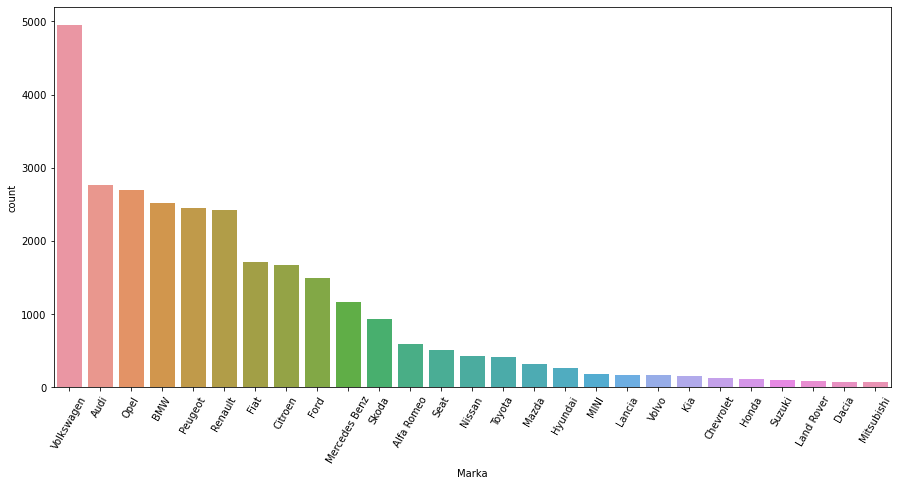

In [6]:
plt.figure(figsize=(15,7))
sns.countplot(df['Marka'], order=df['Marka'].value_counts().index)
plt.xticks(rotation=60)

<AxesSubplot:xlabel='Godiste', ylabel='Density'>

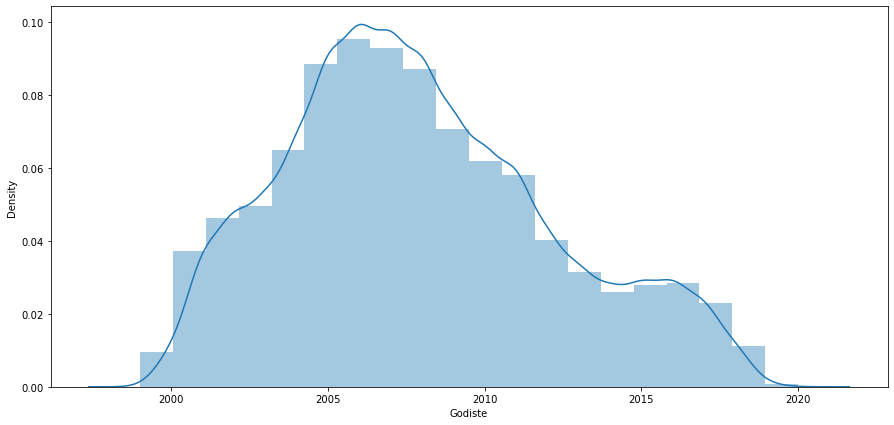

In [7]:
plt.figure(figsize=(15,7))
sns.distplot(df['Godiste'], bins=20)


<AxesSubplot:xlabel='Kilometraza', ylabel='Density'>

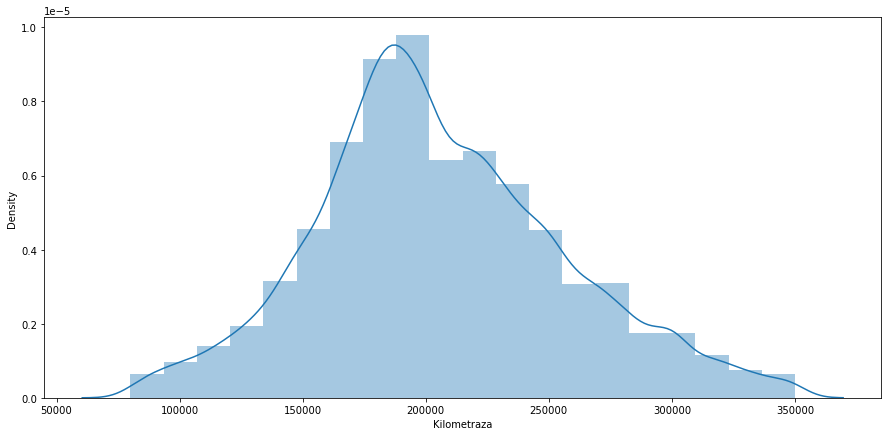

In [8]:
plt.figure(figsize=(15,7))
sns.distplot(df['Kilometraza'], bins=20)


In [9]:
df.drop(df[df['Karoserija']=='Kupe'].index, inplace=True)

<AxesSubplot:xlabel='Karoserija', ylabel='count'>

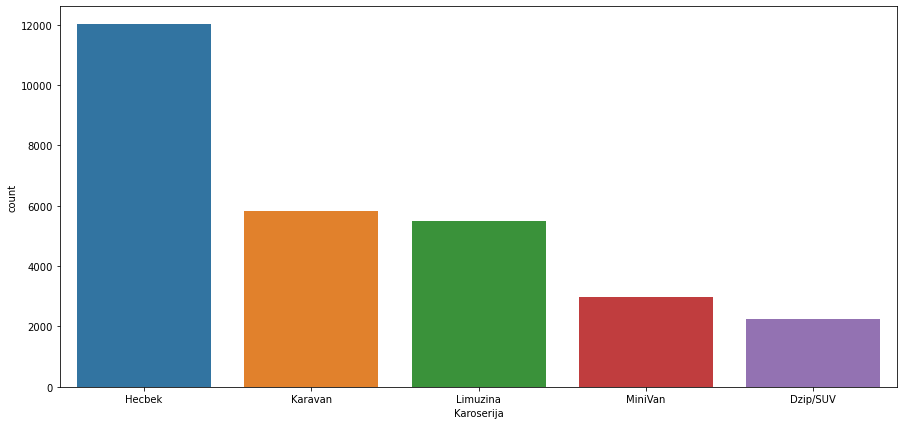

In [10]:
plt.figure(figsize=(15,7))
sns.countplot(df['Karoserija'], order=df['Karoserija'].value_counts().index)

<AxesSubplot:xlabel='Gorivo', ylabel='count'>

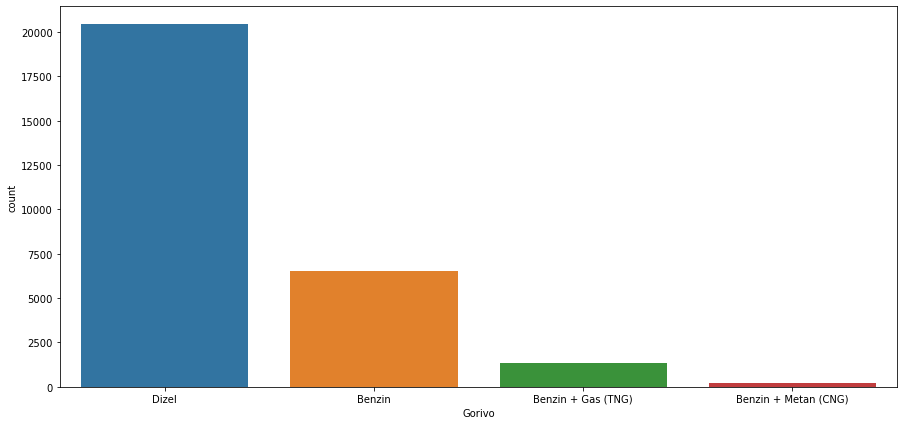

In [11]:
plt.figure(figsize=(15,7))
sns.countplot(df['Gorivo'], order=df['Gorivo'].value_counts().index)

In [12]:
df['Gorivo'].unique()

array(['Dizel', 'Benzin + Metan (CNG)', 'Benzin', 'Benzin + Gas (TNG)'],
      dtype=object)

In [13]:
df.drop(df[df['Gorivo']=='Benzin + Metan (CNG)'].index, inplace=True)

In [14]:
df['Kubikaza'].value_counts()

2.0    8759
1.6    5257
1.9    3459
1.4    2929
1.2    2213
1.5    1573
1.7     790
1.8     729
1.1     443
1.3     396
1.0     390
3.0     348
2.2     332
2.1     309
2.5     227
0.9      65
2.7      63
2.4      61
Name: Kubikaza, dtype: int64

<AxesSubplot:xlabel='Snaga motora', ylabel='Density'>

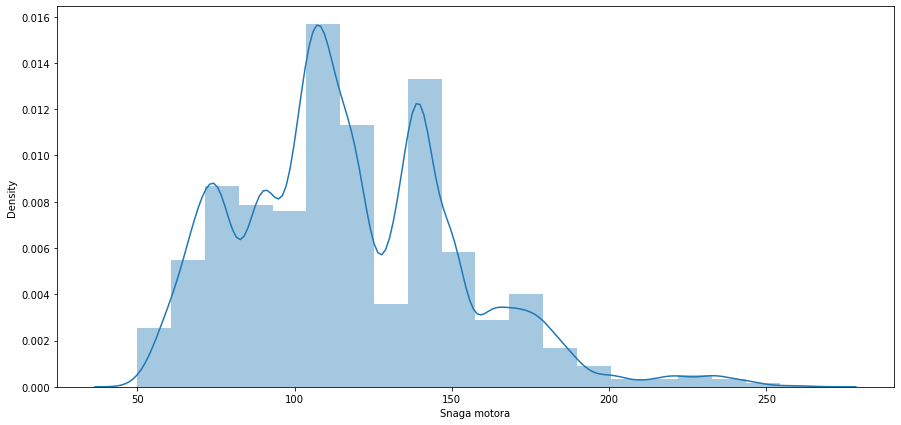

In [15]:
plt.figure(figsize=(15,7))
sns.distplot(df['Snaga motora'], bins=20)


In [16]:
df = df.groupby('Snaga motora').filter(lambda x: len(x)>30)

<AxesSubplot:xlabel='Snaga motora', ylabel='Density'>

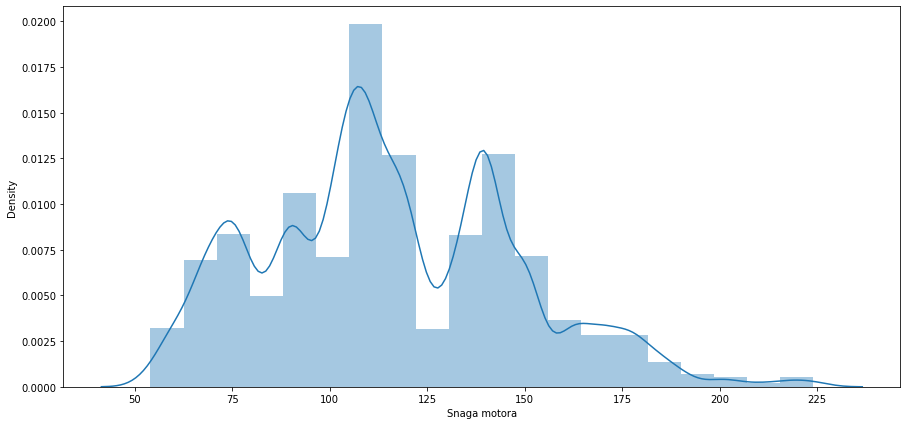

In [17]:
df.drop(df[df['Snaga motora']>=225].index, inplace=True)
plt.figure(figsize=(15,7))
sns.distplot(df['Snaga motora'], bins=20)


<AxesSubplot:xlabel='EKM', ylabel='count'>

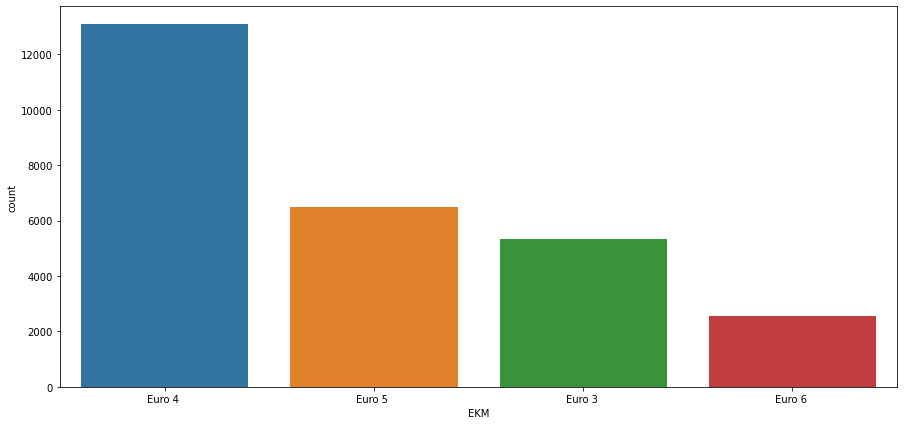

In [18]:
plt.figure(figsize=(15,7))
sns.countplot(df['EKM'], order=df['EKM'].value_counts().index)

<AxesSubplot:xlabel='Pogon', ylabel='count'>

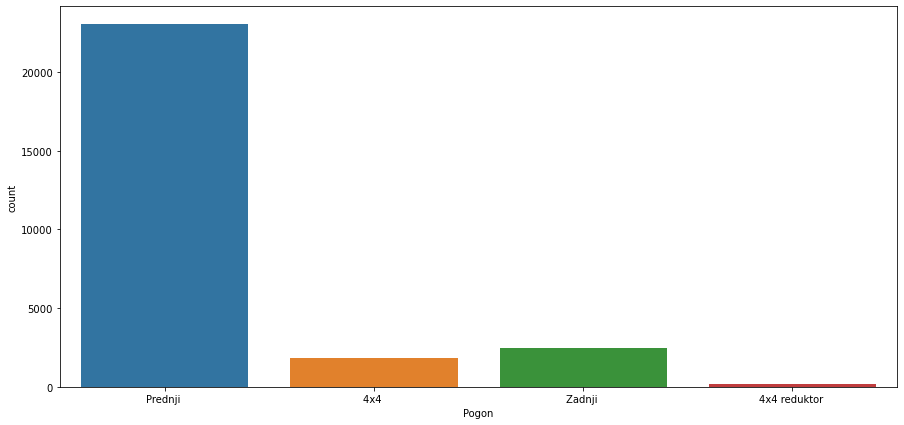

In [19]:
plt.figure(figsize=(15,7))
sns.countplot(df['Pogon'])

In [20]:
df['Pogon'].unique()

array(['Prednji ', '4x4 ', 'Zadnji ', '4x4 reduktor '], dtype=object)

In [21]:
df[(df['Pogon']=='Zadnji ')]['Marka'].value_counts()

BMW              1913
Mercedes Benz     510
Opel               10
Peugeot             8
Volkswagen          8
Audi                7
Renault             6
Ford                3
Fiat                3
Lancia              2
Citroen             2
Skoda               2
Mazda               2
Toyota              2
MINI                1
Hyundai             1
Honda               1
Name: Marka, dtype: int64

In [22]:
df.loc[df[(df['Pogon']=='Zadnji ') & (~df['Marka'].isin(['BMW', 'Mercedes Benz']))].index, 'Pogon'] = 'Prednji '
#df.drop(df[(df['Pogon']=='Zadnji ') & (~df['Marka'].isin(['BMW', 'Mercedes Benz']))].index, inplace=True)

In [23]:
df[(df['Pogon']=='Zadnji ')]['Marka'].value_counts()

BMW              1913
Mercedes Benz     510
Name: Marka, dtype: int64

In [24]:
df[df['Pogon']=='4x4 reduktor ']

,Marka,Model,Godiste,Kilometraza,Karoserija,Gorivo,Kubikaza,Snaga motora,Cena,EKM,Pogon,Menjac,Broj vrata,Broj sedista,Klima,Boja,Materijal enterijera,Boja enterijera
146,Mitsubishi,Outlander,2007,191935,Dzip/SUV,Dizel,2.0,140,6499,Euro 4,4x4 reduktor,Manuelni 6 brzina,4/5 vrata,5,Automatska klima,Crna,Stof,Crna
147,Mitsubishi,Outlander,2008,253177,Dzip/SUV,Dizel,2.0,140,6700,Euro 4,4x4 reduktor,Manuelni 6 brzina,4/5 vrata,7,Automatska klima,Siva,Prirodna koza,Crna
174,Land Rover,Freelander,2003,191216,Dzip/SUV,Dizel,1.9,111,3999,Euro 3,4x4 reduktor,Manuelni 5 brzina,4/5 vrata,5,Manuelna klima,Crna,Kombinovana koza,Bež
483,Suzuki,Grand Vitara,2008,225129,Dzip/SUV,Benzin,2.0,140,6700,Euro 4,4x4 reduktor,Manuelni 5 brzina,4/5 vrata,5,Manuelna klima,Crna,Stof,Crna
529,BMW,X3,2007,228000,Dzip/SUV,Dizel,2.0,163,6990,Euro 4,4x4 reduktor,Manuelni 6 brzina,4/5 vrata,5,Automatska klima,Siva,Stof,Crna
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27758,Fiat,Panda,2013,146500,Hecbek,Dizel,1.3,90,7490,Euro 5,4x4 reduktor,Manuelni 6 brzina,4/5 vrata,5,Manuelna klima,Bela,Stof,Smeđa
27853,Volkswagen,Touareg,2006,325594,Dzip/SUV,Dizel,3.0,224,6990,Euro 5,4x4 reduktor,Automatski / poluautomatski,4/5 vrata,5,Automatska klima,Crna,Prirodna koza,Bež
27856,Mitsubishi,Outlander,2008,266588,Dzip/SUV,Dizel,2.0,140,6650,Euro 4,4x4 reduktor,Manuelni 6 brzina,4/5 vrata,7,Manuelna klima,Siva,Velur,Crna
28230,Suzuki,Grand Vitara,2006,203000,Dzip/SUV,Dizel,1.9,129,5700,Euro 4,4x4 reduktor,Manuelni 5 brzina,4/5 vrata,5,Automatska klima,Siva,Prirodna koza,Crna


In [25]:
df.drop(df[(df['Godiste']>=2019) | (df['Godiste']<2000)].index, inplace=True)

In [26]:
for brand in df['Marka'].unique():
    print('*'*30)
    print(brand)
    for model in df[df['Marka']==brand]['Model'].unique():
        print('Model {} \n'.format(model))
        no_types = (df[(df['Model']==model)]['Karoserija'].value_counts().tolist())
        types = (df[(df['Model']==model)]['Karoserija'].value_counts().index.tolist())
        dict_t = dict(zip(types, no_types))
        print(dict_t)
        

******************************
Volkswagen
Model Passat B5.5 

{'Karavan': 196, 'Limuzina': 105}
Model Passat B6 

{'Karavan': 457, 'Limuzina': 171}
Model Golf 6 

{'Hecbek': 363, 'Karavan': 63, 'Limuzina': 21}
Model Golf 7 

{'Hecbek': 258, 'Karavan': 39, 'Limuzina': 17}
Model Polo 

{'Hecbek': 598, 'Limuzina': 49, 'Karavan': 1}
Model Tiguan 

{'Dzip/SUV': 176, 'Hecbek': 1}
Model Golf 4 

{'Hecbek': 235, 'Karavan': 72, 'Limuzina': 37}
Model Sharan 

{'MiniVan': 106, 'Karavan': 2, 'Limuzina': 1}
Model Golf 5 

{'Hecbek': 645, 'Limuzina': 60, 'Karavan': 41}
Model Passat B8 

{'Limuzina': 88, 'Karavan': 84}
Model Passat B7 

{'Karavan': 118, 'Limuzina': 66}
Model Touran 

{'MiniVan': 286, 'Limuzina': 14, 'Hecbek': 10, 'Karavan': 4, 'Dzip/SUV': 1}
Model Caddy 

{'MiniVan': 63, 'Limuzina': 2, 'Karavan': 1}
Model Passat CC 

{'Limuzina': 33, 'Hecbek': 3}
Model Bora 

{'Limuzina': 39, 'Karavan': 22}
Model Touareg 

{'Dzip/SUV': 62, 'Limuzina': 1, 'Karavan': 1}
Model Golf Plus 

{'MiniVan': 66

{'Hecbek': 48, 'Limuzina': 7}
Model 3 

{'Hecbek': 75, 'Limuzina': 12}
Model 6 

{'Karavan': 55, 'Limuzina': 54, 'Hecbek': 14}
Model 5 

{'MiniVan': 37, 'Karavan': 1, 'Limuzina': 1}
******************************
Mitsubishi
Model Outlander 

{'Dzip/SUV': 34}
Model Colt 

{'Hecbek': 26, 'Limuzina': 4, 'MiniVan': 2}
******************************
Kia
Model Sportage 

{'Dzip/SUV': 86}
Model cee`d 

{'Hecbek': 24, 'Karavan': 3, 'Limuzina': 2}
Model Sorento 

{'Dzip/SUV': 33, 'Hecbek': 1}
******************************
Chevrolet
Model Captiva 

{'Dzip/SUV': 52}
Model Cruze 

{'Limuzina': 32, 'Hecbek': 12, 'Karavan': 1}
Model Aveo 

{'Limuzina': 13, 'Hecbek': 13}
******************************
Suzuki
Model Grand Vitara 

{'Dzip/SUV': 48, 'Hecbek': 1}
Model Swift 

{'Hecbek': 33, 'Limuzina': 4}
******************************
Honda
Model Civic 

{'Hecbek': 49, 'Limuzina': 15, 'Karavan': 4}
Model Accord 

{'Limuzina': 34}
******************************
Dacia
Model Logan 

{'Limuzina': 22, 'Kara

In [27]:
df.drop(df[df['Model']=='Vectra B'].index, inplace=True)
df.drop(df[df['Model']=='Freelander'].index, inplace=True)
df.drop(df[df['Model']=='Countryman'].index, inplace=True)

In [28]:
# Volkswagen
df.loc[df[(df['Model']=='Golf 6') & (df['Karoserija']=='Limuzina')].index, 'Karoserija'] = 'Karavan'
df.loc[df[(df['Model']=='Golf 7') & (df['Karoserija']=='Limuzina')].index, 'Karoserija'] = 'Karavan'
df.loc[df[(df['Model']=='Polo') & (df['Karoserija']=='Limuzina')].index, 'Karoserija'] = 'Karavan'
df.loc[df[(df['Model']=='Golf 4') & (df['Karoserija']=='Limuzina')].index, 'Karoserija'] = 'Hecbek'
df.loc[df[(df['Model']=='Golf 5') & (df['Karoserija']=='Limuzina')].index, 'Karoserija'] = 'Hecbek'
df.loc[df[(df['Model']=='Sharan')].index, 'Karoserija'] = 'MiniVan'
df.loc[df[(df['Model']=='Touran')].index, 'Karoserija'] = 'MiniVan'
df.loc[df[(df['Model']=='Caddy')].index, 'Karoserija'] = 'MiniVan'
df.loc[df[(df['Model']=='Passat CC')].index, 'Karoserija'] = 'Limuzina'
df.loc[df[(df['Model']=='Touareg')].index, 'Karoserija'] = 'Dzip/SUV'
# Audi
df.loc[df[(df['Model']=='A3') & (df['Karoserija']=='Karavan')].index, 'Karoserija'] = 'Hecbek'
df.loc[df[(df['Model']=='A4') & (df['Karoserija']=='Hecbek')].index, 'Karoserija'] = 'Limuzina'
df.loc[df[(df['Model']=='A6') & (df['Karoserija']=='Hecbek')].index, 'Karoserija'] = 'Limuzina'
df.loc[df[(df['Model']=='Q3')].index, 'Karoserija'] = 'Dzip/SUV'
df.loc[df[(df['Model']=='A1')].index, 'Karoserija'] = 'Hecbek'
df.loc[df[(df['Model']=='A2')].index, 'Karoserija'] = 'MiniVan'
# Fiat
df.loc[df[(df['Model']=='Evo')].index, 'Karoserija'] = 'Hecbek'
df.loc[df[(df['Model']=='Bravo')].index, 'Karoserija'] = 'Hecbek'
df.loc[df[(df['Model']=='Punto')].index, 'Karoserija'] = 'Hecbek'
df.loc[df[(df['Model']=='500')].index, 'Karoserija'] = 'Hecbek'
df.loc[df[(df['Model']=='500L')].index, 'Karoserija'] = 'MiniVan'
df.loc[df[(df['Model']=='Stilo') & (df['Karoserija']=='Limuzina')].index, 'Karoserija'] = 'Karavan'
df.loc[df[(df['Model']=='Panda')].index, 'Karoserija'] = 'Hecbek'
df.loc[df[(df['Model']=='Doblo')].index, 'Karoserija'] = 'MiniVan'
df.loc[df[(df['Model']=='Idea')].index, 'Karoserija'] = 'MiniVan'
df.loc[df[(df['Model']=='Idea')].index, 'Karoserija'] = 'Karavan'
df.loc[df[(df['Model']=='Multipla')].index, 'Karoserija'] = 'MiniVan'
# Ford
df.loc[df[(df['Model']=='C-Max')].index, 'Karoserija'] = 'MiniVan'
df.loc[df[(df['Model']=='Focus') & (df['Karoserija']=='MiniVan')].index, 'Karoserija'] = 'Karavan'
df.loc[df[(df['Model']=='Fusion')].index, 'Karoserija'] = 'Hecbek'
df.loc[df[(df['Model']=='Galaxy')].index, 'Karoserija'] = 'MiniVan'
# Skoda
df.loc[df[(df['Model']=='Fabia') & (df['Karoserija']=='Limuzina')].index, 'Karoserija'] = 'Hecbek'
df.loc[df[(df['Model']=='Superb') & (df['Karoserija']=='Hecbek')].index, 'Karoserija'] = 'Limuzina'
df.loc[df[(df['Model']=='Rapid')].index, 'Karoserija'] = 'Hecbek'
# Renault
df.loc[df[(df['Model']=='Espace')].index, 'Karoserija'] = 'MiniVan'
df.loc[df[(df['Model']=='Scenic')].index, 'Karoserija'] = 'MiniVan'
df.loc[df[(df['Model']=='Grand Scenic')].index, 'Karoserija'] = 'MiniVan'
df.loc[df[(df['Model']=='Clio') & (df['Karoserija']=='MiniVan')].index, 'Karoserija'] = 'Hecbek'
df.loc[df[(df['Model']=='Clio') & (df['Karoserija']=='MiniVan')].index, 'Karoserija'] = 'Hecbek'
df.loc[df[(df['Model']=='Twingo')].index, 'Karoserija'] = 'Hecbek'
df.loc[df[(df['Model']=='Captur')].index, 'Karoserija'] = 'Dzip/SUV'
df.loc[df[(df['Model']=='Kangoo')].index, 'Karoserija'] = 'MiniVan'
df.loc[df[(df['Model']=='Ibiza') & (df['Karoserija']=='Limuzina')].index, 'Karoserija'] = 'Karavan'
df.loc[df[(df['Model']=='Leon') & (df['Karoserija']=='Limuzina')].index, 'Karoserija'] = 'Hecbek'
df.loc[df[(df['Model']=='Altea')].index, 'Karoserija'] = 'MiniVan'
# Citroen
df.loc[df[(df['Model']=='C3')].index, 'Karoserija'] = 'Hecbek'
df.loc[df[(df['Model']=='C5') & (df['Karoserija']=='Hecbek')].index, 'Karoserija'] = 'Karavan'
df.loc[df[(df['Model']=='C3 Picasso')].index, 'Karoserija'] = 'MiniVan'
df.loc[df[(df['Model']=='C4')].index, 'Karoserija'] = 'Hecbek'
df.loc[df[(df['Model']=='C4 Grand Picasso')].index, 'Karoserija'] = 'MiniVan'
df.loc[df[(df['Model']=='C1')].index, 'Karoserija'] = 'Hecbek'
df.loc[df[(df['Model']=='C2')].index, 'Karoserija'] = 'Hecbek'
df.loc[df[(df['Model']=='C4 Picasso')].index, 'Karoserija'] = 'MiniVan'
df.loc[df[(df['Model']=='Berlingo')].index, 'Karoserija'] = 'MiniVan'
df.loc[df[(df['Model']=='Xsara Picasso')].index, 'Karoserija'] = 'MiniVan'
# Opel
df.loc[df[(df['Model']=='Agila')].index, 'Karoserija'] = 'Hecbek'
df.loc[df[(df['Model']=='Meriva')].index, 'Karoserija'] = 'MiniVan'
df.loc[df[(df['Model']=='Zafira')].index, 'Karoserija'] = 'MiniVan'
df.loc[df[(df['Model']=='Astra J') & (df['Karoserija']=='Limuzina')].index, 'Karoserija'] = 'Hecbek'
df.loc[df[(df['Model']=='Corsa D')].index, 'Karoserija'] = 'Hecbek'
df.loc[df[(df['Model']=='Corsa E')].index, 'Karoserija'] = 'Hecbek'
df.loc[df[(df['Model']=='Corsa C')].index, 'Karoserija'] = 'Hecbek'
df.loc[df[(df['Model']=='Vectra C') & (df['Karoserija']=='Hecbek')].index, 'Karoserija'] = 'Limuzina'
df.loc[df[(df['Model']=='Antara')].index, 'Karoserija'] = 'Dzip/SUV'
# Peugeot
df.loc[df[(df['Model']=='308') & (df['Karoserija']=='Limuzina')].index, 'Karoserija'] = 'Hecbek'
df.loc[df[(df['Model']=='308') & (df['Karoserija']=='Dzip/SUV')].index, 'Karoserija'] = 'Hecbek'
df.loc[df[(df['Model']=='207') & (df['Karoserija']=='Limuzina')].index, 'Karoserija'] = 'Hecbek'
df.loc[df[(df['Model']=='208')].index, 'Karoserija'] = 'Hecbek'
df.loc[df[(df['Model']=='107')].index, 'Karoserija'] = 'Hecbek'
df.loc[df[(df['Model']=='407') & (df['Karoserija']=='Hecbek')].index, 'Karoserija'] = 'Limuzina'
df.loc[df[(df['Model']=='307')].index, 'Karoserija'] = 'Hecbek'
df.loc[df[(df['Model']=='3008')].index, 'Karoserija'] = 'Dzip/SUV'
df.loc[df[(df['Model']=='2008')].index, 'Karoserija'] = 'Dzip/SUV'
df.loc[df[(df['Model']=='206') & (df['Karoserija']=='Limuzina')].index, 'Karoserija'] = 'Hecbek'
df.loc[df[(df['Model']=='5008') & (df['Karoserija']=='Hecbek')].index, 'Karoserija'] = 'MiniVan'
# BMW 
df.loc[df[(df['Model']=='320') & (df['Karoserija']=='Hecbek')].index, 'Karoserija'] = 'Limuzina'
df.loc[df[(df['Model']=='118')].index, 'Karoserija'] = 'Hecbek'
df.loc[df[(df['Model']=='116')].index, 'Karoserija'] = 'Hecbek'
df.loc[df[(df['Model']=='120')].index, 'Karoserija'] = 'Hecbek'
df.loc[df[(df['Model']=='X3')].index, 'Karoserija'] = 'Dzip/SUV'
df.loc[df[(df['Model']=='X1')].index, 'Karoserija'] = 'Dzip/SUV'
df.loc[df[(df['Model']=='X5')].index, 'Karoserija'] = 'Dzip/SUV'
df.loc[df[(df['Model']=='318') & (df['Karoserija']=='Hecbek')].index, 'Karoserija'] = 'Limuzina'
df.loc[df[(df['Model']=='316') & (df['Karoserija']=='Hecbek')].index, 'Karoserija'] = 'Limuzina'
# Mini
df.loc[df[(df['Model']=='Cooper')].index, 'Karoserija'] = 'Hecbek'
#df.loc[df[(df['Model']=='Countryman')].index, 'Karoserija'] = 'Dzip/SUV'
df.loc[df[(df['Model']=='One')].index, 'Karoserija'] = 'Hecbek'
# Mercedes Benz
df.loc[df[(df['Model']=='B 180')].index, 'Karoserija'] = 'MiniVan'
df.loc[df[(df['Model']=='B 200')].index, 'Karoserija'] = 'MiniVan'
df.loc[df[(df['Model']=='C 200') & (df['Karoserija']=='Hecbek')].index, 'Karoserija'] = 'Limuzina'
df.loc[df[(df['Model']=='C 220') & (df['Karoserija']=='Hecbek')].index, 'Karoserija'] = 'Limuzina'
df.loc[df[(df['Model']=='C 180') & (df['Karoserija']=='Hecbek')].index, 'Karoserija'] = 'Limuzina'
df.loc[df[(df['Model']=='A 160')].index, 'Karoserija'] = 'Hecbek'
df.loc[df[(df['Model']=='A 180')].index, 'Karoserija'] = 'Hecbek'
df.loc[df[(df['Model']=='A 170')].index, 'Karoserija'] = 'Hecbek'
df.loc[df[(df['Model']=='A 150')].index, 'Karoserija'] = 'Hecbek'
# Hyundai
df.loc[df[(df['Model']=='i20')].index, 'Karoserija'] = 'Hecbek'
df.loc[df[(df['Model']=='Getz')].index, 'Karoserija'] = 'Hecbek'
df.loc[df[(df['Model']=='i30') & (df['Karoserija']=='Limuzina')].index, 'Karoserija'] = 'Hecbek'
# Nissan
df.loc[df[(df['Model']=='Qashqai')].index, 'Karoserija'] = 'Dzip/SUV'
df.loc[df[(df['Model']=='Juke')].index, 'Karoserija'] = 'Dzip/SUV'
df.loc[df[(df['Model']=='Micra')].index, 'Karoserija'] = 'Hecbek'
df.loc[df[(df['Model']=='Note')].index, 'Karoserija'] = 'Hecbek'
# Alfa Romeo
df.loc[df[(df['Model']=='Giulietta')].index, 'Karoserija'] = 'Hecbek'
df.loc[df[(df['Model']=='147')].index, 'Karoserija'] = 'Hecbek'
# Toyota
df.loc[df[(df['Model']=='Aygo')].index, 'Karoserija'] = 'Hecbek'
df.loc[df[(df['Model']=='Auris')].index, 'Karoserija'] = 'Hecbek'
df.loc[df[(df['Model']=='Yaris')].index, 'Karoserija'] = 'Hecbek'
df.loc[df[(df['Model']=='Avensis') & (df['Karoserija']=='Hecbek')].index, 'Karoserija'] = 'Limuzina'
# Lancia
df.loc[df[(df['Model']=='Ypsilon')].index, 'Karoserija'] = 'Hecbek'
df.loc[df[(df['Model']=='Delta')].index, 'Karoserija'] = 'Hecbek'
df.loc[df[(df['Model']=='Musa')].index, 'Karoserija'] = 'MiniVan'
# Land Rover
df.loc[df[(df['Model']=='Freelander')].index, 'Karoserija'] = 'Dzip/SUV'
# Mazda
df.loc[df[(df['Model']=='2')].index, 'Karoserija'] = 'Hecbek'
df.loc[df[(df['Model']=='6') & (df['Karoserija']=='Hecbek')].index, 'Karoserija'] = 'Limuzina'
df.loc[df[(df['Model']=='5')].index, 'Karoserija'] = 'MiniVan'
# Mitsubishi
df.loc[df[(df['Model']=='Colt')].index, 'Karoserija'] = 'Hecbek'
# Kia
df.loc[df[(df['Model']=='cee`d') & (df['Karoserija']=='Limuzina')].index, 'Karoserija'] = 'Hecbek'
df.loc[df[(df['Model']=='Sorento')].index, 'Karoserija'] = 'Dzip/SUV'
# Suzuki
df.loc[df[(df['Model']=='Grand Vitara')].index, 'Karoserija'] = 'Dzip/SUV'
df.loc[df[(df['Model']=='Swift')].index, 'Karoserija'] = 'Hecbek'
# Dacia
df.loc[df[(df['Model']=='Logan') & (df['Karoserija']=='Hecbek')].index, 'Karoserija'] = 'Limuzina'
df.loc[df[(df['Model']=='Sandero')].index, 'Karoserija'] = 'Hecbek'

# Pogon 
df.loc[df[(df['Pogon']=='4x4 reduktor ')].index, 'Pogon'] = '4x4 '
df.loc[df[(df['Menjac']=='Automatski ')].index, 'Menjac'] = 'Automatski / poluautomatski '

In [29]:
df['Menjac'].unique()

array(['Manuelni 6 brzina ', 'Manuelni 5 brzina ',
       'Automatski / poluautomatski '], dtype=object)

In [30]:
for brand in df['Marka'].unique():
    print('*'*30)
    print(brand)
    for model in df[df['Marka']==brand]['Model'].unique():
        print('Model {} \n'.format(model))
        no_types = (df[(df['Model']==model)]['Karoserija'].value_counts().tolist())
        types = (df[(df['Model']==model)]['Karoserija'].value_counts().index.tolist())
        dict_t = dict(zip(types, no_types))
        print(dict_t)

******************************
Volkswagen
Model Passat B5.5 

{'Karavan': 196, 'Limuzina': 105}
Model Passat B6 

{'Karavan': 457, 'Limuzina': 171}
Model Golf 6 

{'Hecbek': 363, 'Karavan': 84}
Model Golf 7 

{'Hecbek': 258, 'Karavan': 56}
Model Polo 

{'Hecbek': 598, 'Karavan': 50}
Model Tiguan 

{'Dzip/SUV': 176, 'Hecbek': 1}
Model Golf 4 

{'Hecbek': 272, 'Karavan': 72}
Model Sharan 

{'MiniVan': 109}
Model Golf 5 

{'Hecbek': 705, 'Karavan': 41}
Model Passat B8 

{'Limuzina': 88, 'Karavan': 84}
Model Passat B7 

{'Karavan': 118, 'Limuzina': 66}
Model Touran 

{'MiniVan': 315}
Model Caddy 

{'MiniVan': 66}
Model Passat CC 

{'Limuzina': 36}
Model Bora 

{'Limuzina': 39, 'Karavan': 22}
Model Touareg 

{'Dzip/SUV': 64}
Model Golf Plus 

{'MiniVan': 66, 'Hecbek': 32, 'Limuzina': 7}
Model Jetta 

{'Limuzina': 35}
Model Passat B5 

{'Karavan': 22, 'Limuzina': 6}
Model Fox 

{'Hecbek': 29, 'Limuzina': 3}
******************************
Audi
Model A3 

{'Hecbek': 598, 'Limuzina': 60}
Model 

<AxesSubplot:xlabel='Menjac', ylabel='count'>

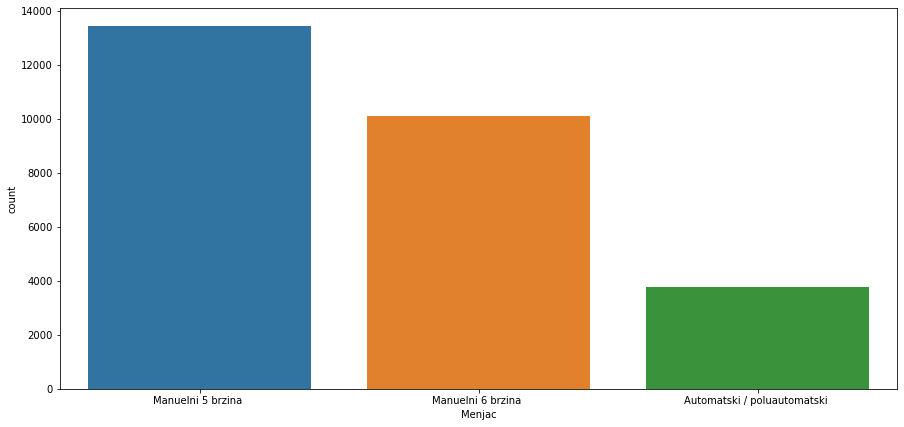

In [31]:
plt.figure(figsize=(15,7))
sns.countplot(df['Menjac'], order = df['Menjac'].value_counts().index)

([<matplotlib.axis.XTick at 0x27d83d593a0>,
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

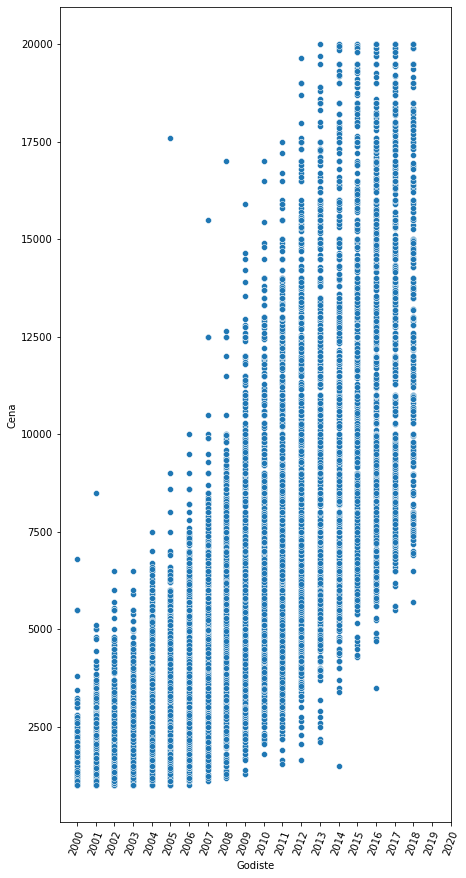

In [32]:
plt.figure(figsize=(7,15))
sns.scatterplot(df['Godiste'], df['Cena'])
plt.xticks(np.arange(2000,2021), rotation=70)

In [33]:
for i in range(6):
    for year in range(2000,2021):
        max = df[df['Godiste']==year]['Cena'].max()
        min = df[df['Godiste']==year]['Cena'].min()
        df.drop(df[(df['Godiste']==year) & (df['Cena']==max)].index, inplace=True)
        df.drop(df[(df['Godiste']==year) & (df['Cena']==min)].index, inplace=True)

In [34]:
for i in range(4):
    for year in range(2007,2015):
        max = df[df['Godiste']==year]['Cena'].max()
        #min = df[df['Godiste']==year]['Cena'].min()
        df.drop(df[(df['Godiste']==year) & (df['Cena']==max)].index, inplace=True)
        #df.drop(df[(df['Godiste']==year) & (df['Cena']==min)].index, inplace=True)

([<matplotlib.axis.XTick at 0x27d843ed190>,
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

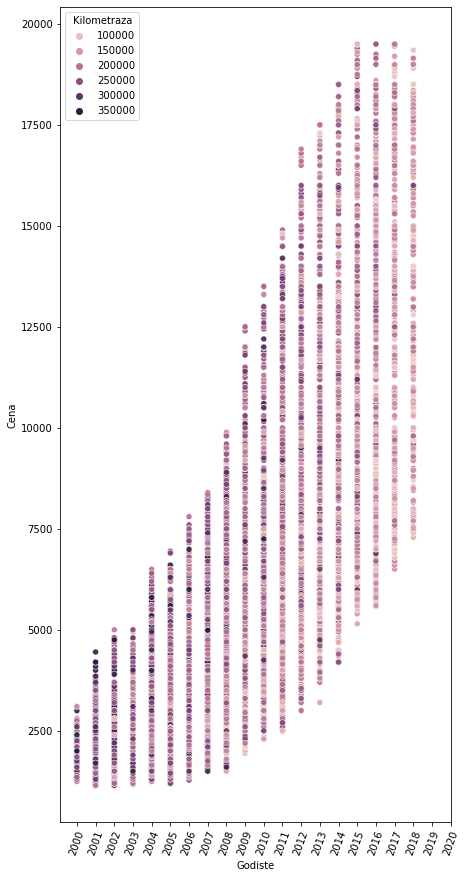

In [35]:
plt.figure(figsize=(7,15))
sns.scatterplot(df['Godiste'], df['Cena'], data=df, hue='Kilometraza')
plt.xticks(np.arange(2000,2021), rotation=70)

In [36]:
df = df.groupby('Model').filter(lambda x: len(x)>=30)

<AxesSubplot:xlabel='Kilometraza'>

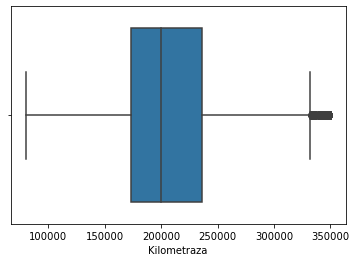

In [37]:
sns.boxplot(df['Kilometraza'])

In [38]:
df.drop(df[(df['Kilometraza']>=320000)].index, inplace=True)

<AxesSubplot:xlabel='Kilometraza'>

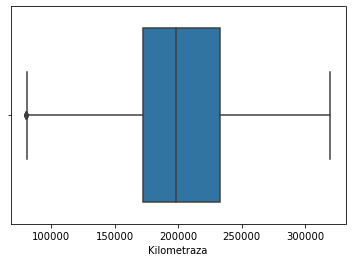

In [39]:
sns.boxplot(df['Kilometraza'])

<AxesSubplot:xlabel='Cena'>

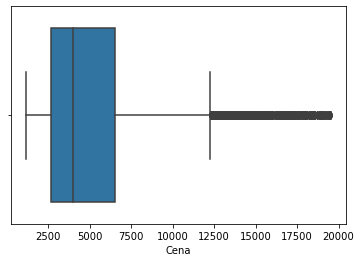

In [40]:
sns.boxplot(df['Cena'])

In [41]:
#df.drop(df[(df['Cena']>=12000)].index, inplace=True)

In [42]:
df

,Marka,Model,Godiste,Kilometraza,Karoserija,Gorivo,Kubikaza,Snaga motora,Cena,EKM,Pogon,Menjac,Broj vrata,Broj sedista,Klima,Boja,Materijal enterijera,Boja enterijera
0,Volkswagen,Passat B5.5,2003,217000,Karavan,Dizel,1.9,131,1850,Euro 3,Prednji,Manuelni 6 brzina,4/5 vrata,5,Automatska klima,Srebrna,Stof,Crna
2,Volkswagen,Passat B6,2008,244000,Limuzina,Dizel,1.9,105,5499,Euro 4,Prednji,Manuelni 5 brzina,4/5 vrata,5,Manuelna klima,Plava,Stof,Crna
3,Audi,A3,2013,164000,Hecbek,Dizel,2.0,150,11200,Euro 5,Prednji,Manuelni 6 brzina,2/3 vrata,5,Automatska klima,Bela,Stof,Siva
4,Fiat,Grande Punto,2012,95987,Hecbek,Benzin,1.4,77,4699,Euro 5,Prednji,Manuelni 5 brzina,4/5 vrata,5,Manuelna klima,Bela,Stof,Crna
5,Volkswagen,Golf 6,2009,219000,Hecbek,Dizel,2.0,110,6950,Euro 5,Prednji,Manuelni 5 brzina,4/5 vrata,5,Automatska klima,Crna,Stof,Crna
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28539,Seat,Leon,2010,223891,Hecbek,Benzin,1.4,124,4700,Euro 5,Prednji,Manuelni 6 brzina,4/5 vrata,5,Manuelna klima,Siva,Druga,Crna
28540,Ford,Focus,2006,270500,Hecbek,Benzin,1.8,125,2999,Euro 4,Prednji,Manuelni 5 brzina,4/5 vrata,5,Automatska klima,Siva,Velur,Siva
28541,Audi,A4,2008,215400,Limuzina,Dizel,2.0,140,7900,Euro 5,Prednji,Automatski / poluautomatski,4/5 vrata,5,Automatska klima,Crna,Kombinovana koza,Crna
28542,Mercedes Benz,A 170,2002,230000,Hecbek,Dizel,1.7,95,1500,Euro 3,Prednji,Manuelni 5 brzina,4/5 vrata,5,Manuelna klima,Bordo,Stof,Siva


<AxesSubplot:>

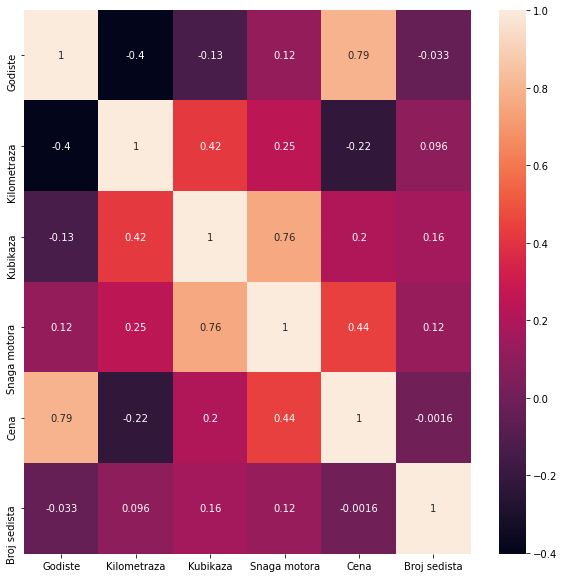

In [43]:
plt.figure(figsize=(10,10))
sns.heatmap(df.corr(), annot=True)

### Engine power

In [44]:
for model in df['Model'].unique():
    print('-'*30)
    print('Model: {}'.format(model))
    power = sorted(list(df[df['Model']==model]['Snaga motora'].unique()))
    print(power)
    base=5
    new_power = sorted(set([base * round(a_number/base) for a_number in power]))
    print('Converted')
    print(new_power)
        

------------------------------
Model: Passat B5.5
[101, 102, 105, 116, 129, 131, 136, 150, 163, 179]
Converted
[100, 105, 115, 130, 135, 150, 165, 180]
------------------------------
Model: Passat B6
[101, 105, 109, 110, 116, 121, 122, 136, 139, 140, 141, 143, 150, 160, 170, 200]
Converted
[100, 105, 110, 115, 120, 135, 140, 145, 150, 160, 170, 200]
------------------------------
Model: A3
[75, 90, 101, 102, 105, 109, 110, 116, 122, 124, 125, 131, 136, 139, 140, 141, 150, 160, 170, 179, 184, 200]
Converted
[75, 90, 100, 105, 110, 115, 120, 125, 130, 135, 140, 150, 160, 170, 180, 185, 200]
------------------------------
Model: Grande Punto
[64, 65, 68, 69, 75, 77, 80, 84, 86, 90, 94, 95, 105, 120, 129, 131, 135, 155]
Converted
[65, 70, 75, 80, 85, 90, 95, 105, 120, 130, 135, 155]
------------------------------
Model: Golf 6
[79, 80, 86, 90, 102, 105, 109, 110, 120, 121, 122, 129, 136, 139, 140, 160, 163, 170, 204, 211]
Converted
[80, 85, 90, 100, 105, 110, 120, 130, 135, 140, 160, 165, 

[69, 75, 90, 95, 101, 116]
Converted
[70, 75, 90, 95, 100, 115]
------------------------------
Model: Juke
[109, 110, 116, 117, 190, 200]
Converted
[110, 115, 190, 200]
------------------------------
Model: Insignia
[109, 110, 117, 120, 129, 131, 136, 140, 160, 162, 163, 170]
Converted
[110, 115, 120, 130, 135, 140, 160, 165, 170]
------------------------------
Model: C4 Grand Picasso
[109, 110, 111, 116, 120, 136, 150, 163]
Converted
[110, 115, 120, 135, 150, 165]
------------------------------
Model: Laguna
[101, 102, 105, 107, 109, 110, 111, 117, 120, 121, 131, 135, 139, 140, 150, 163, 170, 179]
Converted
[100, 105, 110, 115, 120, 130, 135, 140, 150, 165, 170, 180]
------------------------------
Model: 206
[54, 60, 68, 69, 75, 79, 80, 82, 88, 90, 109, 136, 156, 177]
Converted
[55, 60, 70, 75, 80, 90, 110, 135, 155, 175]
------------------------------
Model: Captur
[90, 94, 110, 120]
Converted
[90, 95, 110, 120]
------------------------------
Model: Astra G
[65, 68, 73, 75, 79, 80, 8

In [45]:
base = 5
df['Snaga motora'] = df['Snaga motora'].apply(lambda x: int(base * round(x/base)))

In [46]:
#vc = df['Model'].value_counts()
#print(vc[vc > 30])

In [47]:
for kubikaza in sorted(df['Kubikaza'].unique()):
    print(kubikaza)
    print('-'*30)
    print(sorted(df[df['Kubikaza']==kubikaza]['Snaga motora'].unique()))

0.9
------------------------------
[70, 80, 85, 90, 95, 100, 105]
1.0
------------------------------
[60, 65, 70, 75, 95, 100, 105, 110, 115, 125, 170]
1.1
------------------------------
[55, 60, 65, 75, 80, 100, 105]
1.2
------------------------------
[55, 60, 65, 70, 75, 80, 85, 90, 95, 100, 105, 110, 115, 120, 130, 140, 150]
1.3
------------------------------
[60, 65, 70, 75, 80, 85, 90, 95, 100, 105]
1.4
------------------------------
[55, 60, 65, 70, 75, 80, 85, 90, 95, 100, 105, 110, 115, 120, 125, 130, 135, 140, 150, 155, 160, 165, 170, 180, 205]
1.5
------------------------------
[60, 65, 70, 75, 80, 85, 90, 95, 100, 105, 110, 115, 120, 130, 135, 140, 150]
1.6
------------------------------
[60, 70, 75, 80, 85, 90, 95, 100, 105, 110, 115, 120, 125, 130, 135, 140, 150, 155, 160, 165, 170, 175, 180, 190, 200, 210]
1.7
------------------------------
[55, 65, 70, 75, 80, 90, 95, 100, 105, 110, 115, 120, 125, 130, 135, 140, 150, 200]
1.8
------------------------------
[75, 80, 85, 9

In [48]:
df[(df['Kubikaza']==2.0) & (df['Snaga motora']<75)]

,Marka,Model,Godiste,Kilometraza,Karoserija,Gorivo,Kubikaza,Snaga motora,Cena,EKM,Pogon,Menjac,Broj vrata,Broj sedista,Klima,Boja,Materijal enterijera,Boja enterijera
215,Volkswagen,Caddy,2005,205000,MiniVan,Dizel,2.0,70,3699,Euro 4,Prednji,Manuelni 5 brzina,4/5 vrata,5,Manuelna klima,Plava,Stof,Druga
4204,Volkswagen,Caddy,2005,195000,MiniVan,Dizel,2.0,70,2900,Euro 3,Prednji,Manuelni 5 brzina,4/5 vrata,5,Nema klimu,Žuta,Stof,Crna
4797,Volkswagen,Caddy,2006,235000,MiniVan,Dizel,2.0,70,3250,Euro 4,Prednji,Manuelni 5 brzina,2/3 vrata,2,Nema klimu,Žuta,Stof,Crna
8650,Volkswagen,Caddy,2005,313000,MiniVan,Dizel,2.0,70,3500,Euro 3,Prednji,Manuelni 5 brzina,4/5 vrata,7,Nema klimu,Žuta,Stof,Crna
14183,Volkswagen,Caddy,2005,231866,MiniVan,Dizel,2.0,70,3600,Euro 4,Prednji,Manuelni 5 brzina,2/3 vrata,2,Nema klimu,Crvena,Stof,Siva
17084,Peugeot,206,2003,218674,Hecbek,Dizel,2.0,70,1899,Euro 4,Prednji,Manuelni 5 brzina,4/5 vrata,5,Manuelna klima,Siva,Stof,Bež
21996,Volkswagen,Caddy,2006,224000,MiniVan,Dizel,2.0,70,4100,Euro 3,Prednji,Manuelni 5 brzina,4/5 vrata,5,Manuelna klima,Bela,Stof,Crna
22203,Seat,Ibiza,2002,260000,Hecbek,Benzin,2.0,65,1399,Euro 3,Prednji,Manuelni 5 brzina,4/5 vrata,5,Nema klimu,Plava,Stof,Siva
25529,Volkswagen,Caddy,2004,245000,MiniVan,Dizel,2.0,70,3750,Euro 3,Prednji,Manuelni 5 brzina,4/5 vrata,5,Manuelna klima,Siva,Stof,Siva
27884,Volkswagen,Caddy,2005,195000,MiniVan,Dizel,2.0,70,2900,Euro 3,Prednji,Manuelni 5 brzina,4/5 vrata,5,Nema klimu,Žuta,Stof,Crna


In [49]:
df.count()[0]

25719

In [50]:
df_new = pd.DataFrame()
for kubikaza in sorted(df['Kubikaza'].unique()):
    print(kubikaza)
    print('-'*30)
    print(df[df['Kubikaza']==kubikaza]['Snaga motora'].value_counts())
    df_new = df_new.append(df[df['Kubikaza']==kubikaza].groupby("Snaga motora").filter(lambda x: len(x) >= 4))

0.9
------------------------------
90     30
85     21
80      2
105     2
70      1
95      1
100     1
Name: Snaga motora, dtype: int64
1.0
------------------------------
70     222
60      73
65      25
125     16
100     12
115      7
110      3
75       2
95       2
105      2
170      1
Name: Snaga motora, dtype: int64
1.1
------------------------------
60     139
75     138
100     40
55      38
65       7
105      3
80       2
Name: Snaga motora, dtype: int64
1.2
------------------------------
75     495
70     335
60     297
80     230
85     163
65     159
95     109
90      84
55      84
105     65
100     19
115     12
130      7
110      6
120      2
150      1
140      1
Name: Snaga motora, dtype: int64
1.3
------------------------------
75     88
85     59
90     59
70     56
95     44
100    25
60      7
80      6
105     2
65      1
Name: Snaga motora, dtype: int64
1.4
------------------------------
75     700
70     526
90     391
95     234
80     212
120    173
100 

In [51]:
df = df_new

In [52]:
for kubikaza in sorted(df['Kubikaza'].unique()):
    print(kubikaza)
    print('-'*30)
    print(df[df['Kubikaza']==kubikaza]['Snaga motora'].value_counts())

0.9
------------------------------
90    30
85    21
Name: Snaga motora, dtype: int64
1.0
------------------------------
70     222
60      73
65      25
125     16
100     12
115      7
Name: Snaga motora, dtype: int64
1.1
------------------------------
60     139
75     138
100     40
55      38
65       7
Name: Snaga motora, dtype: int64
1.2
------------------------------
75     495
70     335
60     297
80     230
85     163
65     159
95     109
90      84
55      84
105     65
100     19
115     12
130      7
110      6
Name: Snaga motora, dtype: int64
1.3
------------------------------
75     88
85     59
90     59
70     56
95     44
100    25
60      7
80      6
Name: Snaga motora, dtype: int64
1.4
------------------------------
75     700
70     526
90     391
95     234
80     212
120    173
100    136
140     81
150     51
85      49
125     44
60      30
170     22
160     20
130     17
105     15
155     15
135     14
110     11
55       6
180      4
Name: Snaga motora, d

In [53]:
df_new = pd.DataFrame()
for model in sorted(df['Model'].unique()):
    print(model)
    print('-'*30)
    print(df[df['Model']==model]['Snaga motora'].value_counts())
    df_new = df_new.append(df[df['Model']==model].groupby("Snaga motora").filter(lambda x: len(x) >= 3))
df = df_new

107
------------------------------
70    35
55     1
Name: Snaga motora, dtype: int64
116
------------------------------
115    86
120    22
135    17
90      1
Name: Snaga motora, dtype: int64
118
------------------------------
145    69
120    65
150     9
135     6
130     2
115     1
140     1
190     1
Name: Snaga motora, dtype: int64
120
------------------------------
165    50
175    15
160     8
150     4
185     4
190     4
145     1
170     1
200     1
Name: Snaga motora, dtype: int64
147
------------------------------
120    51
115    48
105    30
150    28
140     6
110     3
170     2
100     1
190     1
Name: Snaga motora, dtype: int64
156
------------------------------
115    25
140    19
150     9
110     8
120     3
155     1
Name: Snaga motora, dtype: int64
159
------------------------------
150    112
120     29
170      5
140      4
115      2
135      2
165      1
Name: Snaga motora, dtype: int64
2
------------------------------
75     19
70     16
85      8
80    

170    66
145    21
150    10
135     4
115     2
140     1
205     1
125     1
Name: Snaga motora, dtype: int64
C-Max
------------------------------
110    39
115    37
135    22
90     20
125    15
100    14
95      6
120     5
105     2
140     2
75      1
130     1
150     1
Name: Snaga motora, dtype: int64
C1
------------------------------
70    68
55     4
75     1
Name: Snaga motora, dtype: int64
C2
------------------------------
60     18
70     16
75      8
120     4
110     1
Name: Snaga motora, dtype: int64
C3
------------------------------
70     153
75     110
60      50
90      41
95      15
110     15
100     13
80       9
120      4
Name: Snaga motora, dtype: int64
C3 Picasso
------------------------------
90     23
110    21
95     14
100     1
115     1
Name: Snaga motora, dtype: int64
C4
------------------------------
90     120
110     74
100     41
120     17
135     16
115      9
150      4
140      3
95       2
155      2
Name: Snaga motora, dtype: int64
C4 Grand

100    151
75      58
90      27
105     22
95      15
110     15
125     14
85      10
120      8
140      5
70       4
130      3
180      2
Name: Snaga motora, dtype: int64
MiTo
------------------------------
120    17
155    11
95      8
85      6
105     5
135     4
80      4
90      4
170     3
115     2
70      1
75      1
Name: Snaga motora, dtype: int64
Micra
------------------------------
80    31
65    22
90    10
85     6
60     2
Name: Snaga motora, dtype: int64
Modus
------------------------------
75     32
100    16
85     15
65     10
70     10
80      6
90      6
110     6
105     2
Name: Snaga motora, dtype: int64
Mondeo
------------------------------
115    45
130    32
140    31
150    18
125    17
90      7
120     7
165     4
110     2
135     2
100     1
155     1
180     1
Name: Snaga motora, dtype: int64
Musa
------------------------------
95     16
70      9
100     9
90      4
75      3
80      1
120     1
Name: Snaga motora, dtype: int64
Note
---------------

In [54]:
df.count()[0]

25111

In [55]:
df_new = pd.DataFrame()
for model in sorted(df['Model'].unique()):
    print(model)
    print('-'*30)
    df_new = df_new.append(df[df['Model']==model].groupby("Kubikaza").filter(lambda x: len(x) >= 3))
    print(df[df['Model']==model]['Kubikaza'].value_counts())
df = df_new

107
------------------------------
1.0    35
Name: Kubikaza, dtype: int64
116
------------------------------
1.6    68
2.0    43
1.5    14
Name: Kubikaza, dtype: int64
118
------------------------------
2.0    146
1.9      3
Name: Kubikaza, dtype: int64
120
------------------------------
2.0    85
Name: Kubikaza, dtype: int64
147
------------------------------
1.9    113
1.6     51
2.0      2
Name: Kubikaza, dtype: int64
156
------------------------------
1.9    51
1.7     4
2.0     3
1.6     2
1.8     2
2.4     2
Name: Kubikaza, dtype: int64
159
------------------------------
1.9    134
2.0     12
1.8      4
Name: Kubikaza, dtype: int64
2
------------------------------
1.4    24
1.3    17
1.2     8
1.7     1
Name: Kubikaza, dtype: int64
2008
------------------------------
1.6    22
1.5     1
Name: Kubikaza, dtype: int64
206
------------------------------
1.4    138
1.6     34
1.1     20
2.0     19
1.9      5
1.8      2
Name: Kubikaza, dtype: int64
207
------------------------------
1.

2.1    59
2.2    15
1.8     5
2.0     1
1.9     1
Name: Kubikaza, dtype: int64
E 220
------------------------------
2.1    58
2.2    24
Name: Kubikaza, dtype: int64
EVO
------------------------------
1.2    95
1.4    28
1.3    23
0.9     1
Name: Kubikaza, dtype: int64
Espace
------------------------------
2.0    26
1.9    18
1.6     7
2.2     3
Name: Kubikaza, dtype: int64
Fabia
------------------------------
1.4    96
1.2    83
1.9    37
1.6    11
1.0     3
1.1     1
Name: Kubikaza, dtype: int64
Fiesta
------------------------------
1.4    144
1.2     79
1.6     39
1.3     31
1.5     17
1.0      4
1.8      1
Name: Kubikaza, dtype: int64
Focus
------------------------------
1.6    227
1.8    135
2.0     25
1.5     23
1.0     17
1.4     11
1.9      4
1.7      1
Name: Kubikaza, dtype: int64
Fox
------------------------------
1.2    21
1.4    11
Name: Kubikaza, dtype: int64
Fusion
------------------------------
1.4    29
1.6    12
Name: Kubikaza, dtype: int64
Galaxy
----------------------

1.0    56
1.3    32
1.4    27
Name: Kubikaza, dtype: int64
Ypsilon
------------------------------
1.2    38
1.4    12
0.9     7
1.3     2
Name: Kubikaza, dtype: int64
Zafira
------------------------------
1.9    86
2.0    49
1.7    29
1.8    22
1.6    21
2.2     1
Name: Kubikaza, dtype: int64
i30
------------------------------
1.6    17
1.4    12
Name: Kubikaza, dtype: int64


In [56]:
df.count()[0]

24973

In [57]:
df['Model'].value_counts()

A4             1081
Golf 5          728
320             705
A3              641
Polo            627
               ... 
S-Max            28
Qashqai + 2      28
406              27
Accord           24
2008             22
Name: Model, Length: 164, dtype: int64

<AxesSubplot:xlabel='Cena', ylabel='Density'>

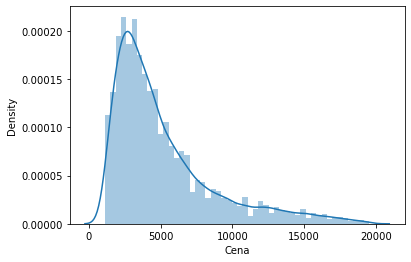

In [58]:
sns.distplot(df['Cena'])

([<matplotlib.axis.YTick at 0x27d847a3df0>,
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

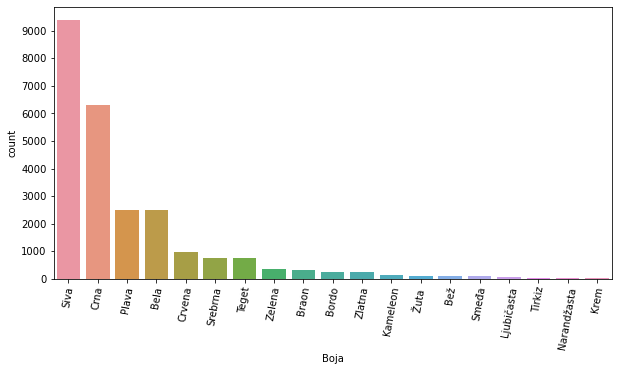

In [59]:
plt.figure(figsize=(10,5))
sns.countplot(df['Boja'], order=df['Boja'].value_counts().index)
plt.xticks(rotation=80)
plt.yticks(np.arange(0,10000, 1000))

In [60]:
df['Boja'].unique()

array(['Crna', 'Siva', 'Srebrna', 'Crvena', 'Žuta ', 'Plava', 'Bela',
       'Teget', 'Braon', 'Bordo', 'Kameleon', 'Zelena', 'Smeđa', 'Bež',
       'Zlatna', 'Narandžasta', 'Krem', 'Tirkiz', 'Ljubičasta'],
      dtype=object)

In [61]:
def change_color(row):
    if row not in ['Siva', 'Crna', 'Bela','Plava', 'Crvena']:
        return 'Druga'
    else:
        return row
df['Boja'] = df['Boja'].apply(change_color)

In [62]:
df['Boja'].unique()

array(['Crna', 'Siva', 'Druga', 'Crvena', 'Plava', 'Bela'], dtype=object)

([<matplotlib.axis.YTick at 0x27d848466d0>,
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

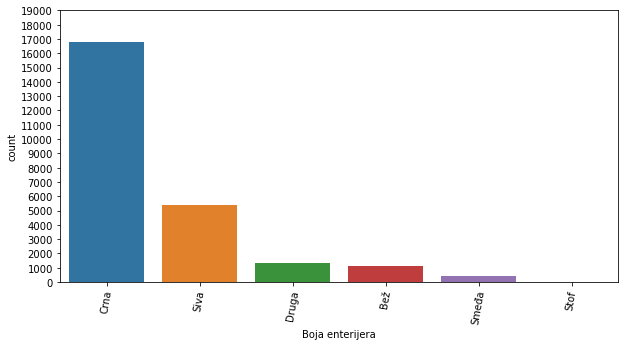

In [63]:
plt.figure(figsize=(10,5))
sns.countplot(df['Boja enterijera'], order=df['Boja enterijera'].value_counts().index)
plt.xticks(rotation=80)
plt.yticks(np.arange(0,20000, 1000))

In [64]:
def change_color_inside(row):
    if row not in ['Siva', 'Crna', 'Bež']:
        return 'Druga'
    else:
        return row
df['Boja enterijera'] = df['Boja enterijera'].apply(change_color_inside)

(array([0, 1, 2, 3, 4]),
 [Text(0, 0, 'Stof'),
  Text(1, 0, 'Prirodna koza'),
  Text(2, 0, 'Kombinovana koza'),
  Text(3, 0, 'Velur'),
  Text(4, 0, 'Druga')])

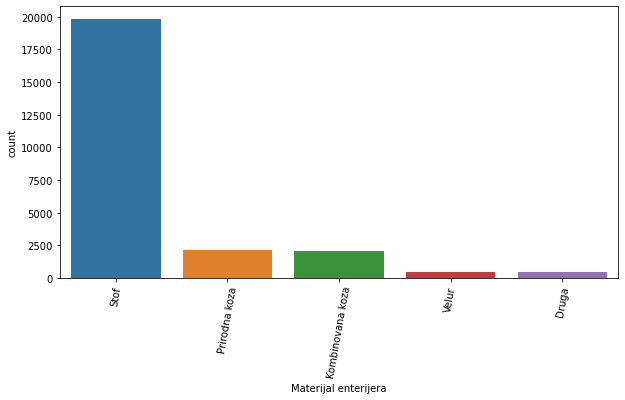

In [65]:
plt.figure(figsize=(10,5))
sns.countplot(df['Materijal enterijera'], order=df['Materijal enterijera'].value_counts().index)
plt.xticks(rotation=80)


In [66]:
df['Materijal enterijera'].unique()

array(['Stof', 'Kombinovana koza', 'Prirodna koza', 'Velur', 'Druga'],
      dtype=object)

In [67]:
def change_material(row):
    if row not in ['Stof', 'Kombinovana koza', 'Prirodna koza']:
        return 'Drugi'
    else:
        return row
df['Materijal enterijera'] = df['Materijal enterijera'].apply(change_material)

In [68]:
#df = df.groupby('Model').filter(lambda x: len(x)>=30)

In [69]:
df.drop(columns=['Broj sedista', 'Broj vrata', 'Boja enterijera'], inplace=True)

In [70]:
df.count()[0]

24973

-----------------------------------
Model 107


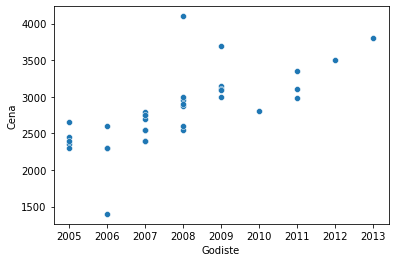

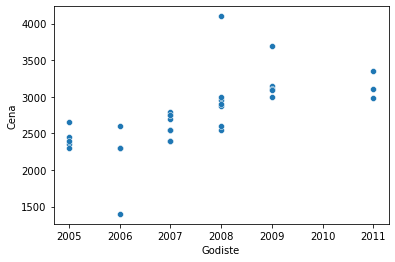

-----------------------------------
Model 116


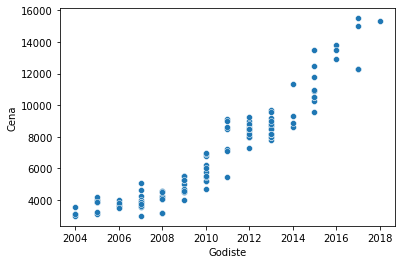

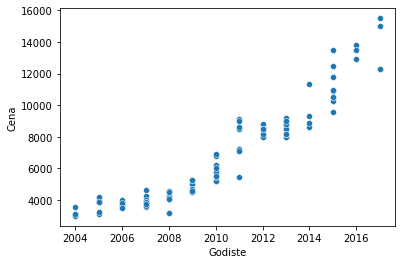

-----------------------------------
Model 118


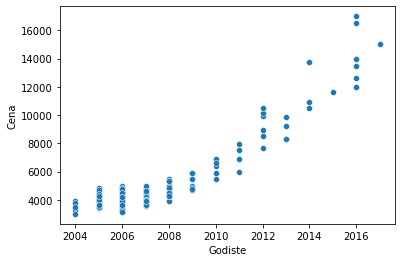

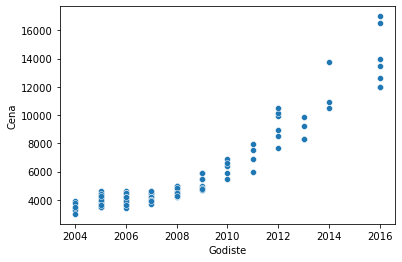

-----------------------------------
Model 120


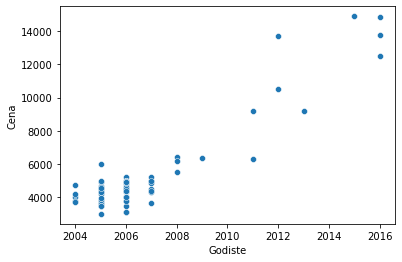

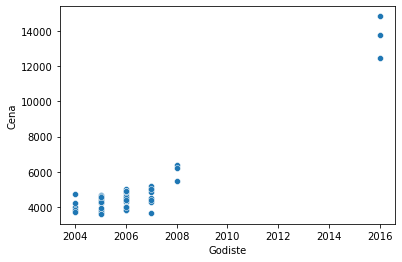

-----------------------------------
Model 147


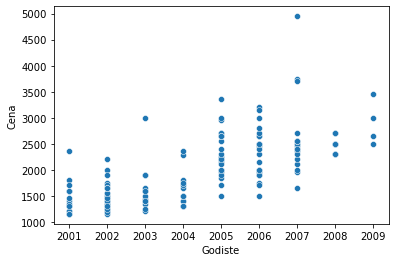

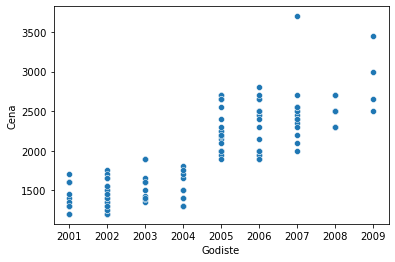

-----------------------------------
Model 156


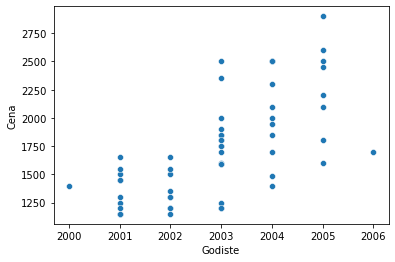

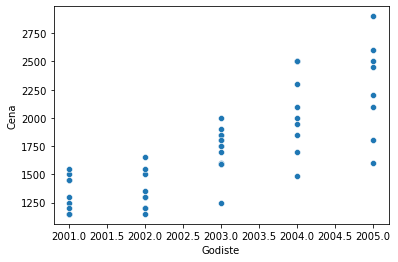

-----------------------------------
Model 159


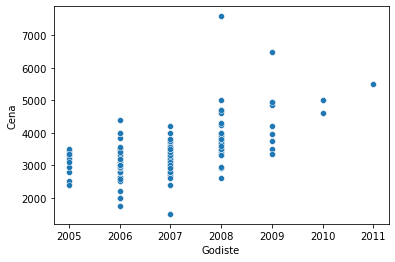

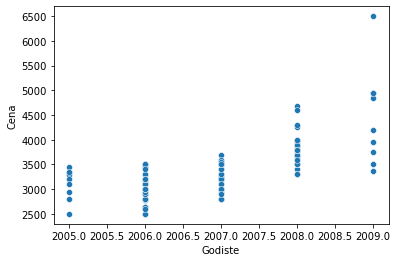

-----------------------------------
Model 2


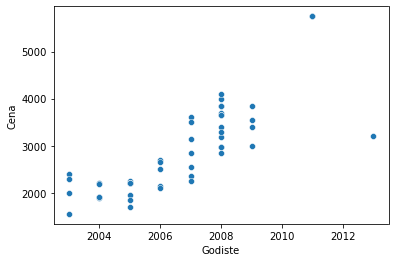

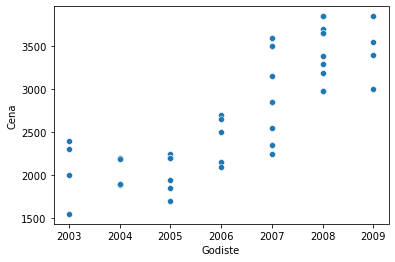

-----------------------------------
Model 206


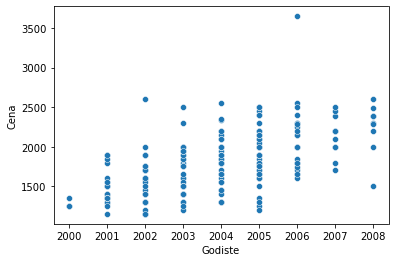

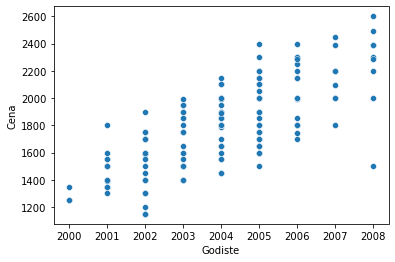

-----------------------------------
Model 207


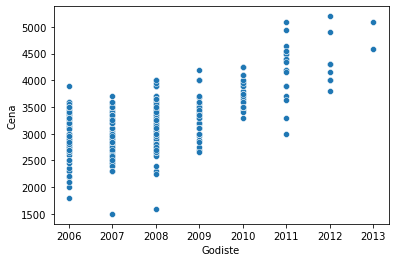

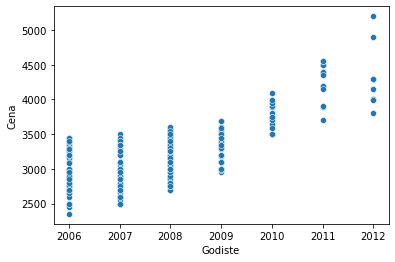

-----------------------------------
Model 208


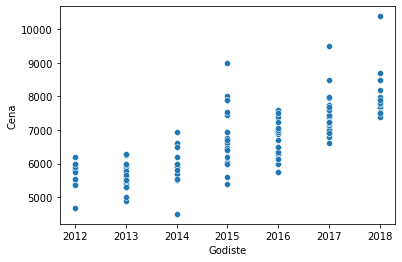

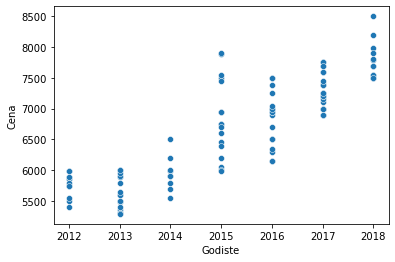

-----------------------------------
Model 3


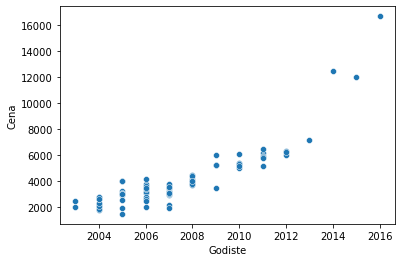

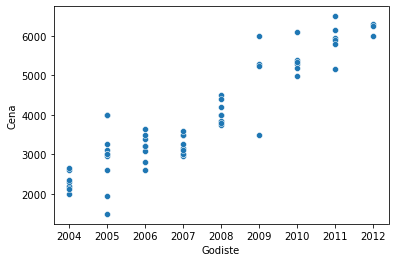

-----------------------------------
Model 3008


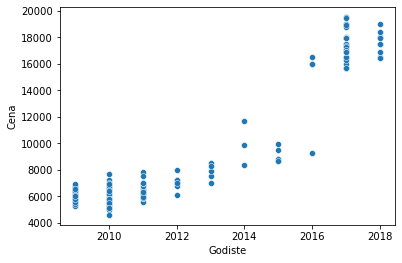

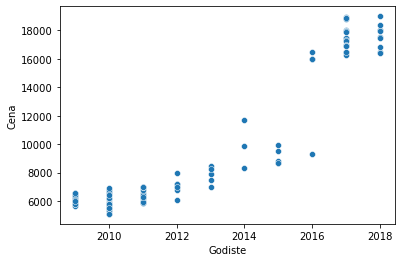

-----------------------------------
Model 307


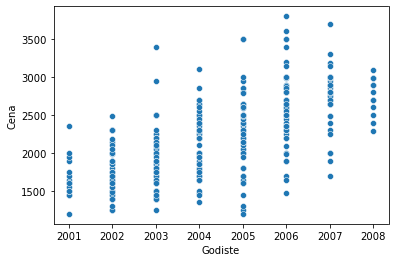

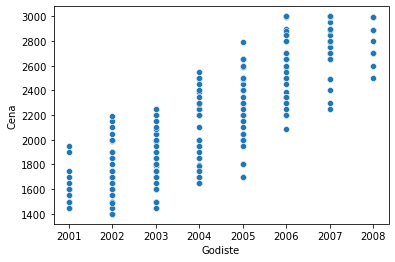

-----------------------------------
Model 308


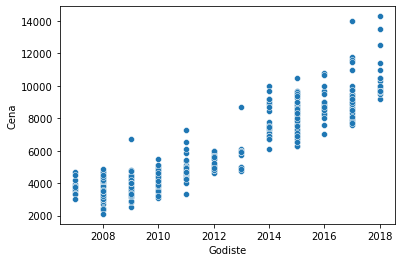

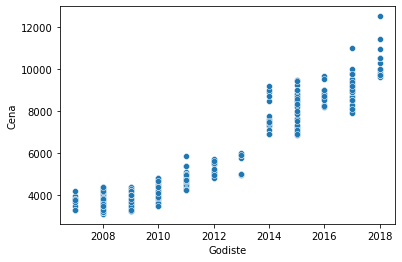

-----------------------------------
Model 316


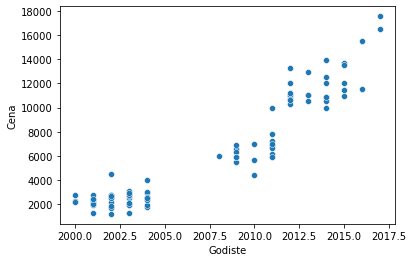

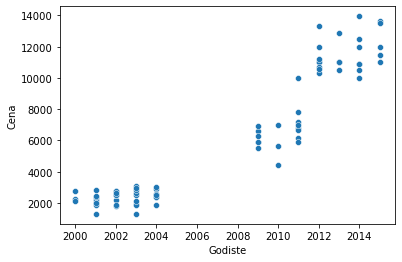

-----------------------------------
Model 318


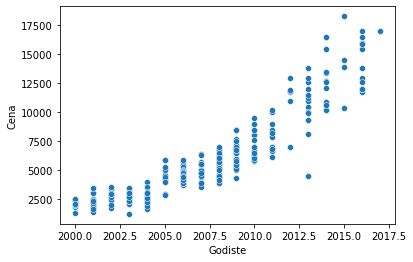

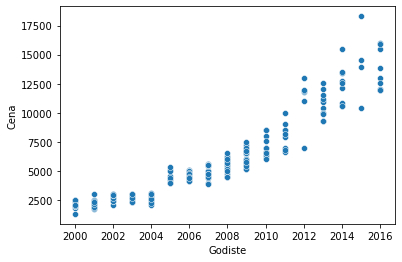

-----------------------------------
Model 320


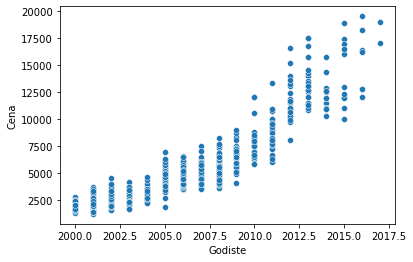

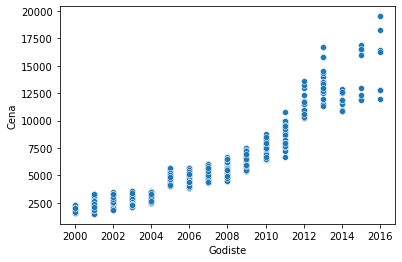

-----------------------------------
Model 407


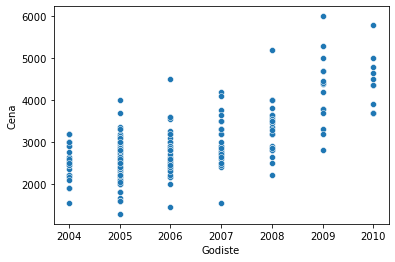

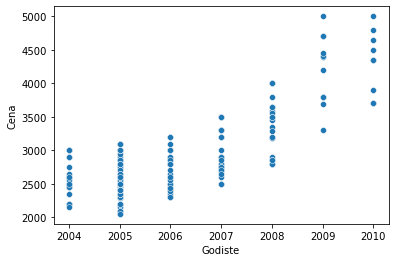

-----------------------------------
Model 5


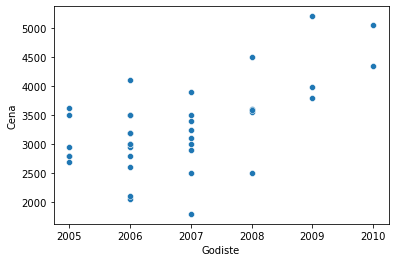

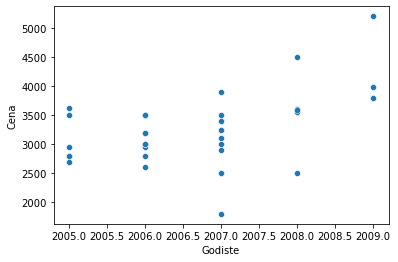

-----------------------------------
Model 500


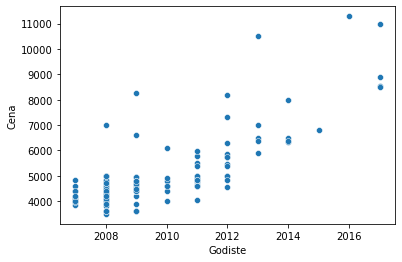

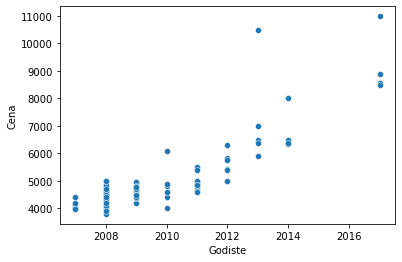

-----------------------------------
Model 5008


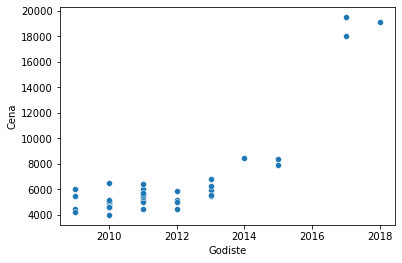

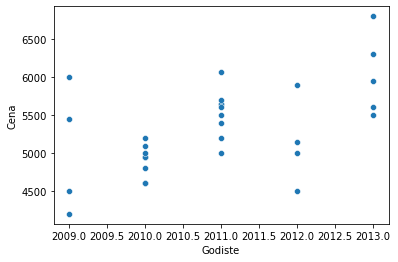

-----------------------------------
Model 500L


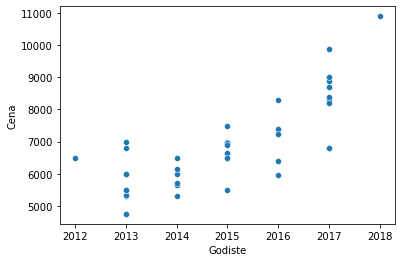

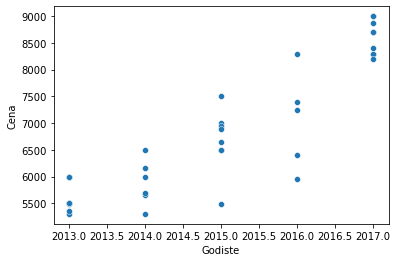

-----------------------------------
Model 508


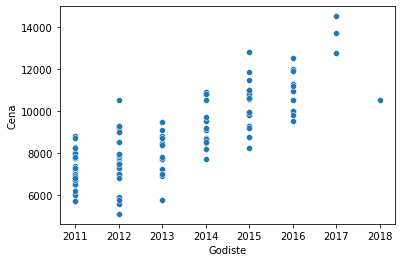

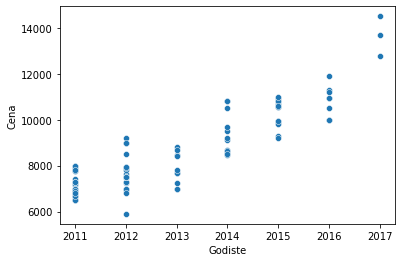

-----------------------------------
Model 520


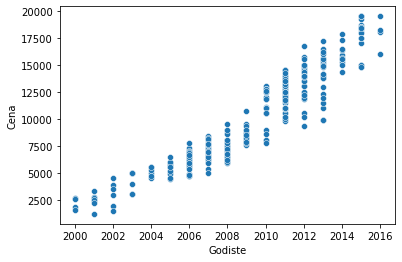

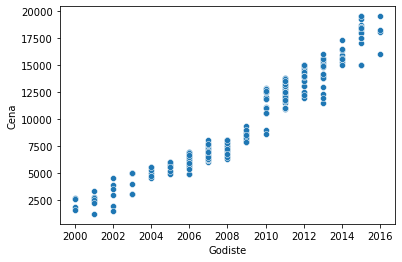

-----------------------------------
Model 525


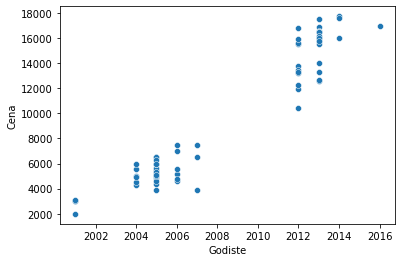

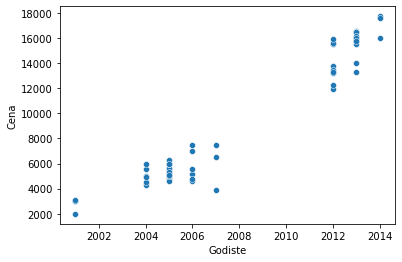

-----------------------------------
Model 6


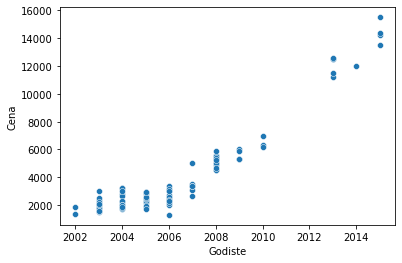

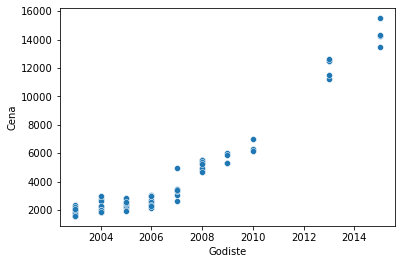

-----------------------------------
Model A 150


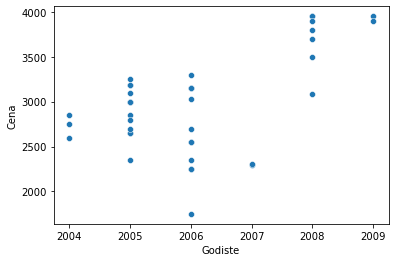

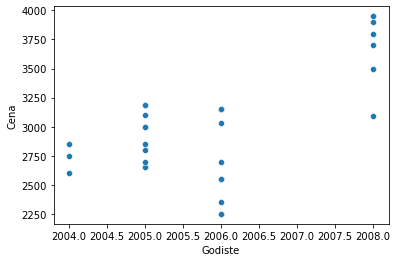

-----------------------------------
Model A 160


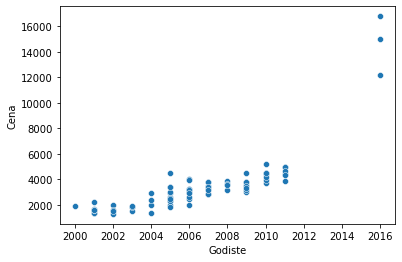

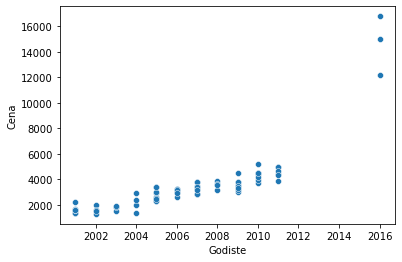

-----------------------------------
Model A 170


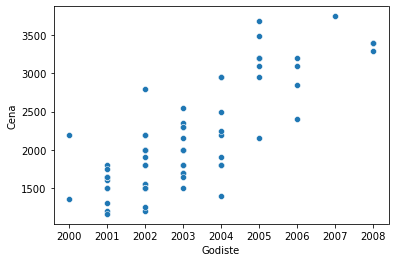

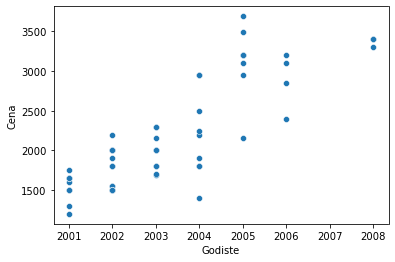

-----------------------------------
Model A 180


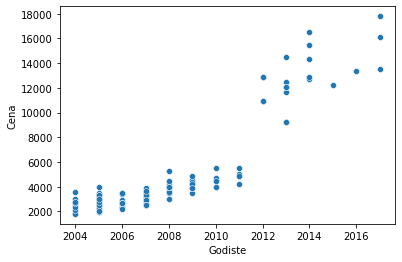

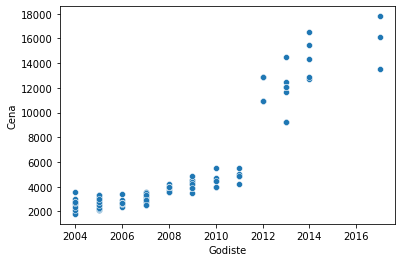

-----------------------------------
Model A2


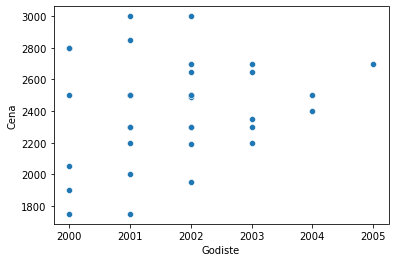

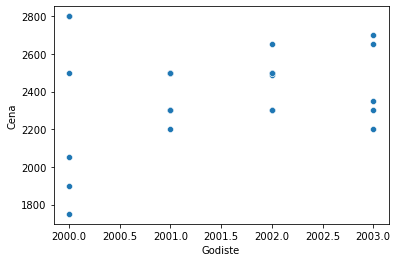

-----------------------------------
Model A3


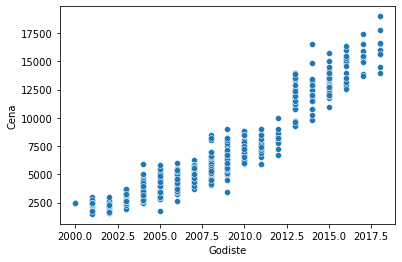

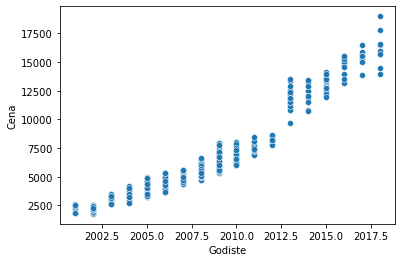

-----------------------------------
Model A4


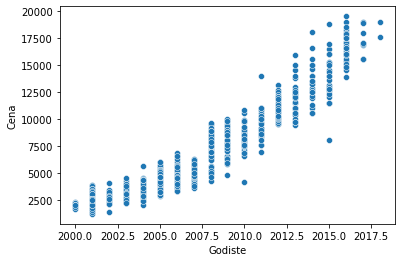

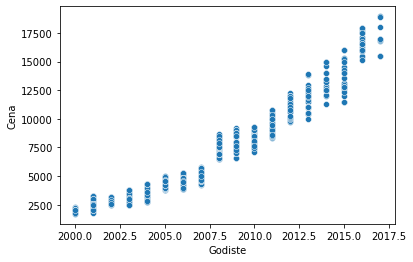

-----------------------------------
Model A5


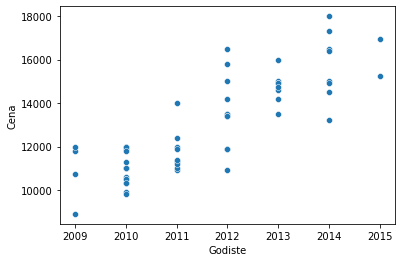

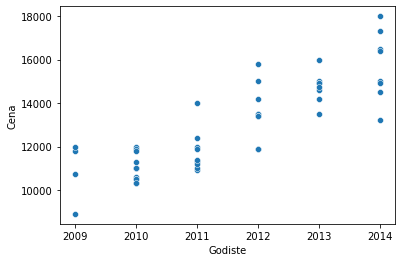

-----------------------------------
Model A6


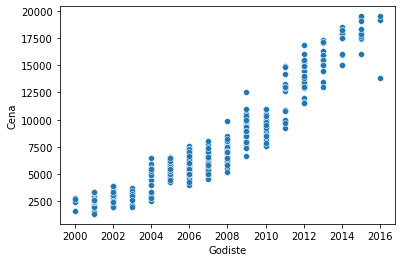

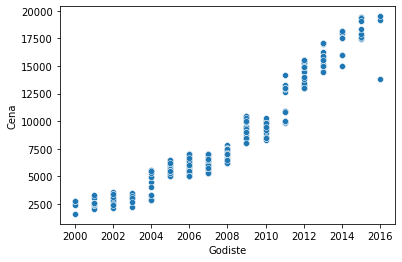

-----------------------------------
Model Agila


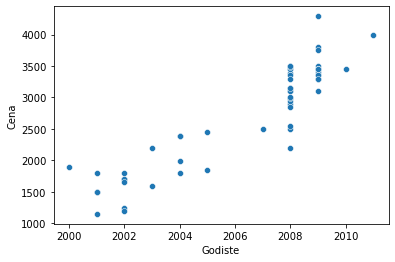

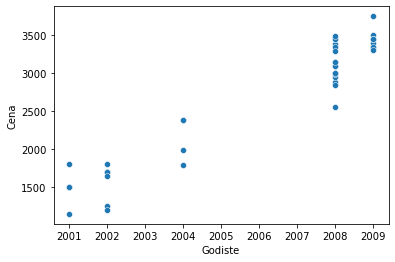

-----------------------------------
Model Alhambra


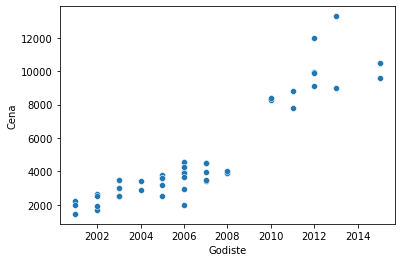

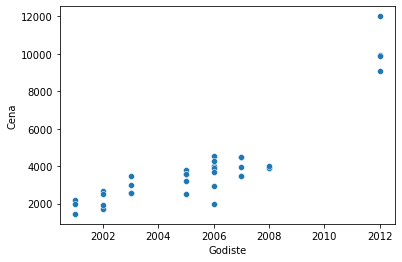

-----------------------------------
Model Altea


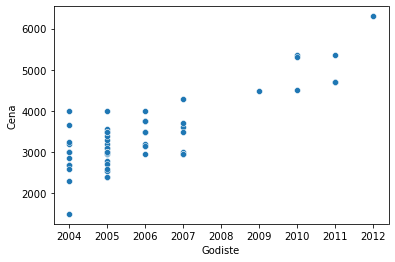

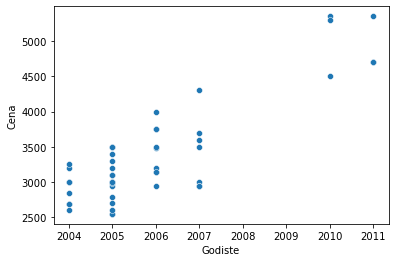

-----------------------------------
Model Antara


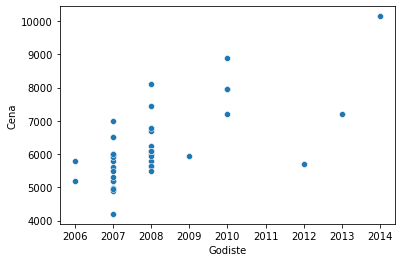

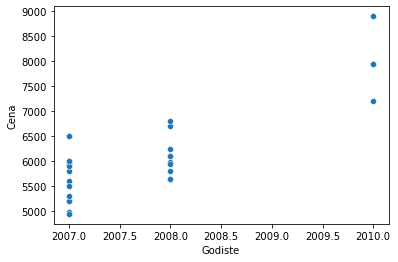

-----------------------------------
Model Astra G


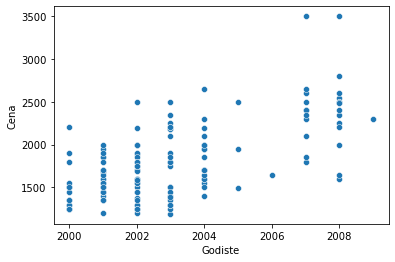

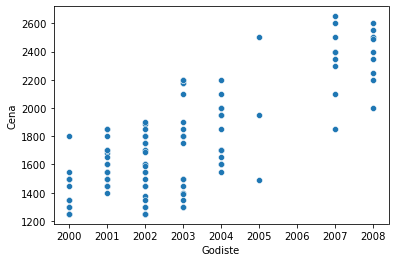

-----------------------------------
Model Astra H


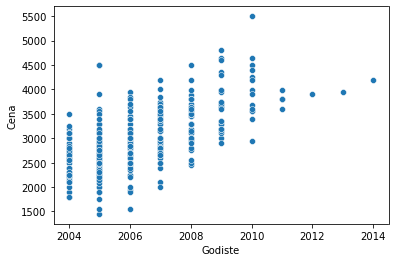

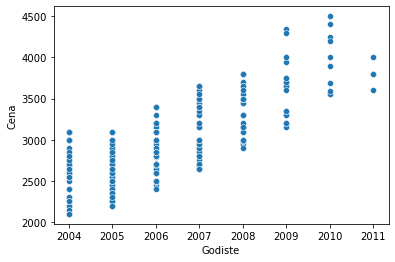

-----------------------------------
Model Astra J


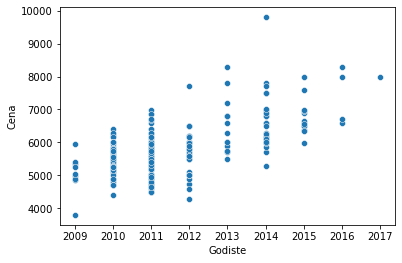

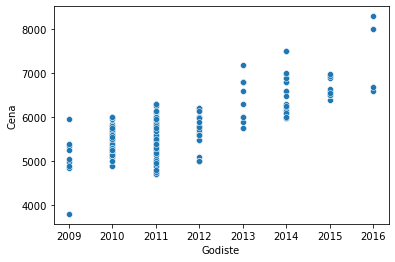

-----------------------------------
Model Astra K


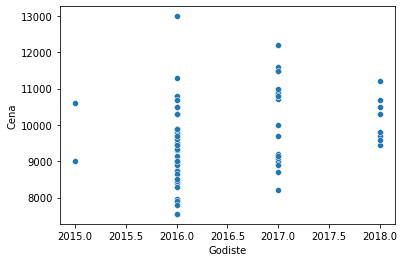

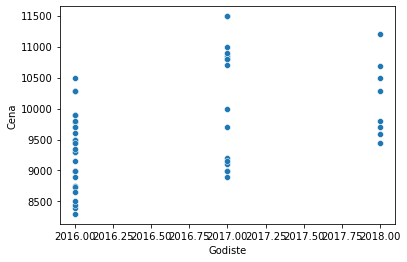

-----------------------------------
Model Auris


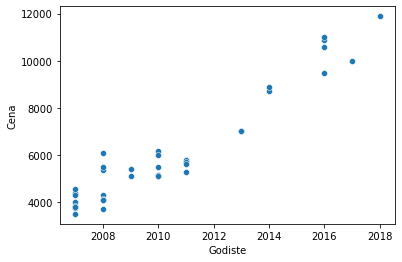

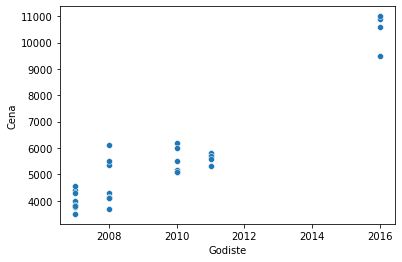

-----------------------------------
Model Avensis


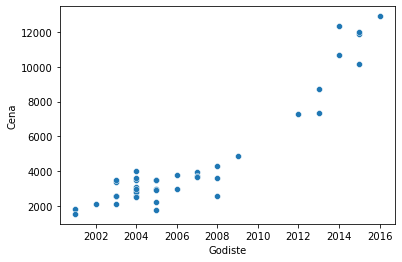

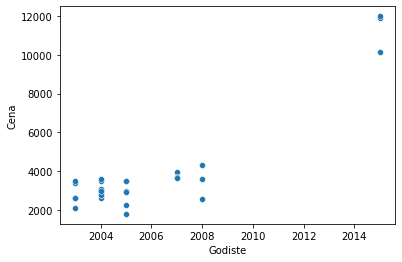

-----------------------------------
Model Aygo


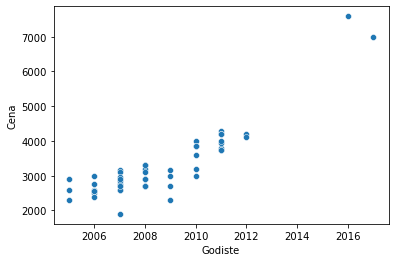

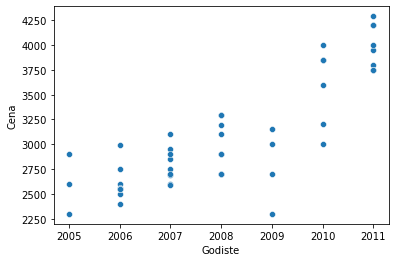

-----------------------------------
Model B 180


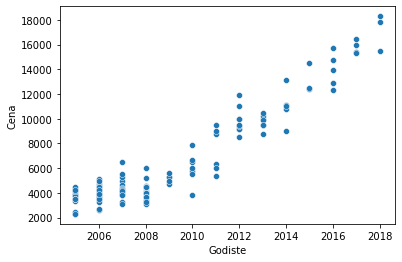

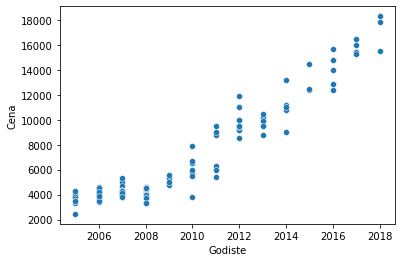

-----------------------------------
Model B 200


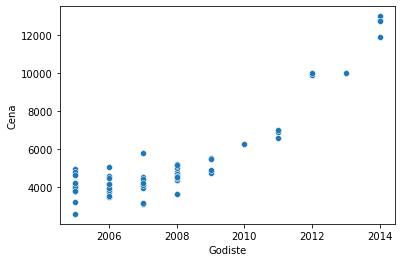

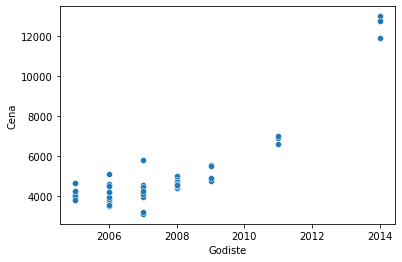

-----------------------------------
Model Berlingo


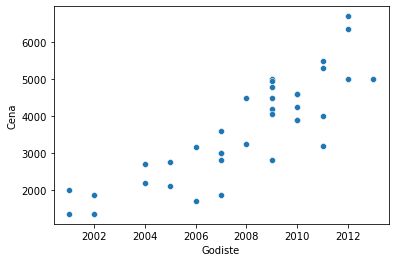

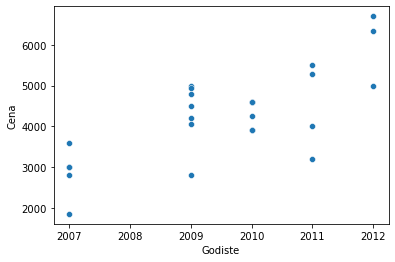

-----------------------------------
Model Bora


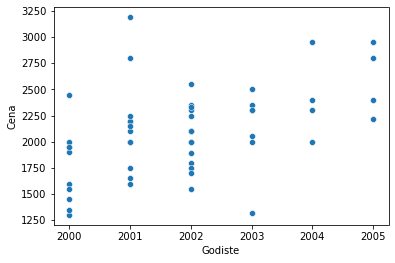

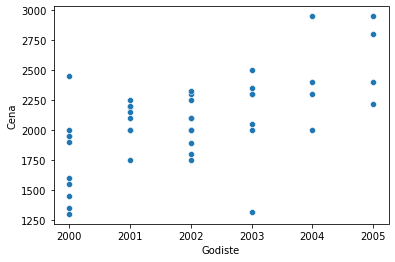

-----------------------------------
Model Bravo


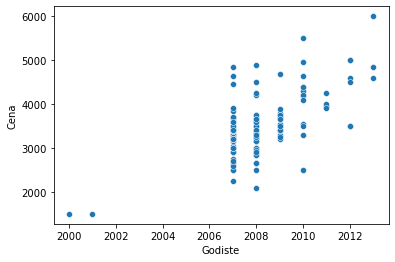

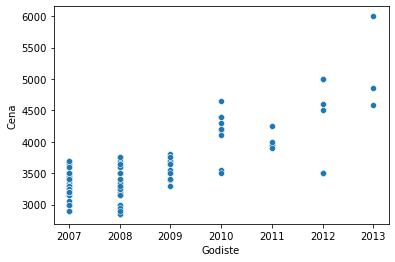

-----------------------------------
Model C 180


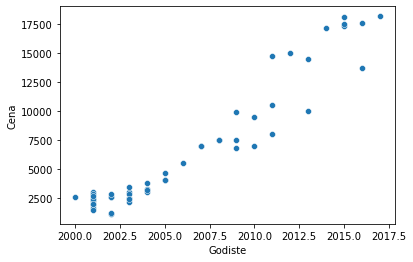

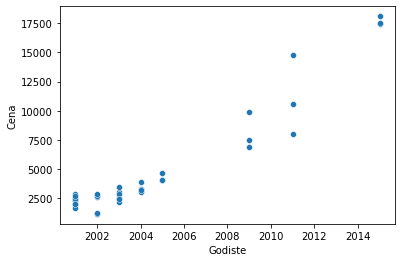

-----------------------------------
Model C 200


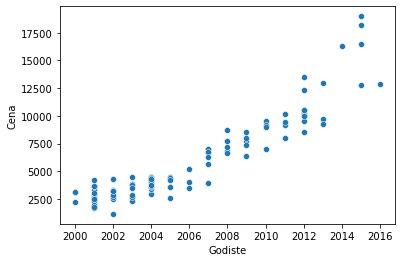

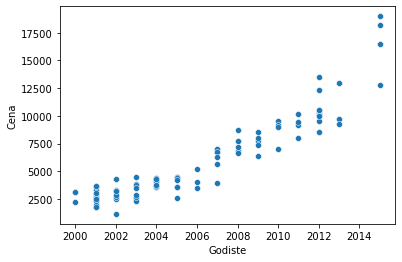

-----------------------------------
Model C 220


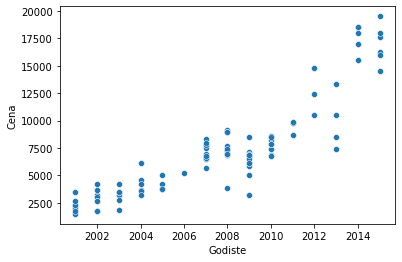

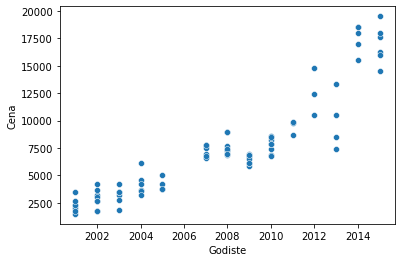

-----------------------------------
Model C-Max


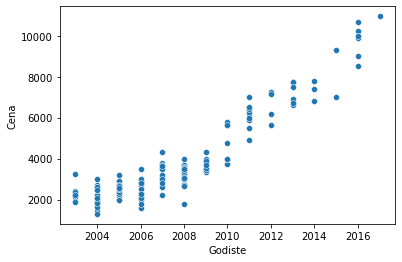

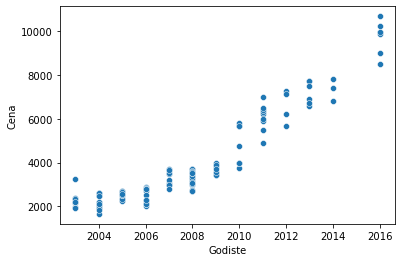

-----------------------------------
Model C1


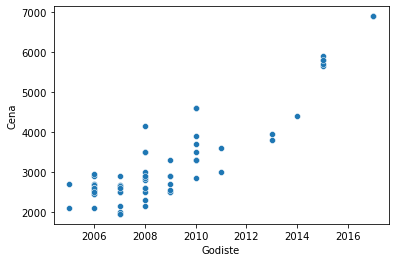

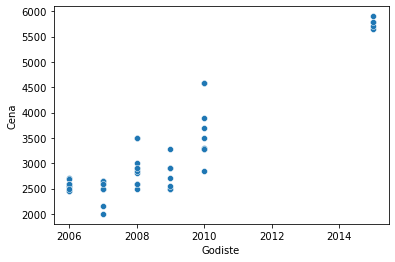

-----------------------------------
Model C2


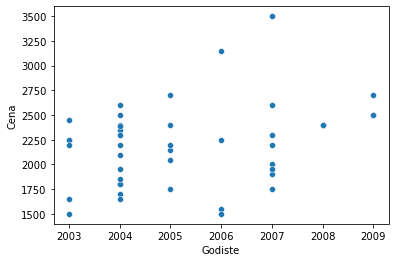

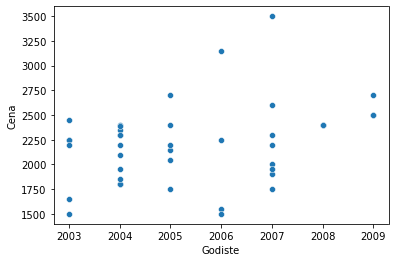

-----------------------------------
Model C3


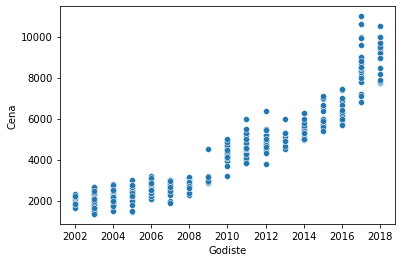

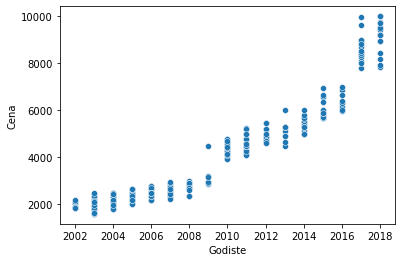

-----------------------------------
Model C3 Picasso


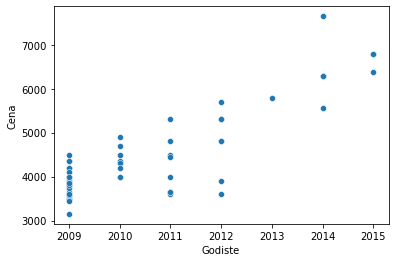

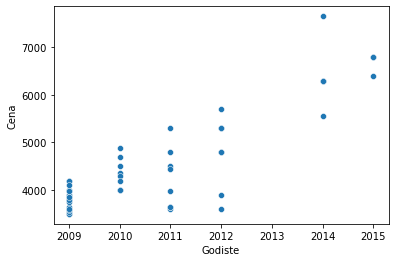

-----------------------------------
Model C4


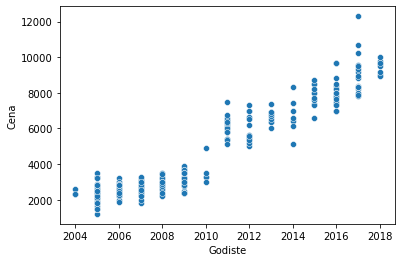

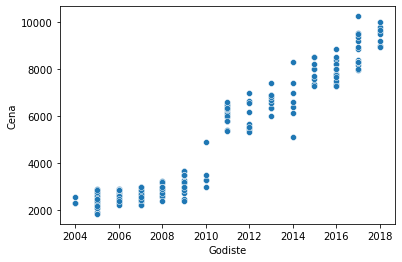

-----------------------------------
Model C4 Grand Picasso


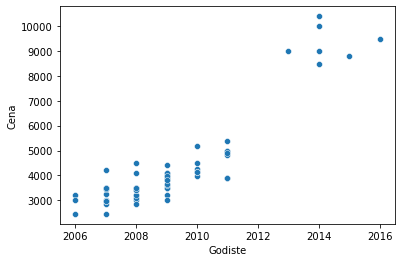

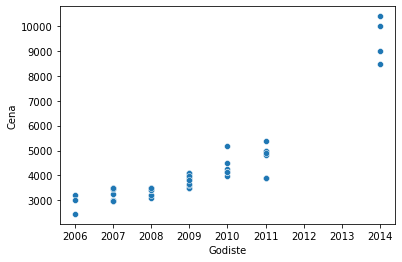

-----------------------------------
Model C4 Picasso


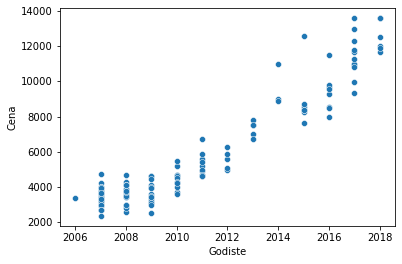

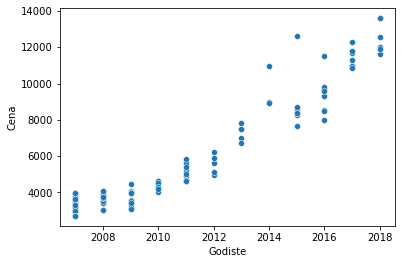

-----------------------------------
Model C5


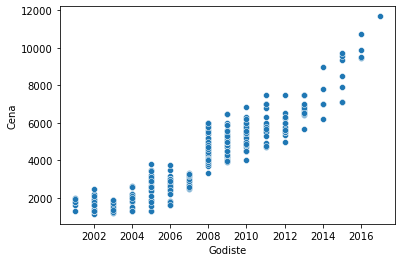

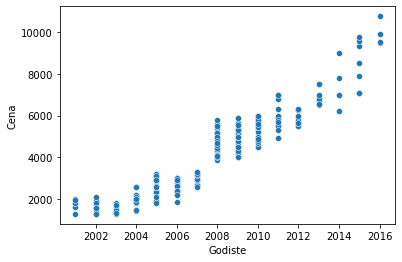

-----------------------------------
Model Caddy


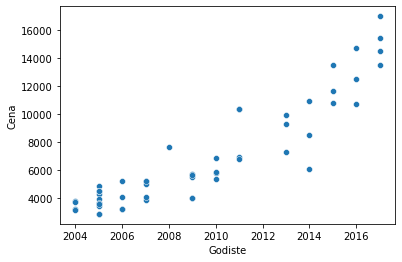

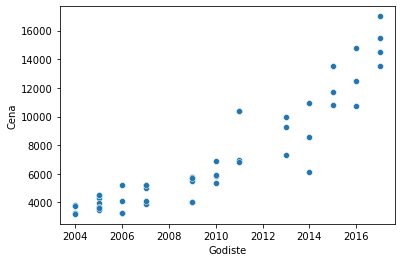

-----------------------------------
Model Captiva


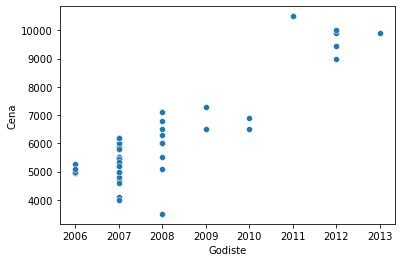

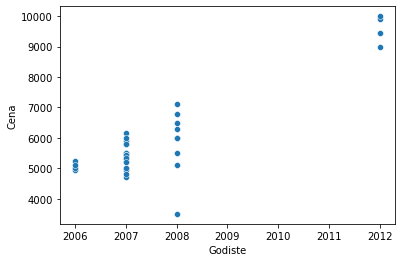

-----------------------------------
Model Captur


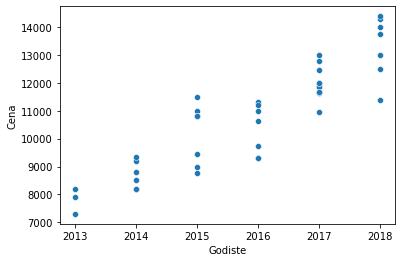

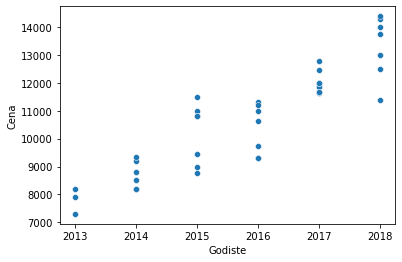

-----------------------------------
Model Civic


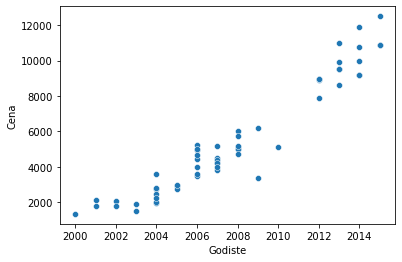

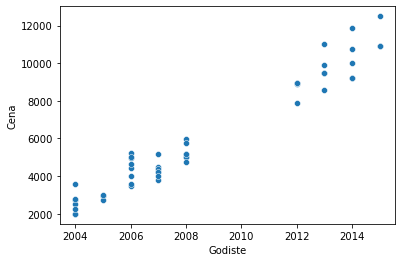

-----------------------------------
Model Clio


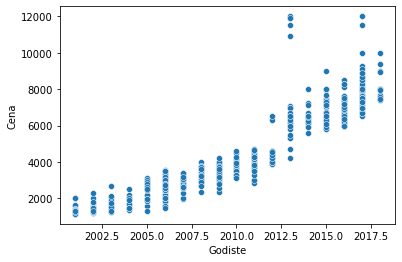

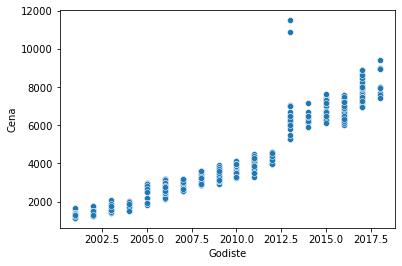

-----------------------------------
Model Colt


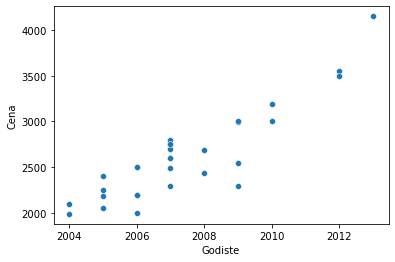

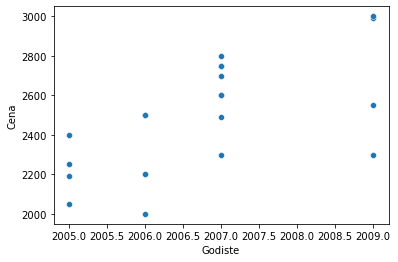

-----------------------------------
Model Cooper


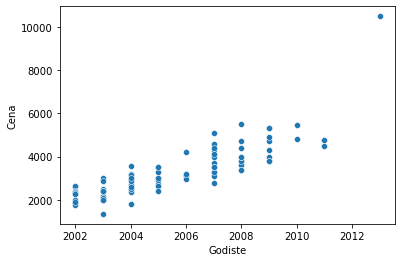

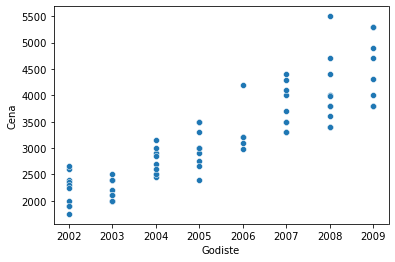

-----------------------------------
Model Corsa C


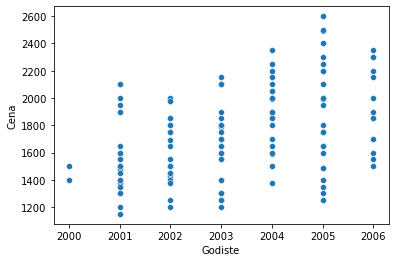

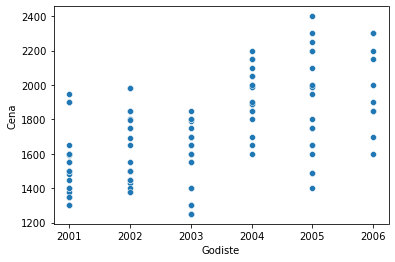

-----------------------------------
Model Corsa D


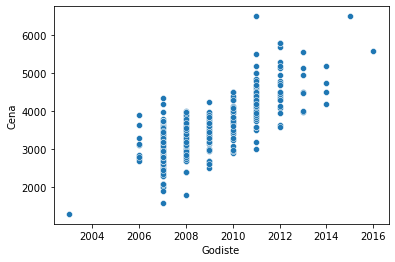

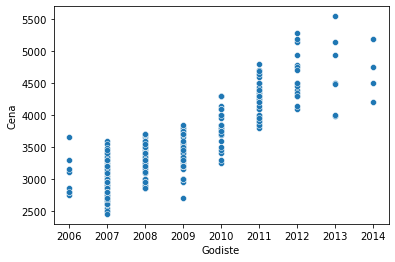

-----------------------------------
Model Corsa E


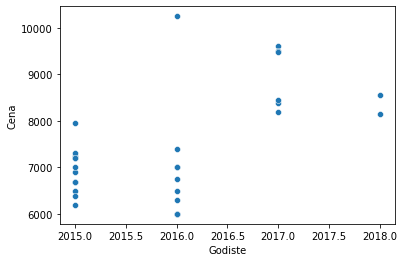

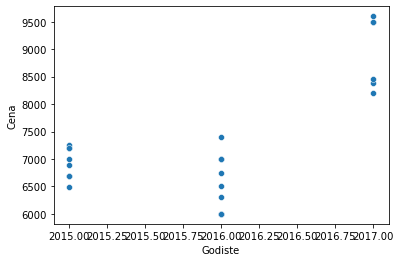

-----------------------------------
Model Croma


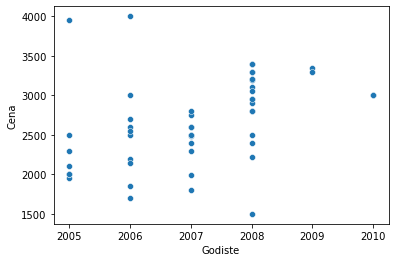

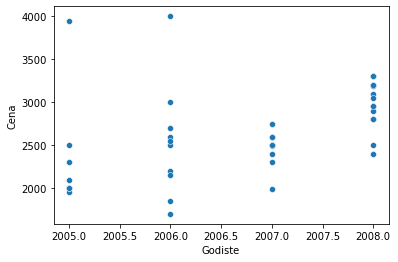

-----------------------------------
Model Cruze


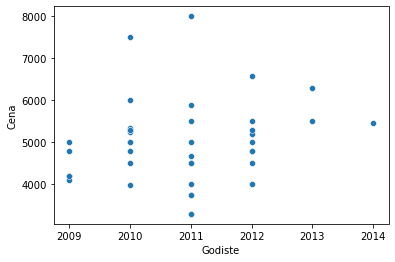

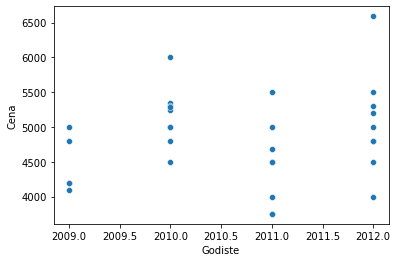

-----------------------------------
Model DS3


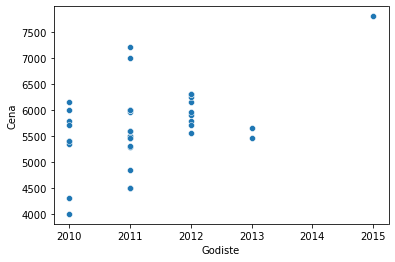

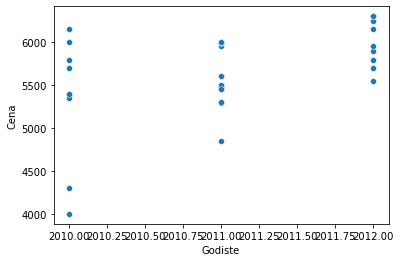

-----------------------------------
Model Delta


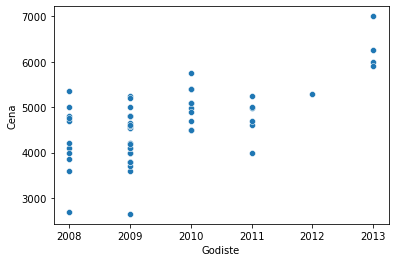

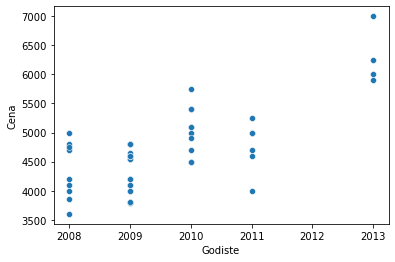

-----------------------------------
Model Doblo


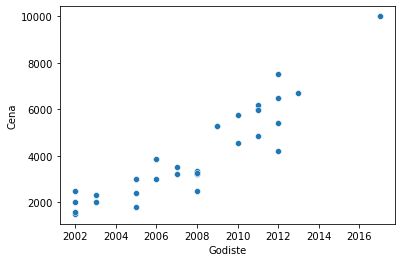

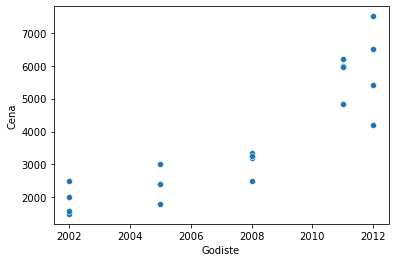

-----------------------------------
Model E 200


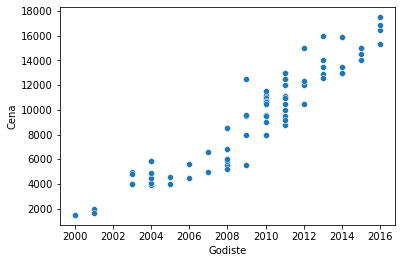

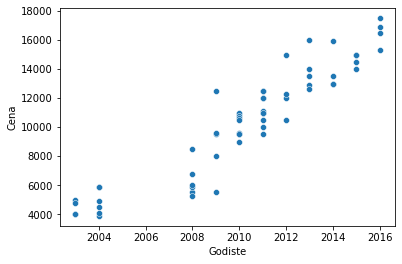

-----------------------------------
Model E 220


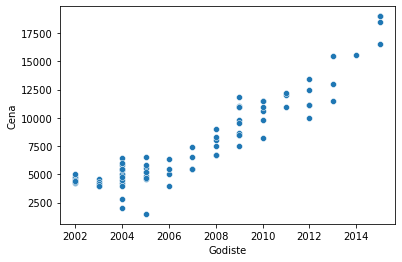

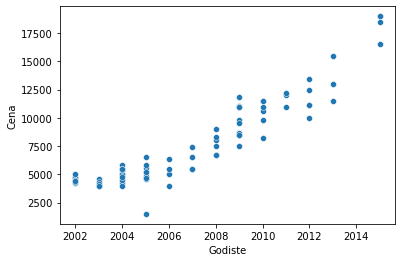

-----------------------------------
Model EVO


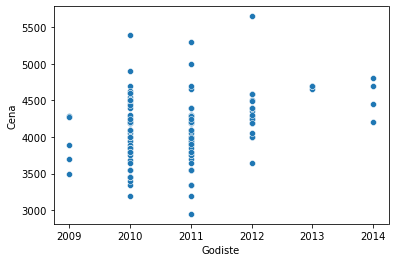

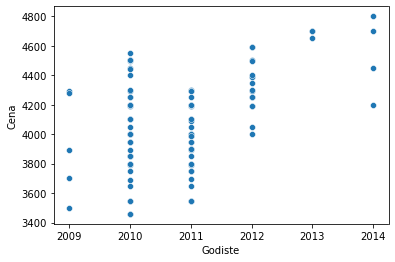

-----------------------------------
Model Espace


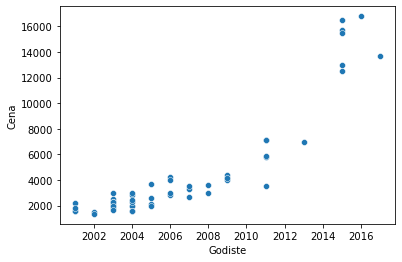

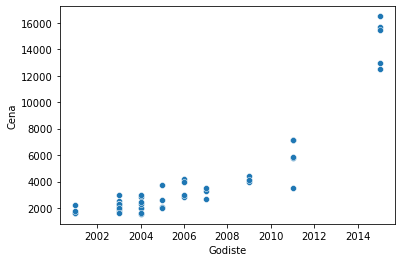

-----------------------------------
Model Fabia


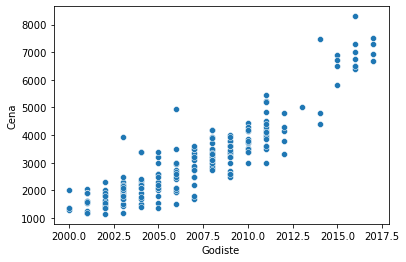

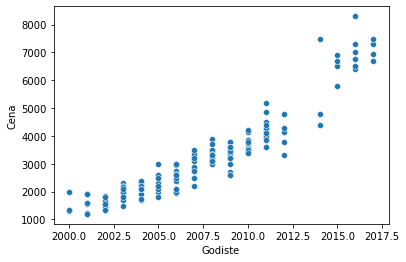

-----------------------------------
Model Fiesta


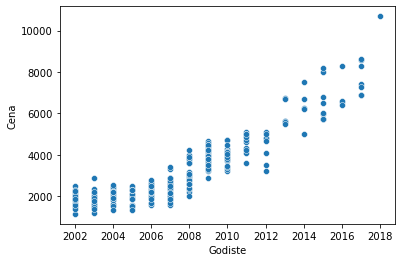

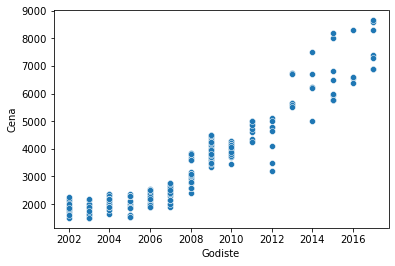

-----------------------------------
Model Focus


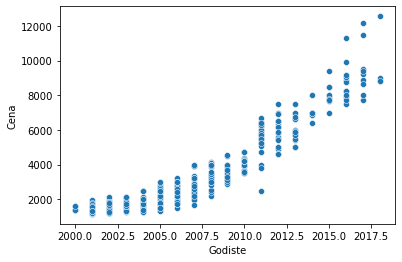

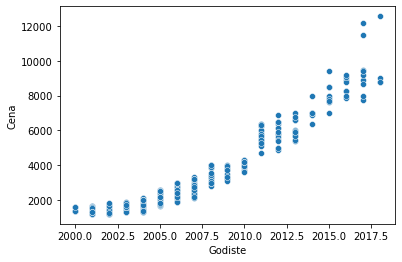

-----------------------------------
Model Fox


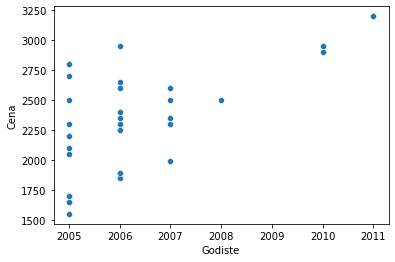

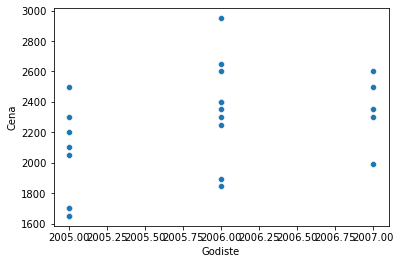

-----------------------------------
Model Fusion


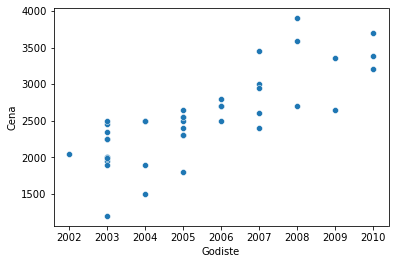

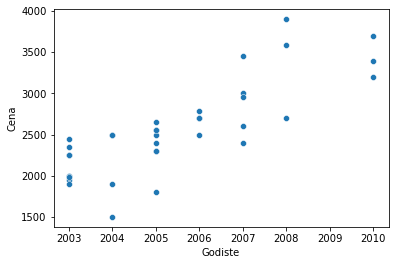

-----------------------------------
Model Galaxy


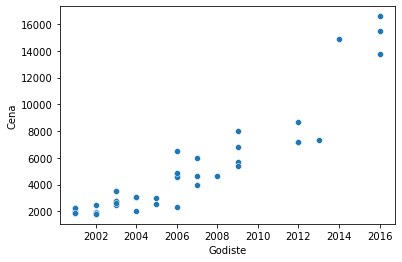

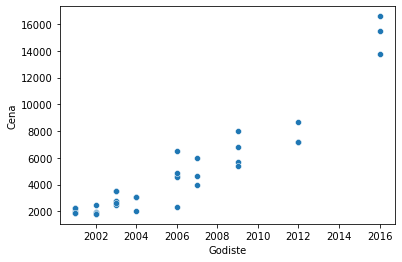

-----------------------------------
Model Giulietta


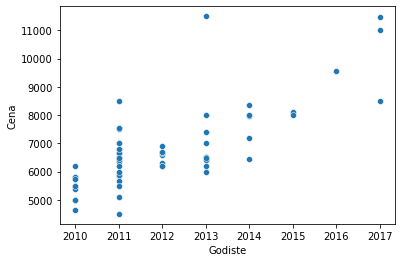

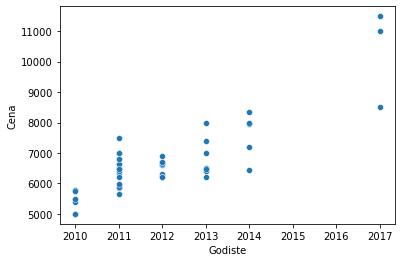

-----------------------------------
Model Golf 4


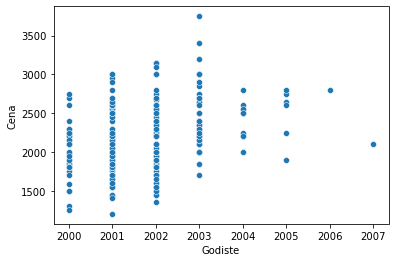

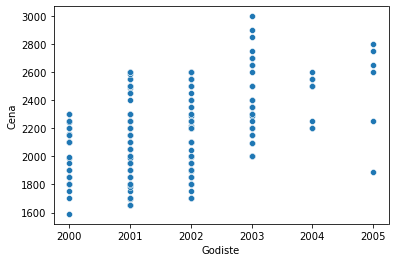

-----------------------------------
Model Golf 5


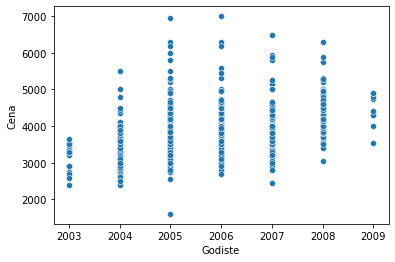

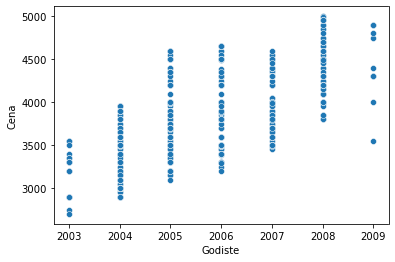

-----------------------------------
Model Golf 6


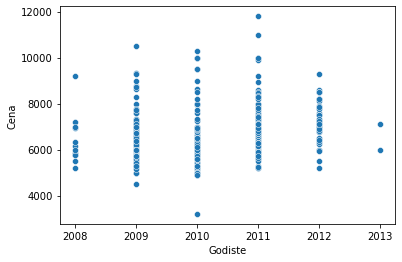

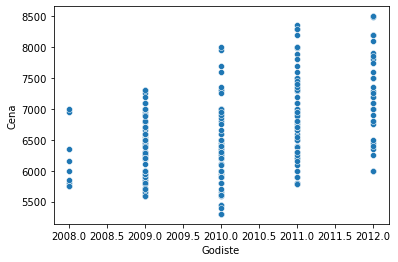

-----------------------------------
Model Golf 7


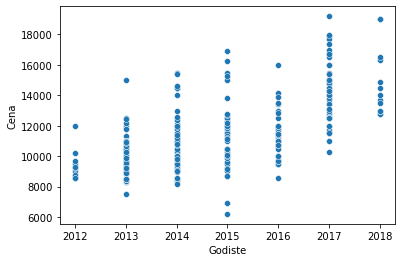

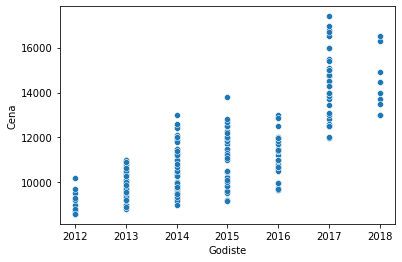

-----------------------------------
Model Golf Plus


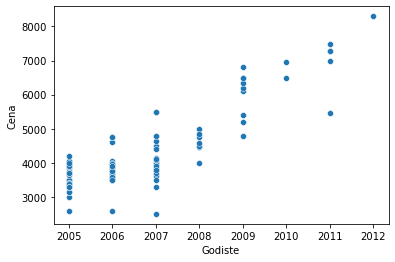

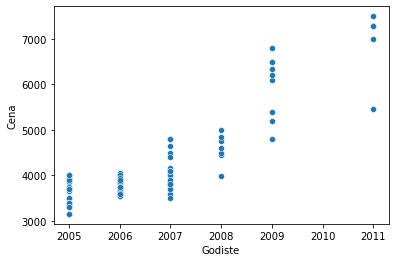

-----------------------------------
Model Grand Scenic


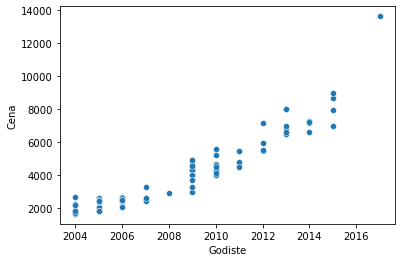

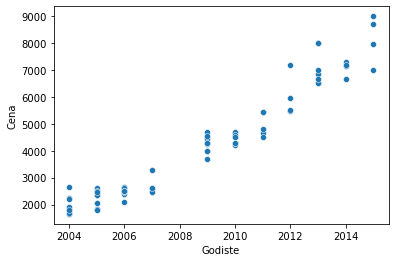

-----------------------------------
Model Grand Vitara


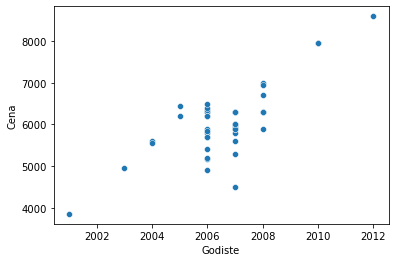

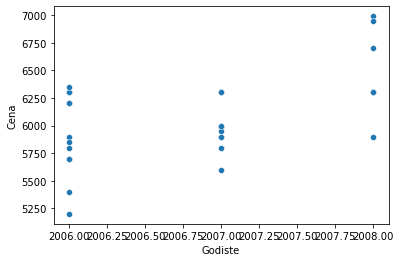

-----------------------------------
Model Grande Punto


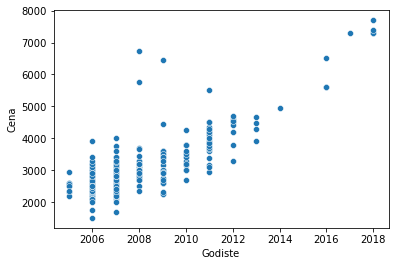

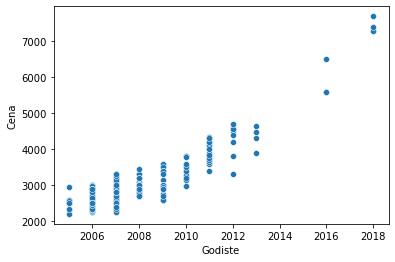

-----------------------------------
Model Ibiza


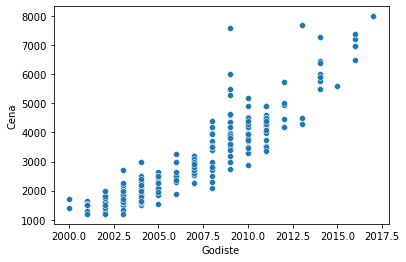

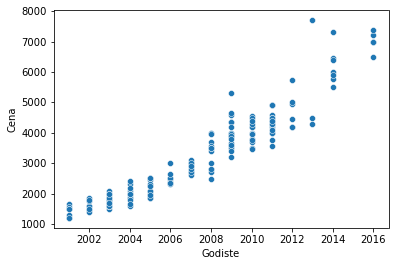

-----------------------------------
Model Idea


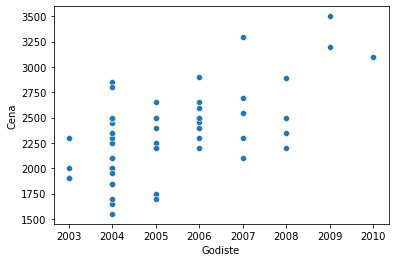

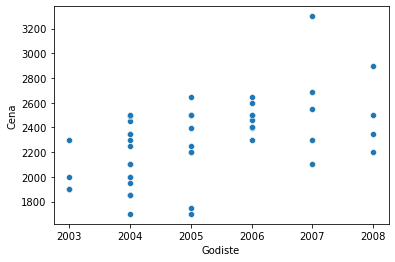

-----------------------------------
Model Insignia


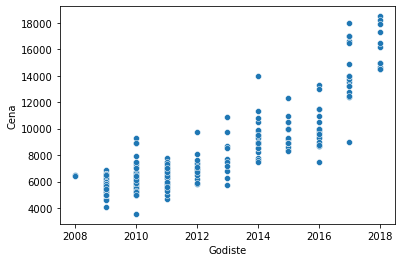

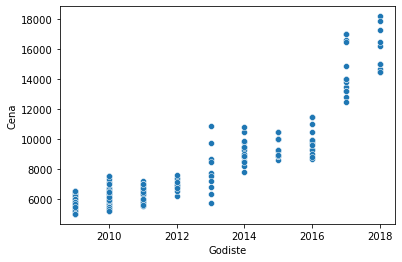

-----------------------------------
Model Jetta


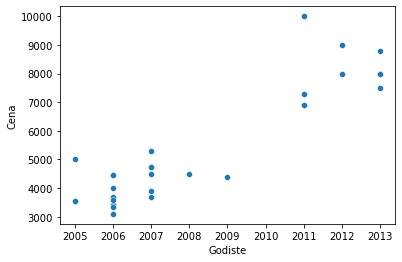

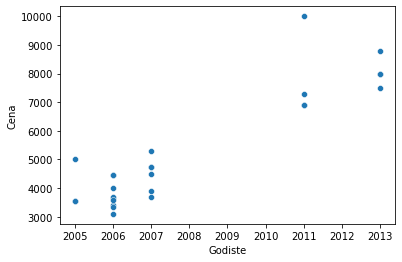

-----------------------------------
Model Juke


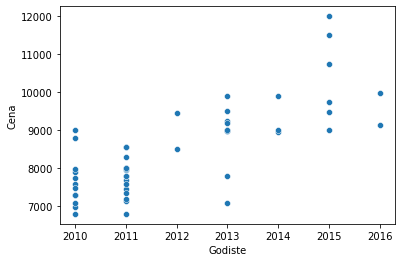

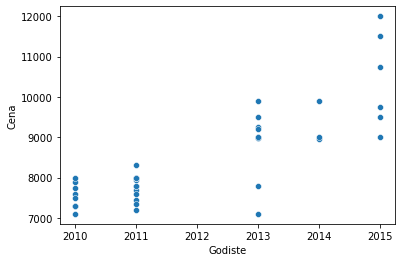

-----------------------------------
Model Ka


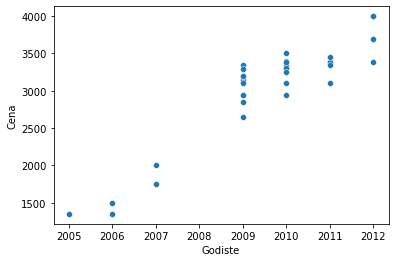

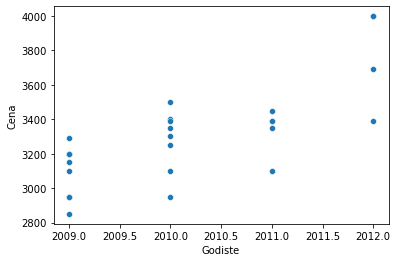

-----------------------------------
Model Kadjar


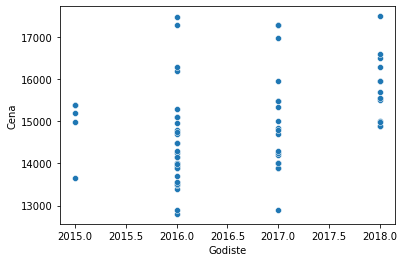

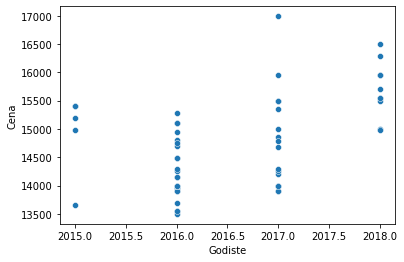

-----------------------------------
Model Kangoo


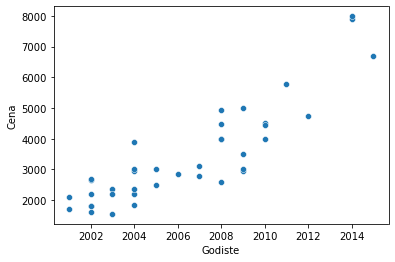

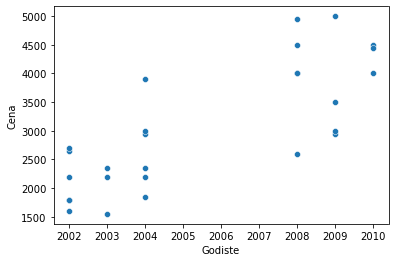

-----------------------------------
Model Kuga


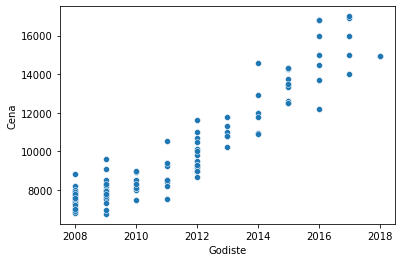

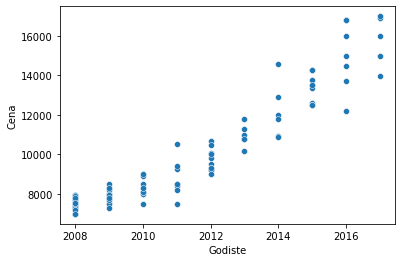

-----------------------------------
Model Laguna


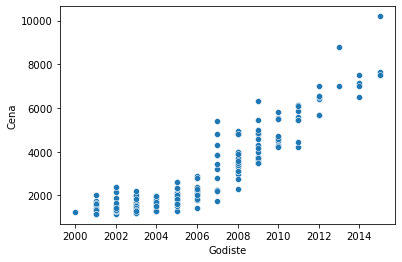

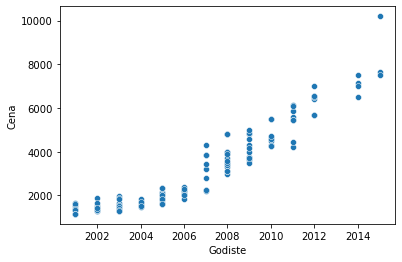

-----------------------------------
Model Leon


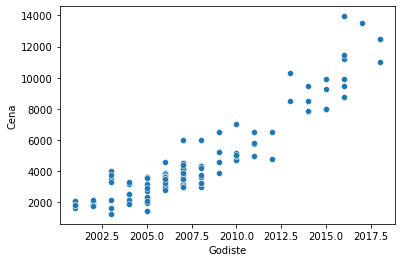

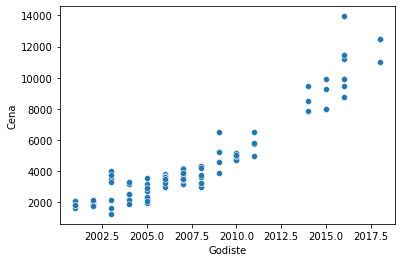

-----------------------------------
Model Logan


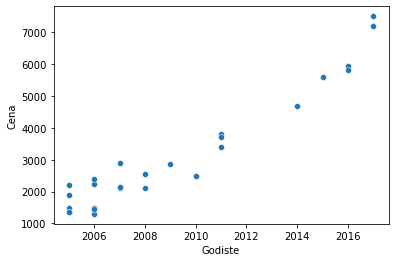

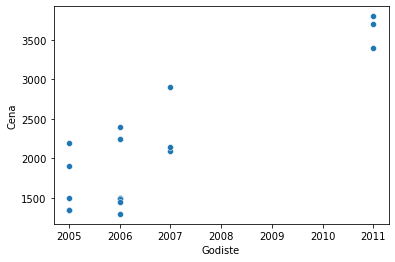

-----------------------------------
Model Megane


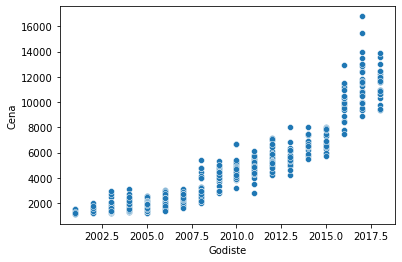

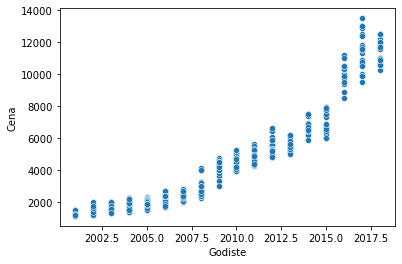

-----------------------------------
Model Meriva


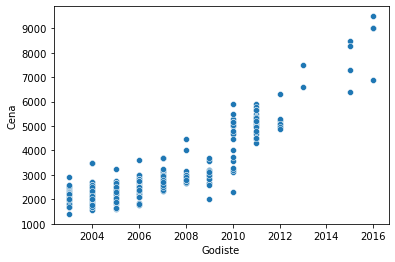

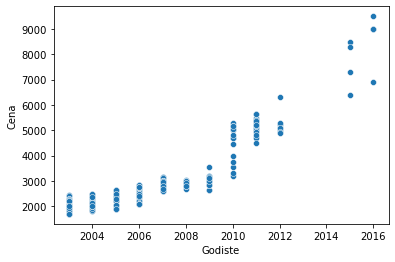

-----------------------------------
Model MiTo


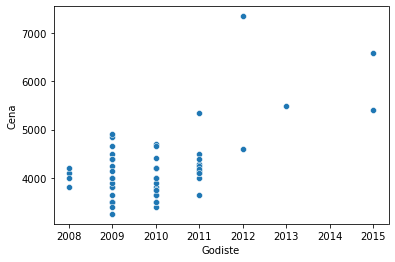

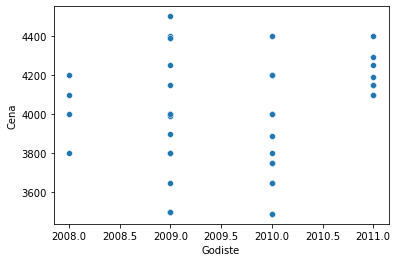

-----------------------------------
Model Micra


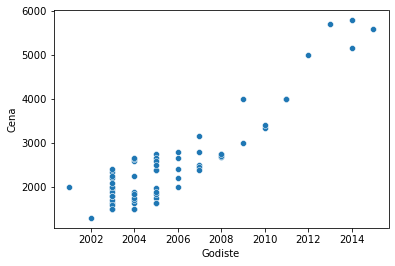

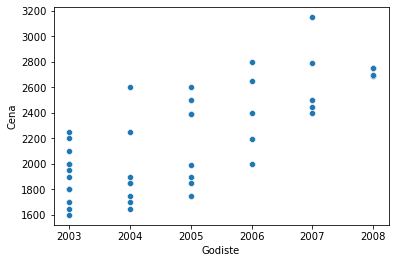

-----------------------------------
Model Modus


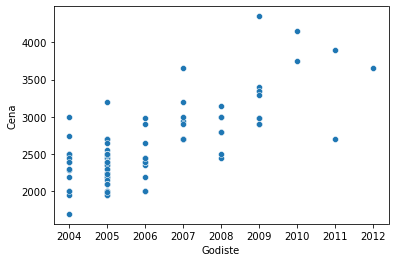

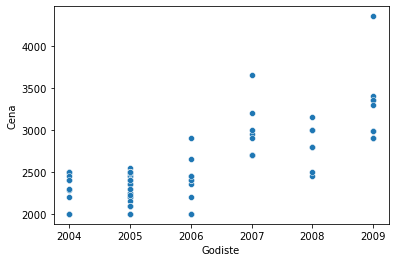

-----------------------------------
Model Mondeo


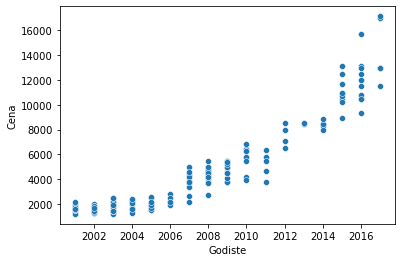

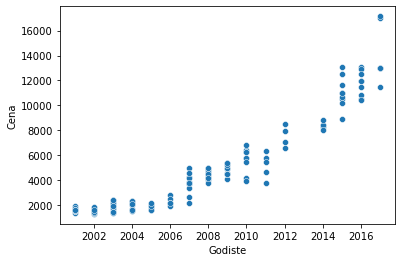

-----------------------------------
Model Musa


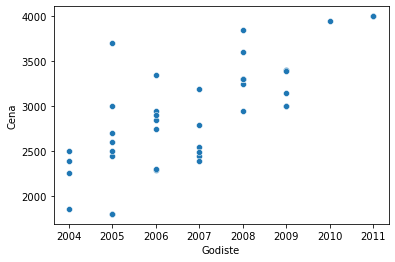

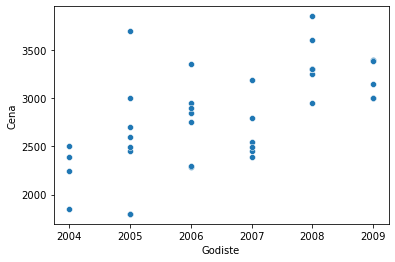

-----------------------------------
Model Note


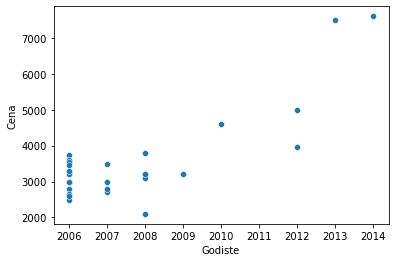

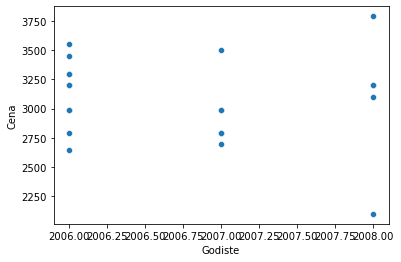

-----------------------------------
Model Octavia


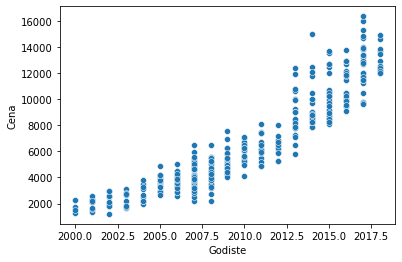

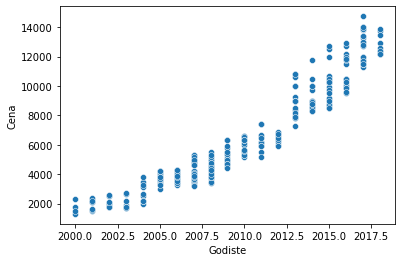

-----------------------------------
Model One


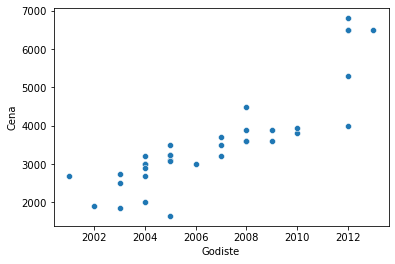

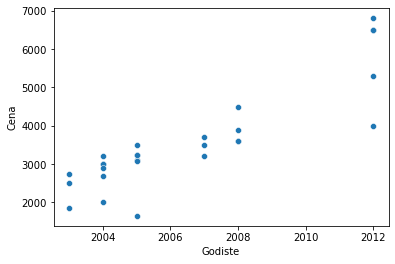

-----------------------------------
Model Outlander


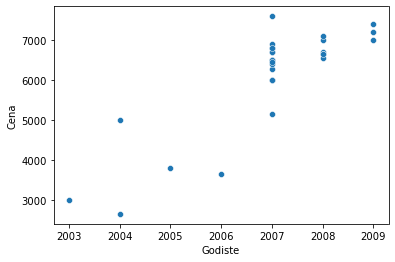

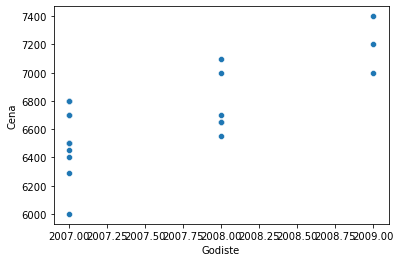

-----------------------------------
Model Panda


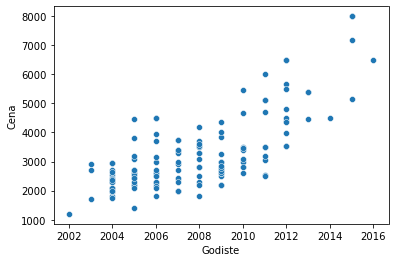

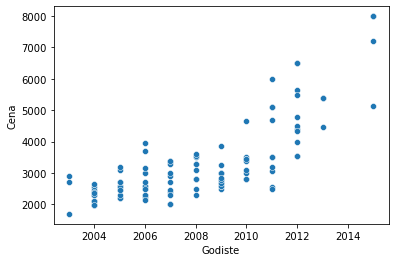

-----------------------------------
Model Passat B5.5


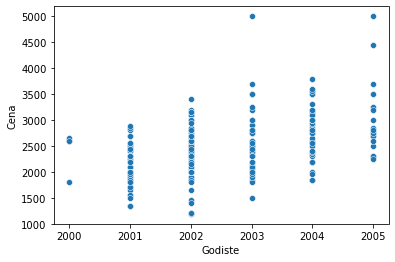

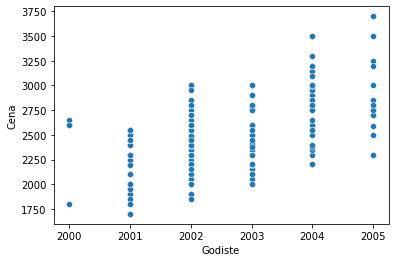

-----------------------------------
Model Passat B6


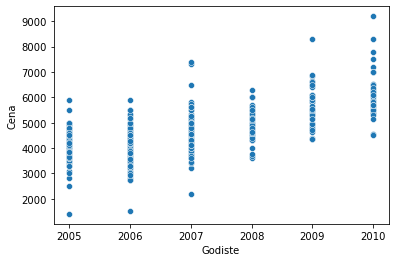

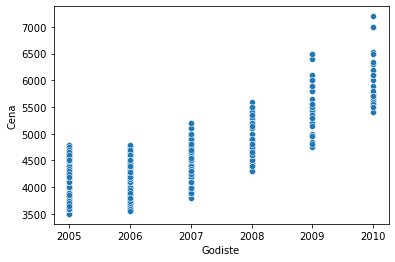

-----------------------------------
Model Passat B7


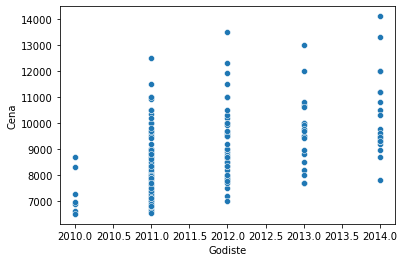

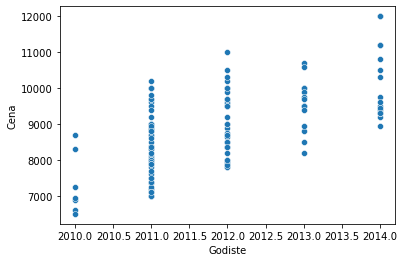

-----------------------------------
Model Passat B8


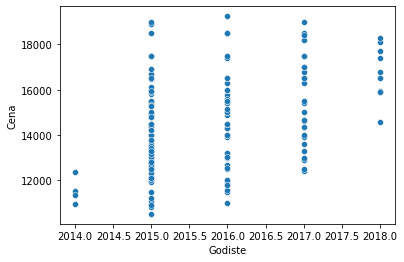

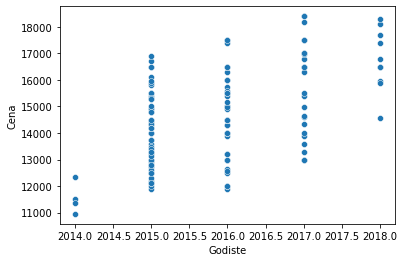

-----------------------------------
Model Passat CC


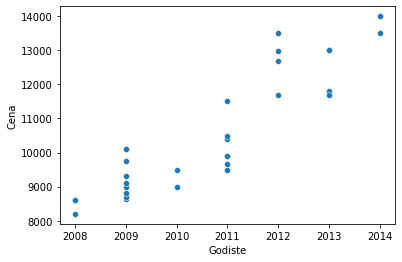

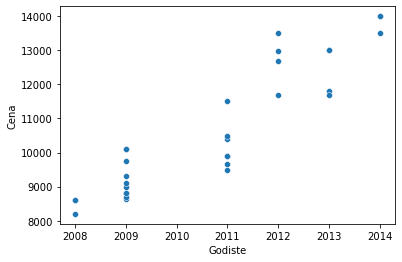

-----------------------------------
Model Polo


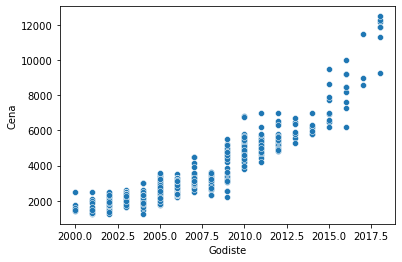

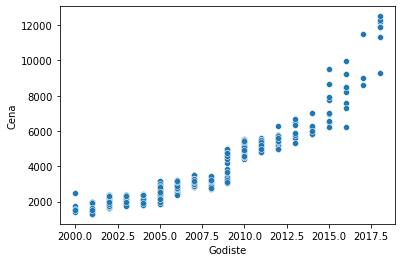

-----------------------------------
Model Punto


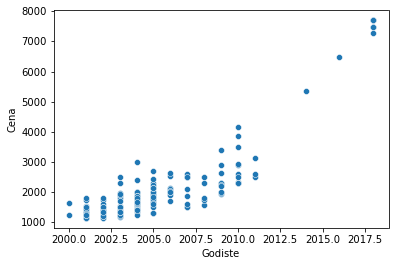

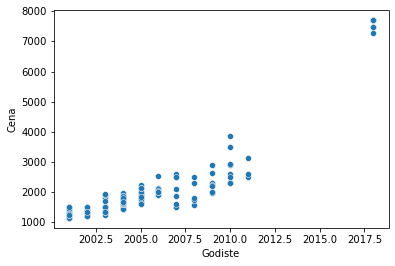

-----------------------------------
Model Q3


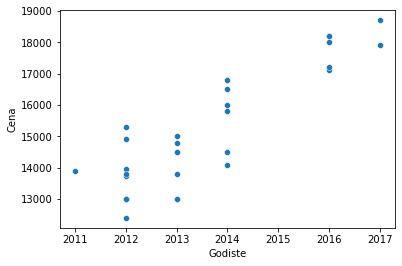

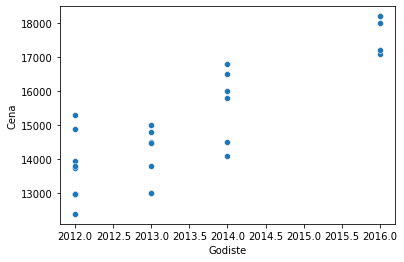

-----------------------------------
Model Q5


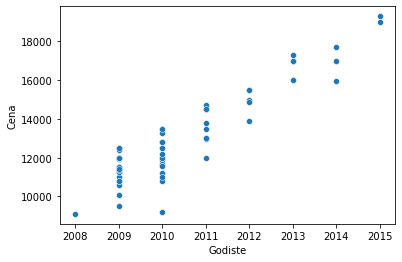

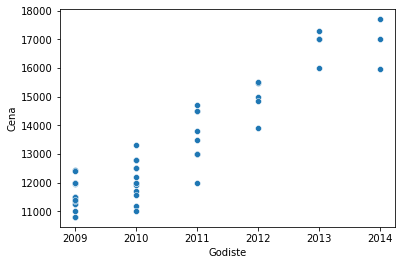

-----------------------------------
Model Qashqai


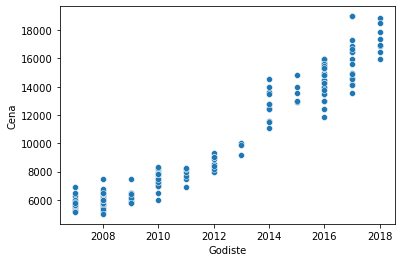

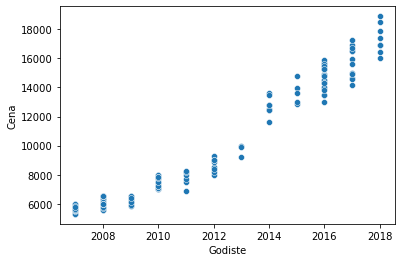

-----------------------------------
Model RAV 4


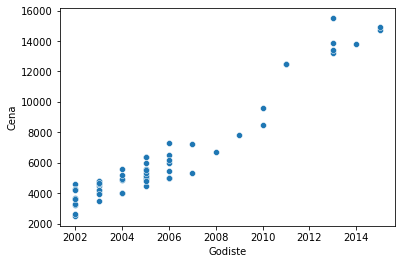

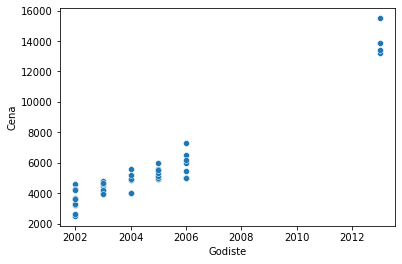

-----------------------------------
Model Roomster


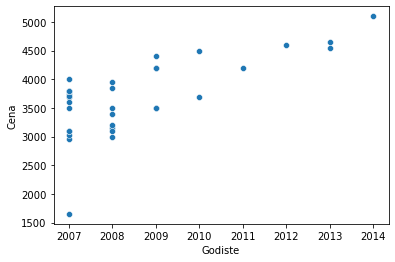

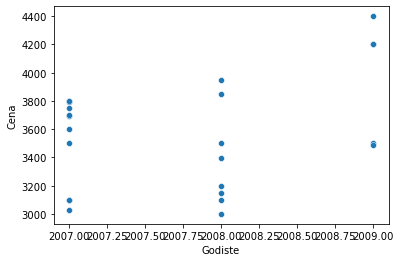

-----------------------------------
Model Santa Fe


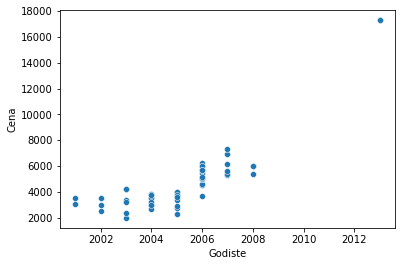

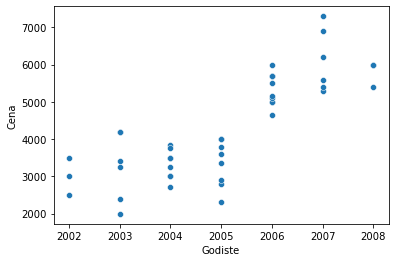

-----------------------------------
Model Scenic


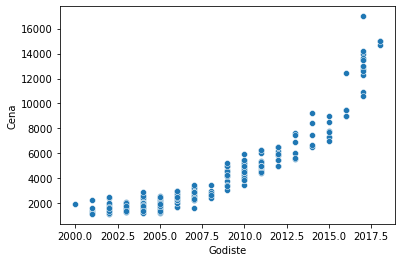

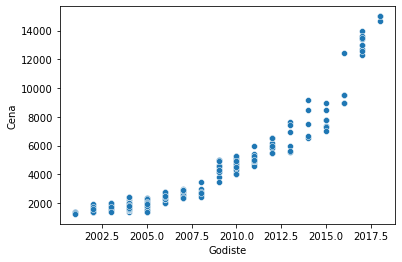

-----------------------------------
Model Sharan


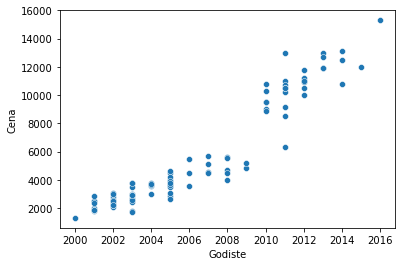

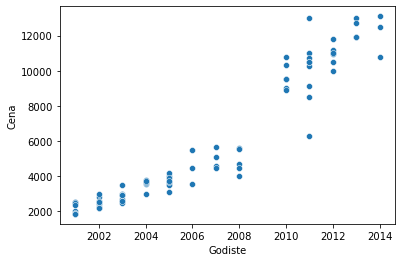

-----------------------------------
Model Sorento


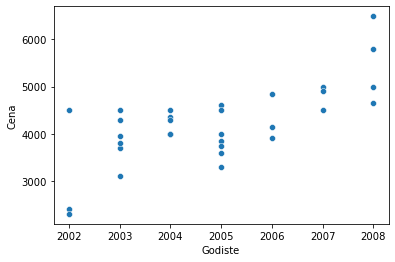

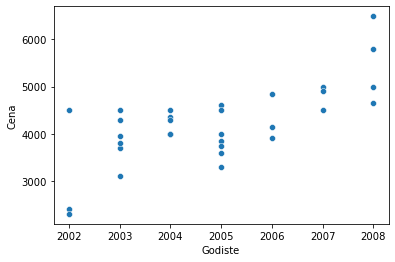

-----------------------------------
Model Sportage


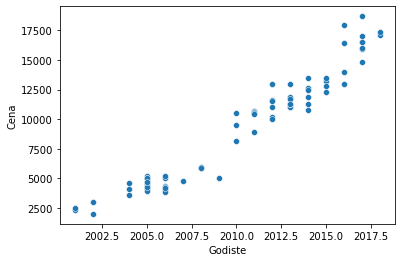

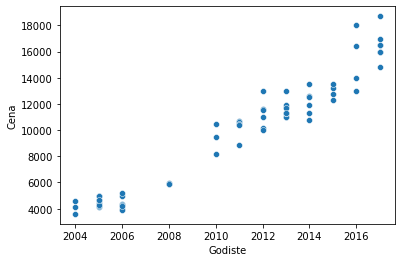

-----------------------------------
Model Stilo


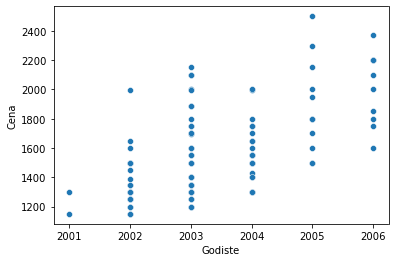

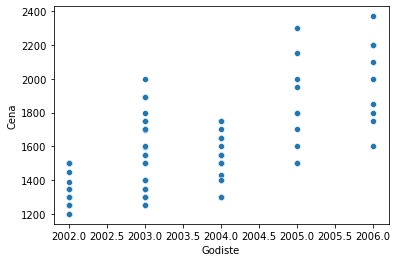

-----------------------------------
Model Superb


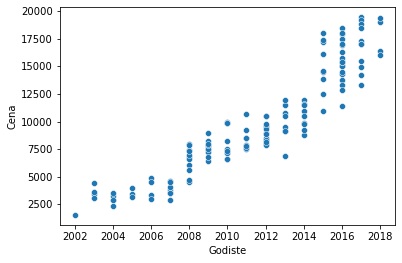

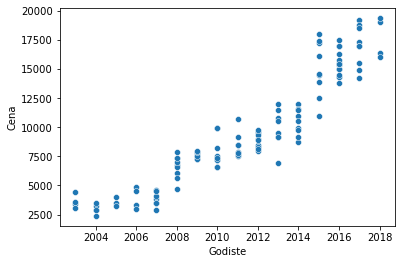

-----------------------------------
Model Swift


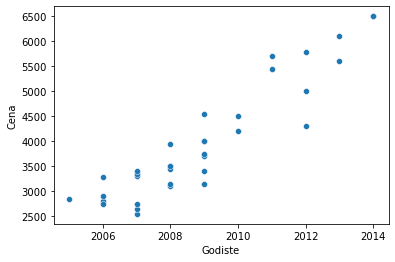

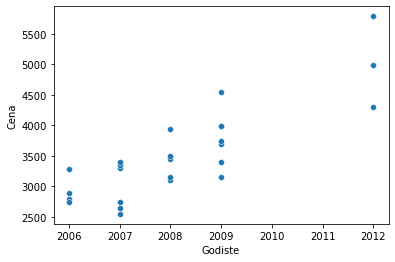

-----------------------------------
Model Talisman


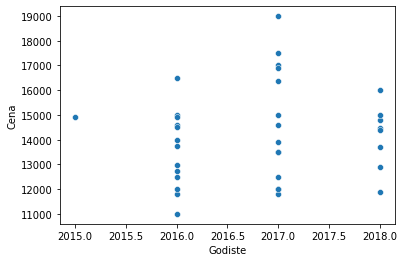

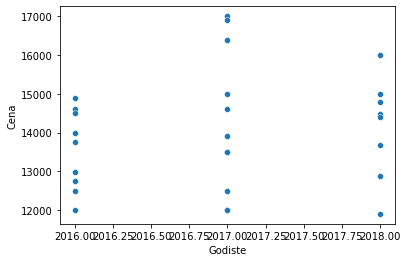

-----------------------------------
Model Tiguan


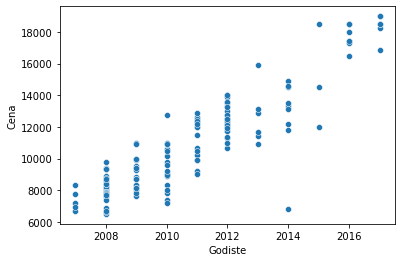

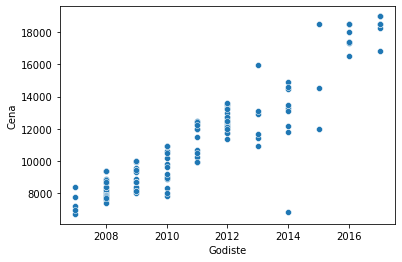

-----------------------------------
Model Touareg


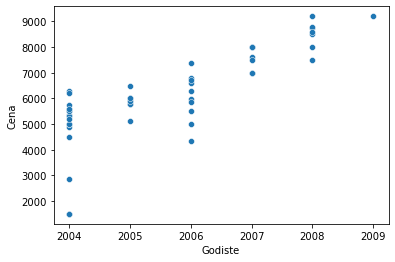

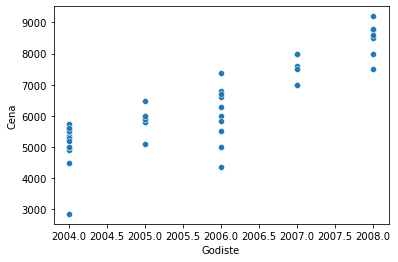

-----------------------------------
Model Touran


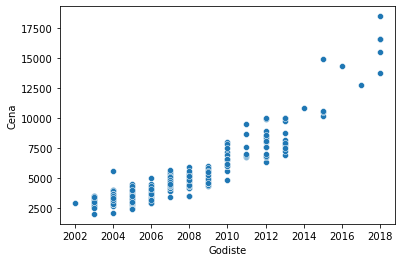

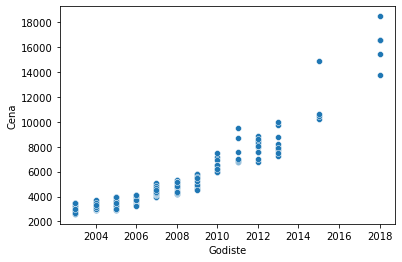

-----------------------------------
Model Tucson


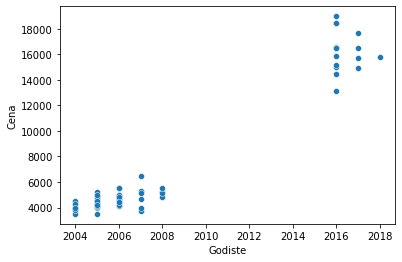

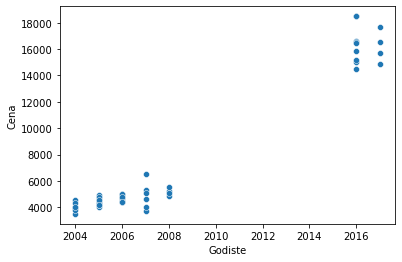

-----------------------------------
Model Twingo


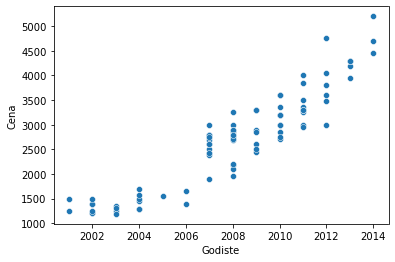

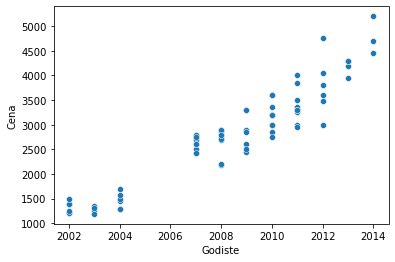

-----------------------------------
Model V40


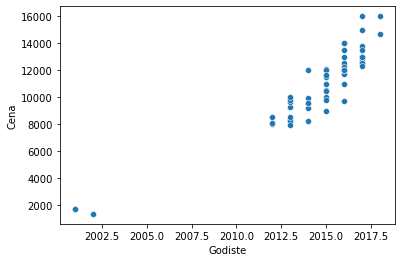

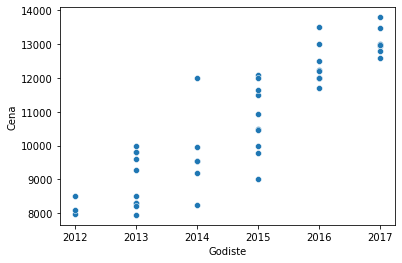

-----------------------------------
Model V50


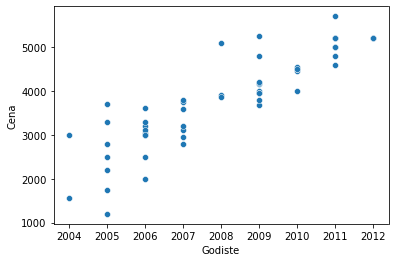

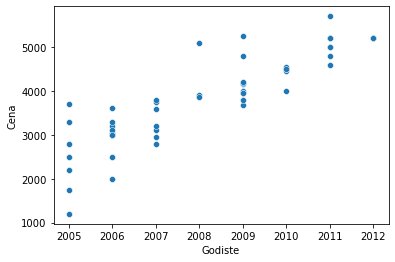

-----------------------------------
Model Vectra C


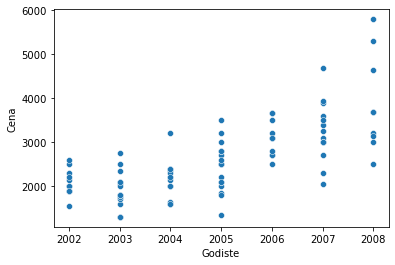

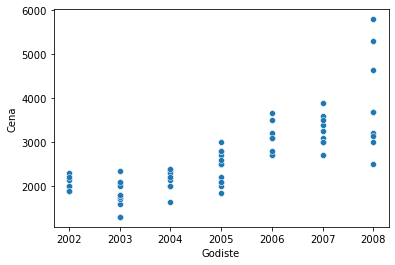

-----------------------------------
Model X-Trail


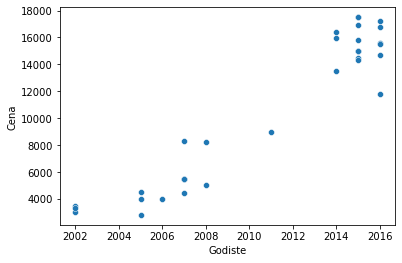

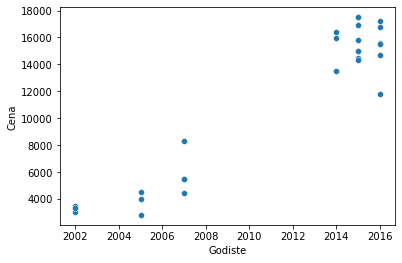

-----------------------------------
Model X1


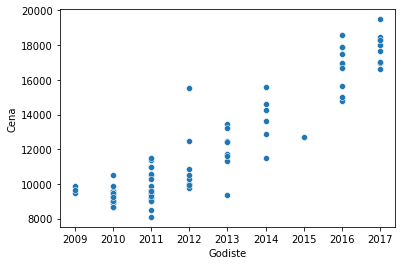

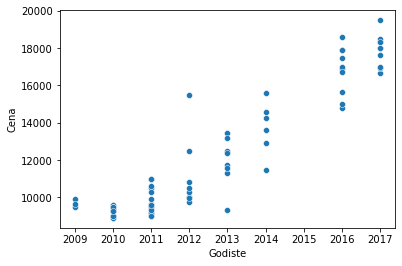

-----------------------------------
Model X3


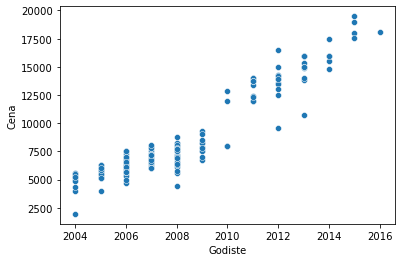

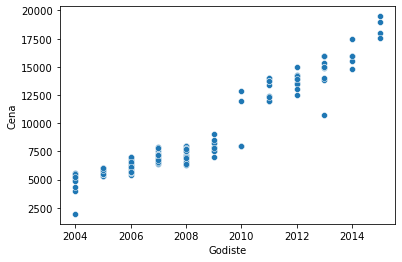

-----------------------------------
Model Xsara Picasso


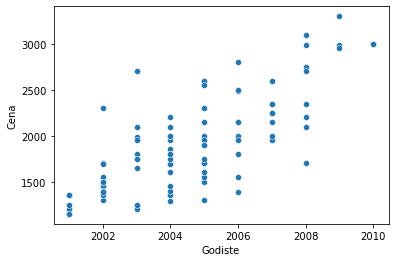

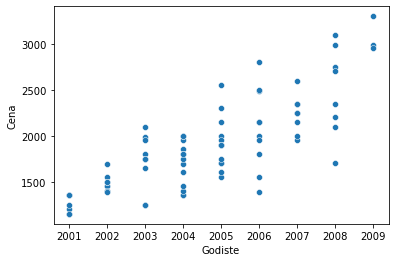

-----------------------------------
Model Yaris


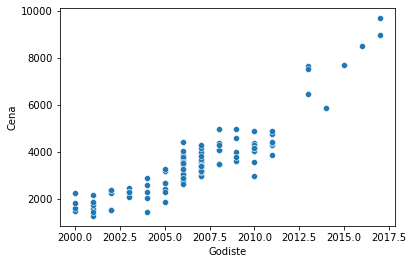

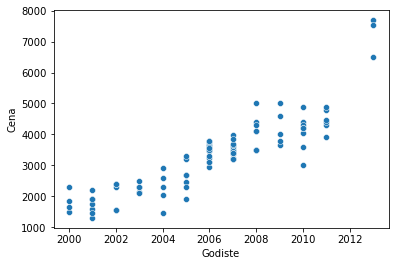

-----------------------------------
Model Ypsilon


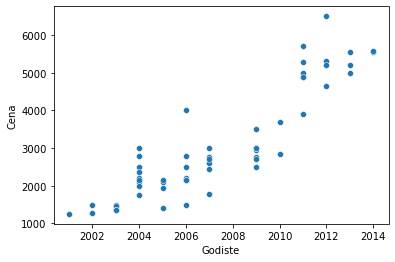

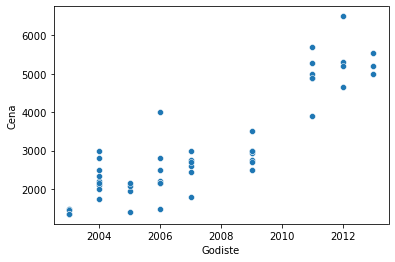

-----------------------------------
Model Zafira


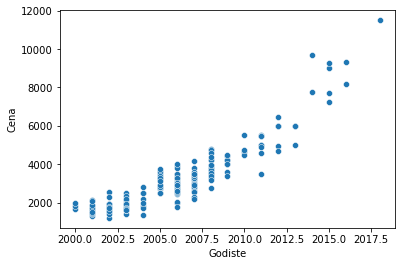

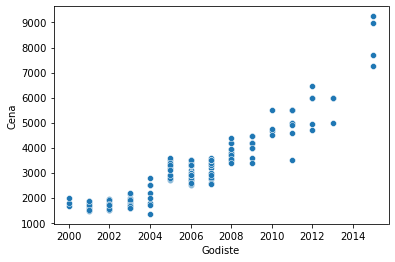

In [71]:
for model in df['Model'].unique():
    
    if int(df[df['Model']==model].count()[0])>=30:
        print('-'*35)
        print('Model {}'.format(model))
        sns.scatterplot('Godiste', 'Cena', data=df[df['Model']==model])
        plt.show()

        for year in range(df[df['Model']==model]['Godiste'].min(), df[df['Model']==model]['Godiste'].max()+1):
            if df[(df['Model']==model) & (df['Godiste']==year)].count()[0]>10:
                upper = df[(df['Model']==model) & (df['Godiste']==year)]['Cena'].quantile(0.90)
                lower = df[(df['Model']==model) & (df['Godiste']==year)]['Cena'].quantile(0.10)
                df.drop(df[(df['Model']==model) & (df['Godiste']==year) & (df['Cena']>upper)].index, inplace=True)
                df.drop(df[(df['Model']==model) & (df['Godiste']==year) & (df['Cena']< lower)].index, inplace=True)
            if df[(df['Model']==model) & (df['Godiste']==year)].count()[0]<3:
                df.drop(df[(df['Model']==model) & (df['Godiste']==year)].index, inplace=True)
 
        sns.scatterplot('Godiste', 'Cena', data=df[df['Model']==model])
        plt.show()
    

In [72]:
"""for model in df['Model'].unique():
    
    #if int(df[df['Model']==model].count()[0])>=30:
    print('-'*35)
    print('Model {}'.format(model))
    sns.scatterplot('Godiste', 'Cena', data=df[df['Model']==model])
    plt.show()"""

"for model in df['Model'].unique():\n    \n    #if int(df[df['Model']==model].count()[0])>=30:\n    print('-'*35)\n    print('Model {}'.format(model))\n    sns.scatterplot('Godiste', 'Cena', data=df[df['Model']==model])\n    plt.show()"

In [73]:
df = df.groupby('Model').filter(lambda x: len(x)>=30)

In [74]:
df.drop((df[df['Model'].isin(['120','Ypsilon','Tucson','Musa','MiTo','Galaxy','Fusion','Espace','Captiva','Agila', '525', 'Bora','Caddy','Astra K', 'A 150', 'Avensis', 'C2', 'Croma','Cruze', 'DS3', 'Delta', 'EVO','Grand Vitara', '5', 'Antara', 'Altea', 'Idea'])].index), inplace=True)
df.drop(df[(df['Model']=='A 160') & (df['Godiste']==2016)].index, inplace=True)
df.drop(df[(df['Model']=='A 170') & (df['Godiste']==2008)].index, inplace=True)
df.drop(df[(df['Model']=='Alhambra')].index, inplace=True)
df.drop(df[(df['Model']=='Astra G') & (df['Godiste']==2005)].index, inplace=True)
df.drop(df[(df['Model']=='Auris') & (df['Godiste']==2016)].index, inplace=True)
df.drop(df[(df['Model']=='B 200') & (df['Godiste']>2009)].index, inplace=True)
df.drop(df[(df['Model']=='C1') & (df['Godiste']>2010)].index, inplace=True)
df.drop(df[(df['Model']=='C4 Grand Picasso') & (df['Godiste']>2011)].index, inplace=True)
df.drop(df[(df['Model']=='Espace') & (df['Godiste']>2011)].index, inplace=True)
df.drop(df[(df['Model']=='Giulietta') & (df['Godiste']>2014)].index, inplace=True)
df.drop(df[(df['Model']=='Meriva') & (df['Godiste']>2012)].index, inplace=True)
df.drop(df[(df['Model']=='Punto') & (df['Godiste']>2011)].index, inplace=True)
df.drop(df[(df['Model']=='Grande Punto') & (df['Godiste']>2011)].index, inplace=True)
df.drop(df[(df['Model']=='RAV 4') & (df['Godiste']>2006)].index, inplace=True)
df.drop(df[(df['Model']=='Sorento') & (df['Godiste']<2003)].index, inplace=True)
df.drop(df[(df['Model']=='120') & (df['Godiste']<2009)].index, inplace=True)
df.drop(df[(df['Model']=='5008') & (df['Godiste']<2014)].index, inplace=True)
df.drop(df[(df['Model']=='Touran') & (df['Godiste']<2016)].index, inplace=True)
df.drop(df[(df['Model']=='500') & (df['Godiste']>2014)].index, inplace=True)
df.drop(df[(df['Model']=='Clio') & (df['Godiste']==2013) & (df['Cena']>8000)].index, inplace=True)
df.drop(df[(df['Model']=='C 180')].index, inplace=True)
df.drop(df[(df['Model']=='C3 Picasso')].index, inplace=True)
df.drop(df[(df['Model']=='3008') & (df['Godiste']==2016)& (df['Cena']<14000)].index, inplace=True)

df.drop(df[(df['Model']=='500') & (df['Godiste']==2013)& (df['Cena']>7000)].index, inplace=True)
df.drop(df[(df['Model']=='C 220')].index, inplace=True)
df.drop(df[(df['Model']=='B 180') & (df['Godiste']==2010)& (df['Cena']<4000)].index, inplace=True)
df.drop(df[(df['Model']=='C 200') & (df['Godiste']>2013)].index, inplace=True)
df.drop(df[(df['Model']=='C-Max') & (df['Godiste']>2014)].index, inplace=True)
df.drop(df[(df['Model']=='C4 Picasso') & (df['Godiste']>2012)& (df['Godiste']<2015)& (df['Cena']>7000)].index, inplace=True)
df.drop(df[(df['Model']=='A6') & (df['Godiste']>2015)& (df['Cena']<15000)].index, inplace=True)
df.drop(df[(df['Model']=='147') & (df['Cena']>3500)].index, inplace=True)
df.drop(df[(df['Model']=='159') & (df['Godiste']>2008)& (df['Cena']>5500)].index, inplace=True)
df.drop(df[(df['Model']=='206') & (df['Godiste']>2007)& (df['Cena']<1800)].index, inplace=True)
df.drop(df[(df['Model']=='208') & (df['Godiste']==2015)& (df['Cena']>7100)].index, inplace=True)
df.drop(df[(df['Model']=='3') & (df['Godiste']==2005)& (df['Cena']<2000)].index, inplace=True)
df.drop(df[(df['Model']=='3') & (df['Godiste']==2009)& (df['Cena']<4000)].index, inplace=True)
df.drop(df[(df['Model']=='3008') & (df['Godiste']>2015)].index, inplace=True)
df.drop(df[(df['Model']=='3008') & (df['Godiste']==2014)& (df['Cena']>11000)].index, inplace=True)
df.drop(df[(df['Model']=='318') & (df['Godiste']>2014)].index, inplace=True)
df.drop(df[(df['Model']=='320') & (df['Godiste']>2013)].index, inplace=True)
df.drop(df[(df['Model']=='A 160') & (df['Godiste']<2004)].index, inplace=True)
df.drop(df[(df['Model']=='A 170') & (df['Godiste']==2004)& (df['Cena']<1500)].index, inplace=True)
df.drop(df[(df['Model']=='A 170') & (df['Godiste']==2004)& (df['Cena']>2500)].index, inplace=True)
df.drop(df[(df['Model']=='A 170') & (df['Godiste']>2004)& (df['Cena']<2500)].index, inplace=True)
df.drop(df[(df['Model']=='A 180') & (df['Godiste']>2011)].index, inplace=True)
df.drop(df[(df['Model']=='Astra H') & (df['Godiste']>2010)].index, inplace=True)
df.drop(df[(df['Model']=='Astra J') & (df['Godiste']==2009)& (df['Cena']<4000)].index, inplace=True)
df.drop(df[(df['Model']=='B 200') & (df['Godiste']==2007)& (df['Cena']<3500)].index, inplace=True)
df.drop(df[(df['Model']=='B 200') & (df['Godiste']==2007)& (df['Cena']>5000)].index, inplace=True)
df.drop(df[(df['Model']=='Bravo') & (df['Godiste']==2012)& (df['Cena']<3500)].index, inplace=True)
df.drop(df[(df['Model']=='Bravo') & (df['Godiste']==2013)& (df['Cena']>5500)].index, inplace=True)
df.drop(df[(df['Model']=='C1') & (df['Godiste']==2010)& (df['Cena']>4000)].index, inplace=True)
df.drop(df[(df['Model']=='C1') & (df['Godiste']==2010)& (df['Cena']<3000)].index, inplace=True)
df.drop(df[(df['Model']=='C4') & (df['Godiste']==2014)& (df['Cena']<5500)].index, inplace=True)
df.drop(df[(df['Model']=='E 200')].index, inplace=True)
df.drop(df[(df['Model']=='E 220') & (df['Godiste']==2005)& (df['Cena']<2500)].index, inplace=True)
df.drop(df[(df['Model']=='Fabia') & (df['Godiste']==2014)].index, inplace=True)
df.drop(df[(df['Model']=='Fiesta') & (df['Godiste']==2012)& (df['Cena']<3500)].index, inplace=True)
df.drop(df[(df['Model']=='Focus') & (df['Godiste']>2016)& (df['Cena']>10000)].index, inplace=True)
df.drop(df[(df['Model']=='Golf 4') & (df['Godiste']>2003)& (df['Cena']<2000)].index, inplace=True)
df.drop(df[(df['Model']=='Golf 5') & (df['Godiste']==2009) & (df['Cena']<3500)].index, inplace=True)
df.drop(df[(df['Model']=='Golf Plus') & (df['Godiste']>2009)].index, inplace=True)
df.drop(df[(df['Model']=='Ibiza') & (df['Godiste']>2012)].index, inplace=True)
df.drop(df[(df['Model']=='Juke') & (df['Godiste']>2013) & (df['Cena']<8500)].index, inplace=True)
df.drop(df[(df['Model']=='Laguna') & (df['Godiste']>2014)].index, inplace=True)
df.drop(df[(df['Model']=='Leon') & (df['Cena']>12000)].index, inplace=True)
df.drop(df[(df['Model']=='Micra') & (df['Godiste']>2007)].index, inplace=True)
df.drop(df[(df['Model']=='Modus') & (df['Godiste']>2007)].index, inplace=True)
df.drop(df[(df['Model']=='Mondeo') & (df['Godiste']>2015)  & (df['Cena']>14000)].index, inplace=True)
df.drop(df[(df['Model']=='Panda') & (df['Godiste']>2012)].index, inplace=True)
df.drop(df[(df['Model']=='Passat B5.5') & (df['Godiste']<2001)].index, inplace=True)
df.drop(df[(df['Model']=='Passat B8') & (df['Godiste']<2015)].index, inplace=True)
df.drop(df[(df['Model']=='Punto') & (df['Cena']>3000)].index, inplace=True)
df.drop(df[(df['Model']=='Punto') & (df['Godiste']>2010)].index, inplace=True)
df.drop(df[(df['Model']=='RAV 4') & (df['Cena']<3000)].index, inplace=True)
df.drop(df[(df['Model']=='RAV 4') & (df['Cena']>7000)].index, inplace=True)
df.drop(df[(df['Model']=='Santa Fe') & (df['Godiste']>2007)].index, inplace=True)
df.drop(df[(df['Model']=='Santa Fe') & (df['Godiste']<2004)].index, inplace=True)
df.drop(df[(df['Model']=='Sharan') & (df['Godiste']==2011) & (df['Cena']<8000)].index, inplace=True)
df.drop(df[(df['Model']=='Sharan') & (df['Godiste']==2011) & (df['Cena']>12000)].index, inplace=True)
df.drop(df[(df['Model']=='Tiguan') & (df['Godiste']==2014) & (df['Cena']<10000)].index, inplace=True)
df.drop(df[(df['Model']=='Tiguan') & (df['Godiste']==2013) & (df['Cena']>14000)].index, inplace=True)
df.drop(df[(df['Model']=='Touareg') & (df['Godiste']==2006) & (df['Cena']<5000)].index, inplace=True)
df.drop(df[(df['Model']=='Touareg') & (df['Godiste']==2004) & (df['Cena']<4000)].index, inplace=True)
df.drop(df[(df['Model']=='Vectra C') & (df['Godiste']>2007)].index, inplace=True)
df.drop(df[(df['Model']=='X1') & (df['Godiste']==2012) & (df['Cena']>14000)].index, inplace=True)
df.drop(df[(df['Model']=='X1') & (df['Godiste']==2014) & (df['Cena']<12000)].index, inplace=True)
df.drop(df[(df['Model']=='X1') & (df['Godiste']==2013) & (df['Cena']<10000)].index, inplace=True)
df.drop(df[(df['Model']=='X1') & (df['Godiste']==2016) & (df['Cena']<16000)].index, inplace=True)
df.drop(df[(df['Model']=='X3') & (df['Godiste']==2004) & (df['Cena']<2500)].index, inplace=True)
df.drop(df[(df['Model']=='X3') & (df['Godiste']==2013) & (df['Cena']<10000)].index, inplace=True)
df.drop(df[(df['Model']=='X3') & (df['Godiste']==2010) & (df['Cena']<10000)].index, inplace=True)
df.drop(df[(df['Model']=='Yaris') & (df['Godiste']>2011)].index, inplace=True)
df.drop(df[(df['Model']=='Insignia') & (df['Godiste']==2013) & (df['Cena']<6000)].index, inplace=True)
df.drop(df[(df['Model']=='Insignia') & (df['Godiste']==2013) & (df['Cena']>9000)].index, inplace=True)
df.drop(df[(df['Model']=='107') & (df['Godiste']>2007) & (df['Cena']>3500)].index, inplace=True)
df.drop(df[(df['Model']=='107') & (df['Cena']<1500)].index, inplace=True)

In [75]:
"""for model in df['Model'].unique():
    
    print('-'*35)
    print('Model {}'.format(model))

    sns.scatterplot('Godiste', 'Cena', data=df[df['Model']==model])
    plt.show()"""


"for model in df['Model'].unique():\n    \n    print('-'*35)\n    print('Model {}'.format(model))\n\n    sns.scatterplot('Godiste', 'Cena', data=df[df['Model']==model])\n    plt.show()"

In [76]:
df

,Marka,Model,Godiste,Kilometraza,Karoserija,Gorivo,Kubikaza,Snaga motora,Cena,EKM,Pogon,Menjac,Klima,Boja,Materijal enterijera
77,Peugeot,107,2008,150000,Hecbek,Benzin,1.0,70,2880,Euro 4,Prednji,Manuelni 5 brzina,Manuelna klima,Crna,Stof
868,Peugeot,107,2008,152210,Hecbek,Benzin,1.0,70,2950,Euro 4,Prednji,Manuelni 5 brzina,Manuelna klima,Siva,Stof
1166,Peugeot,107,2008,130000,Hecbek,Benzin,1.0,70,2995,Euro 4,Prednji,Manuelni 5 brzina,Manuelna klima,Crvena,Stof
2280,Peugeot,107,2007,161653,Hecbek,Benzin,1.0,70,2400,Euro 4,Prednji,Manuelni 5 brzina,Manuelna klima,Crna,Stof
3464,Peugeot,107,2007,141390,Hecbek,Benzin,1.0,70,2750,Euro 4,Prednji,Manuelni 5 brzina,Manuelna klima,Crna,Stof
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24571,Opel,Zafira,2003,225000,MiniVan,Dizel,2.0,100,1700,Euro 3,Prednji,Manuelni 5 brzina,Manuelna klima,Druga,Stof
25238,Opel,Zafira,2003,315234,MiniVan,Dizel,2.0,100,1650,Euro 3,Prednji,Manuelni 5 brzina,Manuelna klima,Siva,Stof
25246,Opel,Zafira,2004,225000,MiniVan,Dizel,2.0,100,1999,Euro 3,Prednji,Manuelni 5 brzina,Automatska klima,Plava,Stof
25914,Opel,Zafira,2002,220000,MiniVan,Dizel,2.0,100,1700,Euro 3,Prednji,Manuelni 5 brzina,Manuelna klima,Druga,Stof


In [77]:
df['Boja'].value_counts()

Siva      6731
Crna      4475
Druga     2244
Plava     1737
Bela      1661
Crvena     641
Name: Boja, dtype: int64

In [78]:
df['Menjac'].value_counts()

Manuelni 5 brzina               8735
Manuelni 6 brzina               6635
Automatski / poluautomatski     2119
Name: Menjac, dtype: int64

In [79]:
df['Klima'].value_counts()

Automatska klima     10695
Manuelna klima        6564
Nema klimu             230
Name: Klima, dtype: int64

In [80]:
df['prosek_god_km']=df['Kilometraza']/(2021 - df['Godiste'])
df['Starost'] = 2021 - df['Godiste']

<AxesSubplot:xlabel='prosek_god_km', ylabel='Density'>

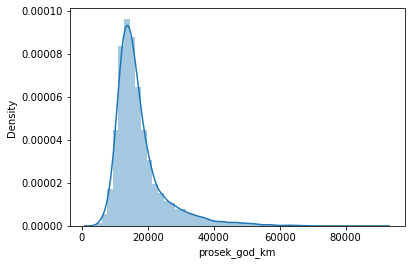

In [81]:
sns.distplot(df['prosek_god_km'])

In [82]:
df['sin_odo']=df['Kilometraza'].apply(lambda x: np.sin(x))
df['sin_age']=df['Starost'].apply(lambda x: np.sin(x))

In [83]:
df.drop(df[df['Godiste']>2016].index, inplace=True)

<AxesSubplot:xlabel='prosek_god_km', ylabel='Godiste'>

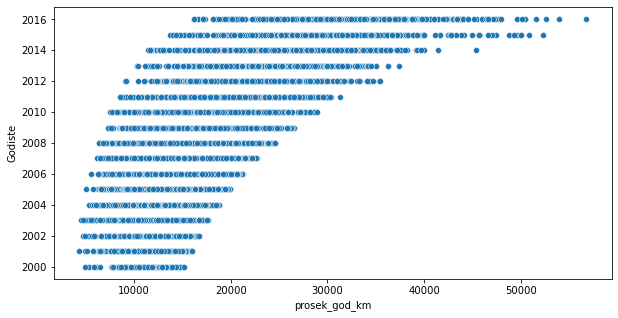

In [84]:
plt.figure(figsize=(10,5))
sns.scatterplot(df['prosek_god_km'], df['Godiste'], data=df)

<AxesSubplot:xlabel='prosek_god_km', ylabel='Cena'>

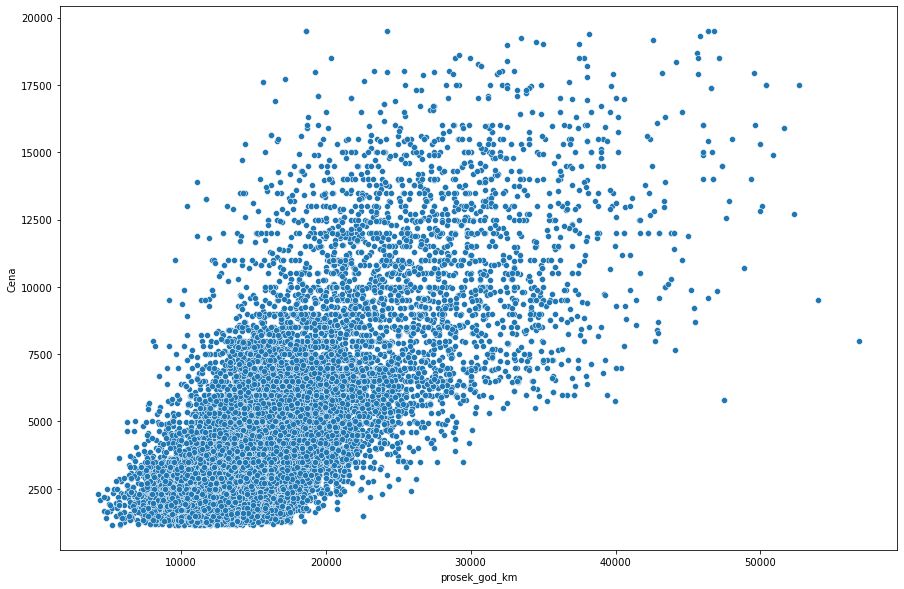

In [85]:
plt.figure(figsize=(15,10))
sns.scatterplot(df['prosek_god_km'], df['Cena'], data=df)

In [86]:
for km in range(round(df['prosek_god_km'].min()), round(df['prosek_god_km'].max())+1000, 1000):
    
    high_price = df[(df['prosek_god_km']>km) & (df['prosek_god_km']<km+5000)]['Cena'].quantile(0.99)
    low_price = df[(df['prosek_god_km']>km) & (df['prosek_god_km']<km+5000)]['Cena'].quantile(0.01)
    df.drop(df[(df['prosek_god_km']>km) & (df['prosek_god_km']<km+5000) & (df['Cena']>high_price)].index, inplace=True)
    df.drop(df[(df['prosek_god_km']>km) & (df['prosek_god_km']<km+5000) & (df['Cena']<low_price)].index, inplace=True)
    

In [87]:
df.drop(df[df['prosek_god_km']>45000].index, inplace=True)

<AxesSubplot:xlabel='Kilometraza', ylabel='Cena'>

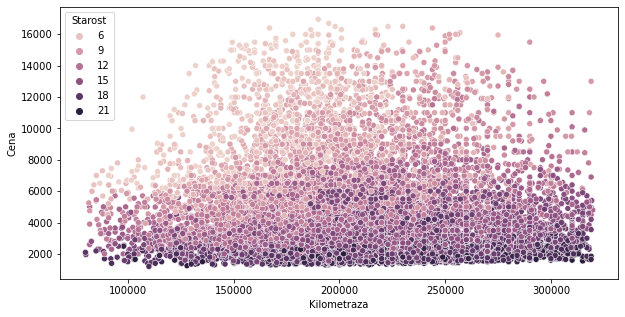

In [88]:
plt.figure(figsize=(10,5))
sns.scatterplot(df['Kilometraza'], df['Cena'], data=df, hue='Starost')

<AxesSubplot:xlabel='Godiste', ylabel='Kilometraza'>

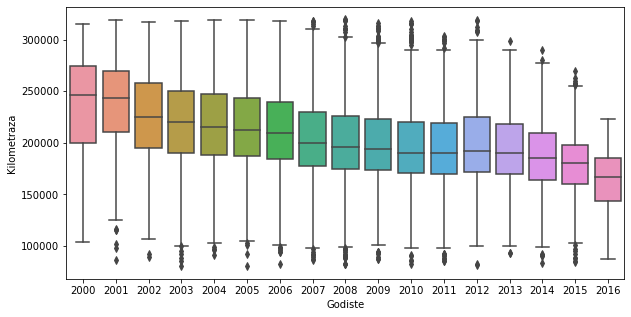

In [89]:
plt.figure(figsize=(10,5))
sns.boxplot(df['Godiste'], df['Kilometraza'], data=df)

In [90]:
df.drop(df[(df['Godiste']<2012) & (df['Kilometraza']<110000)].index, inplace=True)
df.drop(df[(df['Godiste']>2012) & (df['Kilometraza']<90000)].index, inplace=True)

<AxesSubplot:xlabel='Godiste', ylabel='Kilometraza'>

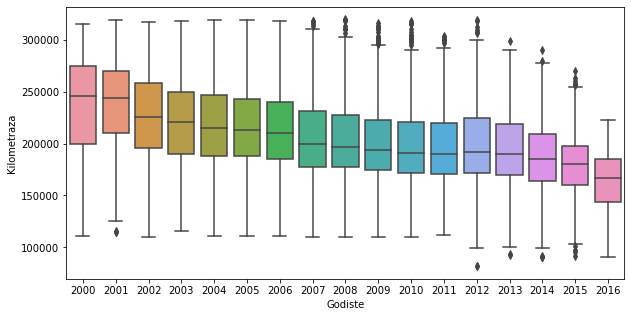

In [91]:
plt.figure(figsize=(10,5))
sns.boxplot(df['Godiste'], df['Kilometraza'], data=df)

<AxesSubplot:xlabel='prosek_god_km', ylabel='Cena'>

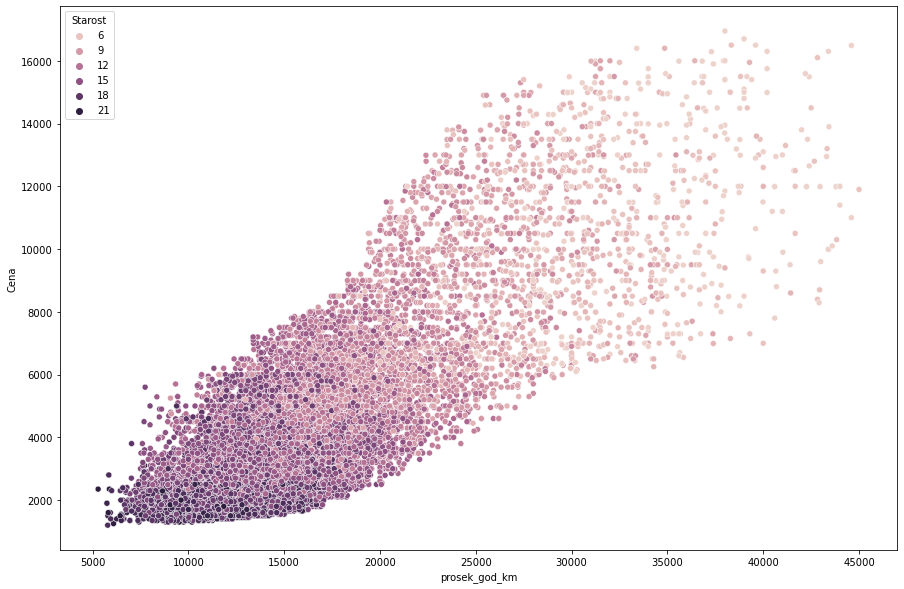

In [92]:
plt.figure(figsize=(15,10))
sns.scatterplot(df['prosek_god_km'], df['Cena'], data=df, hue='Starost')

In [93]:
df['Model'].value_counts()

A4           765
Golf 5       583
320          514
Passat B6    479
Polo         476
            ... 
Kadjar        22
Passat CC     21
A5            21
Captur        19
Q5            14
Name: Model, Length: 106, dtype: int64

In [94]:
df = df.groupby('Model').filter(lambda x: len(x)>=45)

In [95]:
df['Model'].value_counts()

A4                  765
Golf 5              583
320                 514
Passat B6           479
Polo                476
                   ... 
Stilo                49
A 170                49
C4 Grand Picasso     47
Tiguan               47
Giulietta            45
Name: Model, Length: 83, dtype: int64

In [96]:
df[df['Cena']>10000]['Model'].value_counts()

Golf 7        100
A4             78
520            66
Passat B8      64
A3             51
320            35
Tiguan         28
A6             28
Kuga           27
Superb         27
Qashqai        25
Octavia        25
316            20
508            19
318            18
Mondeo         17
Sharan         17
X3             14
E 220          14
B 180          14
Passat B7      14
116            10
Megane          9
Insignia        8
118             7
C 200           6
6               4
Leon            2
Scenic          1
C4 Picasso      1
C5              1
Name: Model, dtype: int64

In [97]:
for model in df[df['Cena']>13000]['Model'].unique():
    print("**"*35)
    print("Model {}, > 13000 : {}, \n From {}".format(model, df[(df['Model']==model) & (df['Cena']>13000)].count()[0], df[(df['Model']==model)].count()[0]))
    pnct = (df[(df['Model']==model) & (df['Cena']>13000)].count()[0])/df[(df['Model']==model)].count()[0] * 100
    print("Cheaper than 13000 is {}".format(pnct))
    if pnct<=10:
        df.drop(df[(df['Model']==model) & (df['Cena']>13000)].index, inplace=True)
    

**********************************************************************
Model 116, > 13000 : 2, 
 From 98
Cheaper than 13000 is 2.0408163265306123
**********************************************************************
Model 118, > 13000 : 3, 
 From 119
Cheaper than 13000 is 2.5210084033613445
**********************************************************************
Model 316, > 13000 : 3, 
 From 74
Cheaper than 13000 is 4.054054054054054
**********************************************************************
Model 318, > 13000 : 2, 
 From 226
Cheaper than 13000 is 0.8849557522123894
**********************************************************************
Model 320, > 13000 : 6, 
 From 514
Cheaper than 13000 is 1.1673151750972763
**********************************************************************
Model 520, > 13000 : 26, 
 From 203
Cheaper than 13000 is 12.807881773399016
**********************************************************************
Model 6, > 13000 : 2, 
 From 76
Cheaper than 1300

In [98]:
for model in df['Model'].unique():
    
    
    for year in sorted(df[df['Model']==model]['Godiste'].unique()):
        try:
            std = round(df[(df['Model']==model) & (df['Godiste']==year)]['Cena'].std())
            if std>=1000 and year<2013 and df[(df['Model']==model) & (df['Godiste']==year)].count()[0]>10:
                print("**"*35)
                print("Model ", model)
                #print("Based on {} data from {}:".format(df[(df['Model']==model) & (df['Godiste']==year)].count()[0], year))
                print("std.dev is {}".format(std))
                df.drop(df[(df['Model']==model) & (df['Godiste']==year)]['Cena'].idxmax(), inplace = True)
                df.drop(df[(df['Model']==model) & (df['Godiste']==year)]['Cena'].idxmin(), inplace = True)
                std = round(df[(df['Model']==model) & (df['Godiste']==year)]['Cena'].std())
                print("std.dev after min-max cutoff is {}".format(std))
            
        except:
            pass
    

**********************************************************************
Model  320
std.dev is 1143
std.dev after min-max cutoff is 981
**********************************************************************
Model  A6
std.dev is 1110
std.dev after min-max cutoff is 1055


In [99]:
df[df['Cena']>10000]['Model'].value_counts()

Golf 7        99
520           66
Passat B8     64
A4            53
320           28
Tiguan        28
A3            27
Kuga          27
Superb        27
Octavia       25
Qashqai       25
508           19
316           17
Sharan        16
318           16
Mondeo        15
Passat B7     14
A6            13
E 220         12
B 180         11
Megane         9
116            8
Insignia       8
C 200          6
X3             4
118            4
Leon           2
6              2
Scenic         1
C4 Picasso     1
C5             1
Name: Model, dtype: int64

In [100]:
df.drop(df[df['Model']=='Passat B8'].index, inplace=True)

In [101]:
df

,Marka,Model,Godiste,Kilometraza,Karoserija,Gorivo,Kubikaza,Snaga motora,Cena,EKM,Pogon,Menjac,Klima,Boja,Materijal enterijera,prosek_god_km,Starost,sin_odo,sin_age
571,BMW,116,2015,194000,Hecbek,Dizel,1.5,115,10900,Euro 6,Zadnji,Manuelni 6 brzina,Manuelna klima,Plava,Stof,32333.333333,6,0.362040,-0.279415
3183,BMW,116,2015,176000,Hecbek,Dizel,1.5,115,10990,Euro 6,Zadnji,Manuelni 6 brzina,Manuelna klima,Crna,Stof,29333.333333,6,0.992127,-0.279415
12701,BMW,116,2015,197000,Hecbek,Dizel,1.5,115,10290,Euro 6,Zadnji,Manuelni 6 brzina,Automatska klima,Plava,Stof,32833.333333,6,-0.148915,-0.279415
12784,BMW,116,2016,141000,Hecbek,Dizel,1.5,115,12900,Euro 6,Zadnji,Manuelni 6 brzina,Automatska klima,Crna,Stof,28200.000000,5,-0.820039,-0.958924
21274,BMW,116,2015,250000,Hecbek,Dizel,1.5,115,10500,Euro 6,Zadnji,Manuelni 6 brzina,Automatska klima,Crna,Stof,41666.666667,6,-0.996007,-0.279415
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24063,Opel,Zafira,2004,168000,MiniVan,Dizel,2.0,100,2500,Euro 3,Prednji,Manuelni 5 brzina,Manuelna klima,Siva,Stof,9882.352941,17,0.190093,-0.961397
24571,Opel,Zafira,2003,225000,MiniVan,Dizel,2.0,100,1700,Euro 3,Prednji,Manuelni 5 brzina,Manuelna klima,Druga,Stof,12500.000000,18,-0.761646,-0.750987
25246,Opel,Zafira,2004,225000,MiniVan,Dizel,2.0,100,1999,Euro 3,Prednji,Manuelni 5 brzina,Automatska klima,Plava,Stof,13235.294118,17,-0.761646,-0.961397
25914,Opel,Zafira,2002,220000,MiniVan,Dizel,2.0,100,1700,Euro 3,Prednji,Manuelni 5 brzina,Manuelna klima,Druga,Stof,11578.947368,19,0.522393,0.149877


In [102]:
df.drop(columns=['sin_odo', 'sin_age'], inplace=True)

## Data augmentation?

#### Trying to create more data with the existing one by adding "new" cars that has the same specifications like the ones that exist but calculating manually price for mileage increase.

In [103]:
df_enc = df

In [104]:
# Sampling the data for each year 

# Going through every model
for model in df['Model'].unique():
    print("***"*35)
    print("Model {}".format(model))
    # Go through every year which this model has in a dataset
    for year in sorted(df[df['Model']==model]['Godiste'].unique()):
        
        # Calculate the standard deviation in that year
        std = df[(df['Model']==model) & (df['Godiste']==year)]['Cena'].std()
        mean_km = df[(df['Model']==model) & (df['Godiste']==year)]['Kilometraza'].mean()
        mean = df[(df['Model']==model) & (df['Godiste']==year)]['Cena'].mean()
        
        size = df[(df['Model']==model) & (df['Godiste']==year)].count()[0]
        
        if size >= 10:
            n = 6
        elif size < 10 and size > 5:
            n = 5
        else:
            n = size
        for idx, row in df[(df['Model']==model) & (df['Godiste']==year)].sample(n = n, random_state=1).iterrows():
            row1, row2, row3, row4 =  row.to_dict(), row.to_dict(), row.to_dict(), row.to_dict()
            
            row1['Kilometraza'] = row1['Kilometraza'] + np.random.randint(10000, 20000)
            row1['Cena'] = row1['Cena'] - std
            row1['Kilometraza'] = row1['Kilometraza'] - np.random.randint(10000, 20000)
            row1['Cena'] = row1['Cena'] + std
            row1['prosek_god_km'] = row1['Kilometraza']/row1['Starost']
            
            row2['Kilometraza'] = row2['Kilometraza'] + np.random.randint(10000, 20000)
            row2['Cena'] = row2['Cena'] - std
            row2['Kilometraza'] = row2['Kilometraza'] - np.random.randint(10000, 20000)
            row2['Cena'] = row2['Cena'] + std
            row2['prosek_god_km'] = row2['Kilometraza']/row2['Starost']
            
            row3['Kilometraza'] = row3['Kilometraza'] + np.random.randint(5000, 10000)
            row3['Cena'] = row3['Cena'] - std/2
            row3['Kilometraza'] = row3['Kilometraza'] - np.random.randint(5000, 10000)
            row3['Cena'] = row3['Cena'] + std/2
            row3['prosek_god_km'] = row3['Kilometraza']/row3['Starost']
            
            row4['Kilometraza'] = row4['Kilometraza'] + np.random.randint(5000, 10000)
            row2['Cena'] = row4['Cena'] - std/2
            row4['Kilometraza'] = row4['Kilometraza'] - np.random.randint(5000, 10000)
            row4['Cena'] = row4['Cena'] + std/2
            row4['prosek_god_km'] = row4['Kilometraza']/row4['Starost']
            
            df = df.append([row1, row2, row3, row4], ignore_index=True)
            

        
        

*********************************************************************************************************
Model 116
*********************************************************************************************************
Model 118
*********************************************************************************************************
Model 147
*********************************************************************************************************
Model 159
*********************************************************************************************************
Model 206
*********************************************************************************************************
Model 207
*********************************************************************************************************
Model 208
*********************************************************************************************************
Model 3
**************************************************************************

*********************************************************************************************************
Model Scenic
*********************************************************************************************************
Model Sharan
*********************************************************************************************************
Model Stilo
*********************************************************************************************************
Model Superb
*********************************************************************************************************
Model Tiguan
*********************************************************************************************************
Model Twingo
*********************************************************************************************************
Model V50
*********************************************************************************************************
Model Vectra C
**************************************************

<AxesSubplot:xlabel='prosek_god_km', ylabel='Cena'>

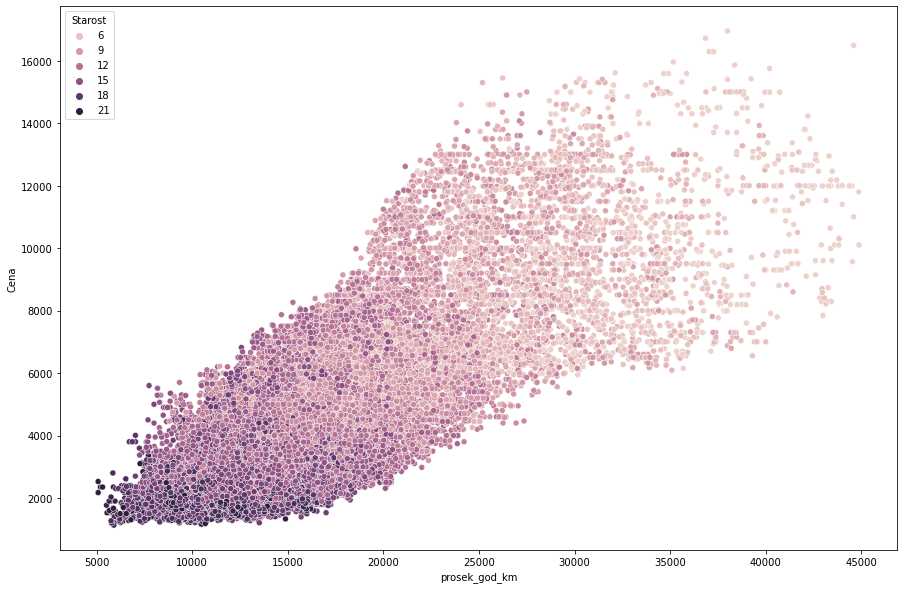

In [105]:
plt.figure(figsize=(15,10))
sns.scatterplot(df['prosek_god_km'], df['Cena'], data=df, hue='Starost')

In [106]:
df

,Marka,Model,Godiste,Kilometraza,Karoserija,Gorivo,Kubikaza,Snaga motora,Cena,EKM,Pogon,Menjac,Klima,Boja,Materijal enterijera,prosek_god_km,Starost
0,BMW,116,2015,194000,Hecbek,Dizel,1.5,115,10900.000000,Euro 6,Zadnji,Manuelni 6 brzina,Manuelna klima,Plava,Stof,32333.333333,6
1,BMW,116,2015,176000,Hecbek,Dizel,1.5,115,10990.000000,Euro 6,Zadnji,Manuelni 6 brzina,Manuelna klima,Crna,Stof,29333.333333,6
2,BMW,116,2015,197000,Hecbek,Dizel,1.5,115,10290.000000,Euro 6,Zadnji,Manuelni 6 brzina,Automatska klima,Plava,Stof,32833.333333,6
3,BMW,116,2016,141000,Hecbek,Dizel,1.5,115,12900.000000,Euro 6,Zadnji,Manuelni 6 brzina,Automatska klima,Crna,Stof,28200.000000,5
4,BMW,116,2015,250000,Hecbek,Dizel,1.5,115,10500.000000,Euro 6,Zadnji,Manuelni 6 brzina,Automatska klima,Crna,Stof,41666.666667,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31817,Opel,Zafira,2015,188092,MiniVan,Dizel,1.6,135,9476.576047,Euro 6,Prednji,Manuelni 6 brzina,Automatska klima,Siva,Prirodna koza,31348.666667,6
31818,Opel,Zafira,2015,164116,MiniVan,Dizel,1.6,135,9250.000000,Euro 6,Prednji,Manuelni 6 brzina,Automatska klima,Plava,Prirodna koza,27352.666667,6
31819,Opel,Zafira,2015,164965,MiniVan,Dizel,1.6,135,8763.423953,Euro 6,Prednji,Manuelni 6 brzina,Automatska klima,Plava,Prirodna koza,27494.166667,6
31820,Opel,Zafira,2015,161534,MiniVan,Dizel,1.6,135,9250.000000,Euro 6,Prednji,Manuelni 6 brzina,Automatska klima,Plava,Prirodna koza,26922.333333,6


-----------------------------------
Model 116


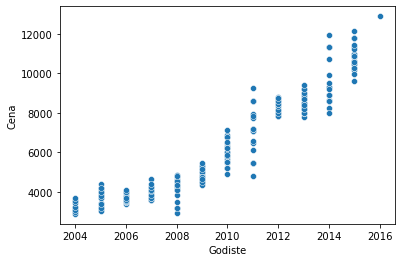

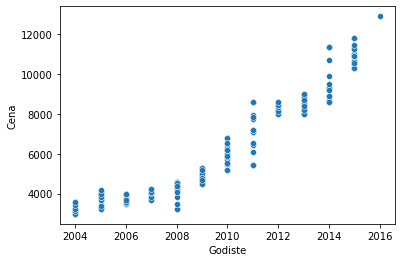

-----------------------------------
Model 118


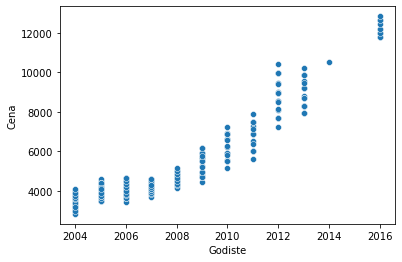

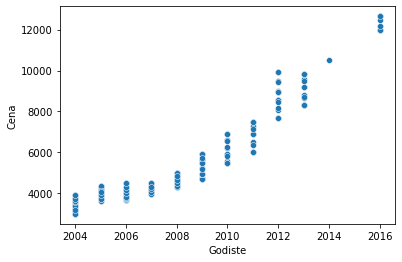

-----------------------------------
Model 147


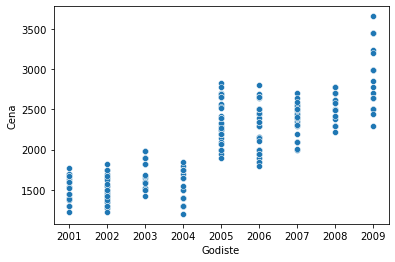

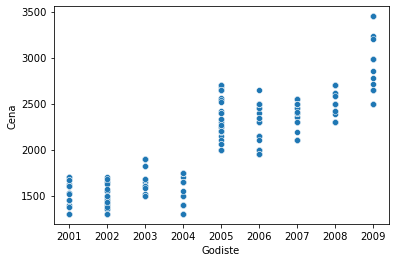

-----------------------------------
Model 159


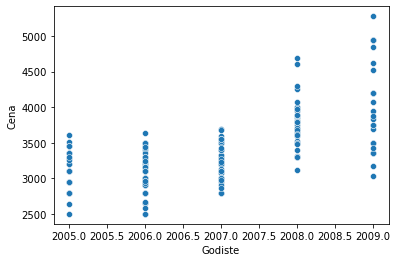

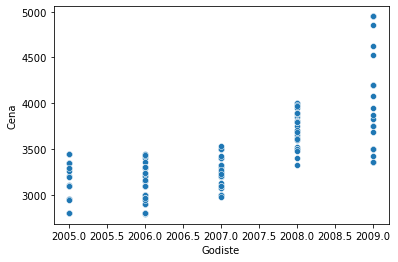

-----------------------------------
Model 206


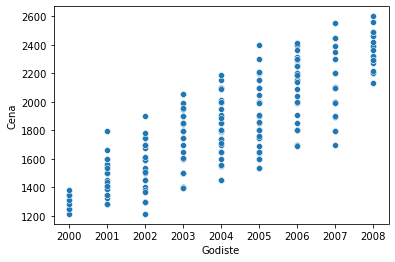

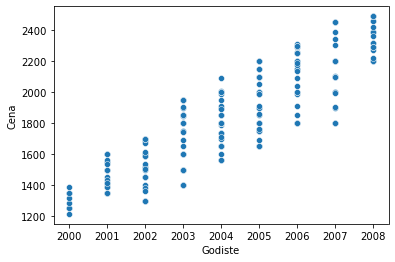

-----------------------------------
Model 207


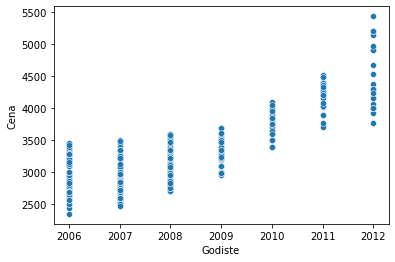

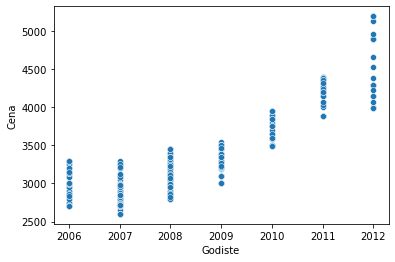

-----------------------------------
Model 208


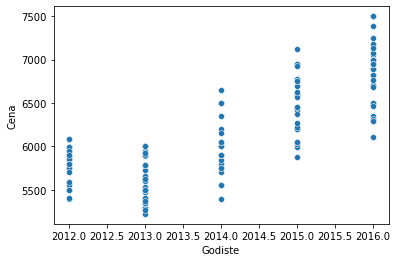

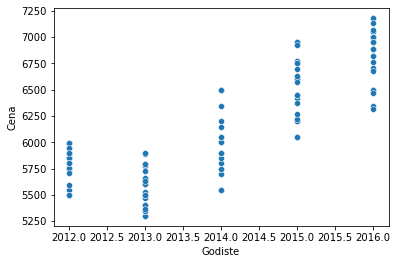

-----------------------------------
Model 3


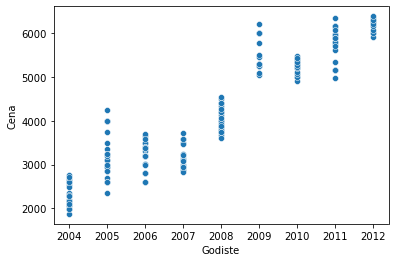

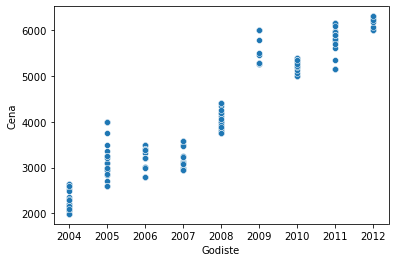

-----------------------------------
Model 3008


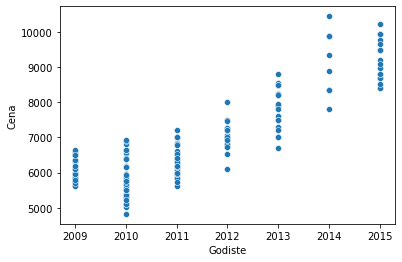

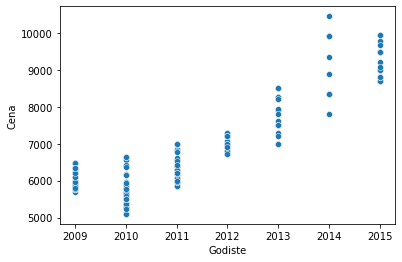

-----------------------------------
Model 307


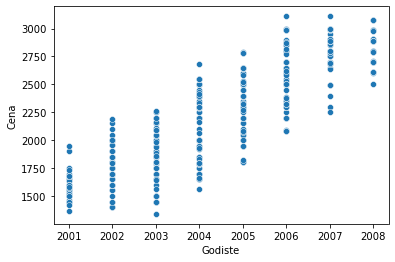

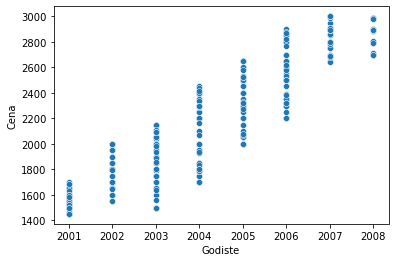

-----------------------------------
Model 308


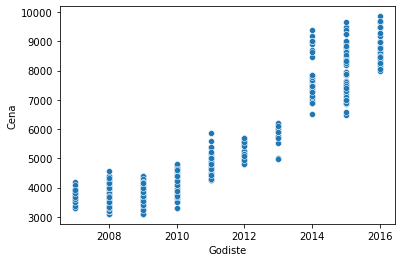

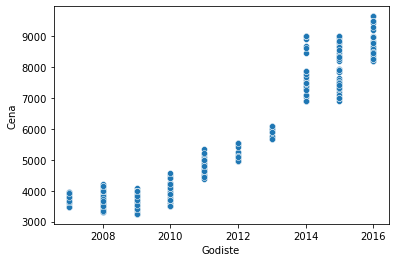

-----------------------------------
Model 316


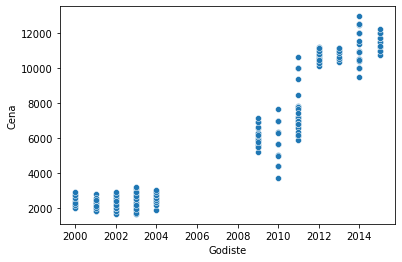

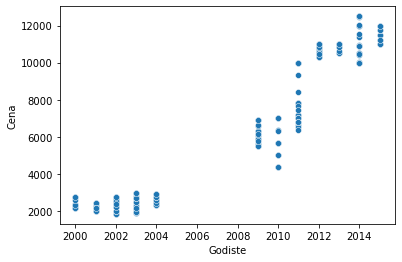

-----------------------------------
Model 318


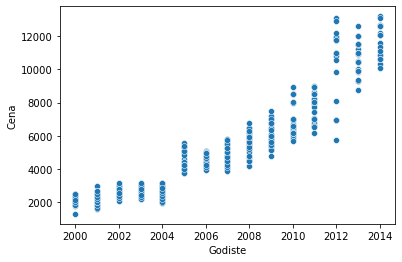

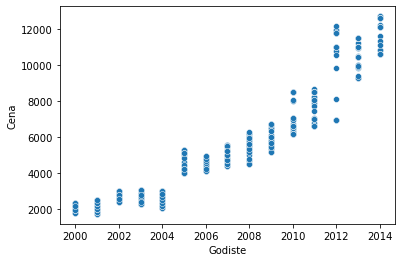

-----------------------------------
Model 320


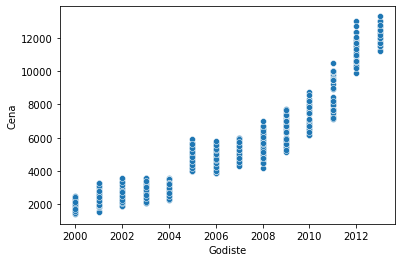

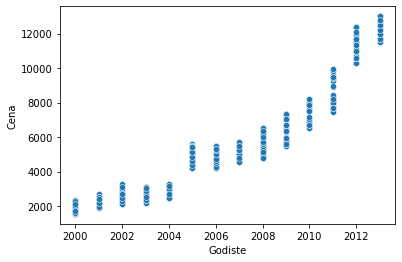

-----------------------------------
Model 407


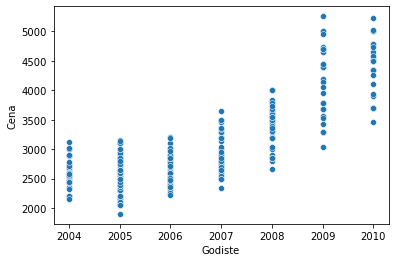

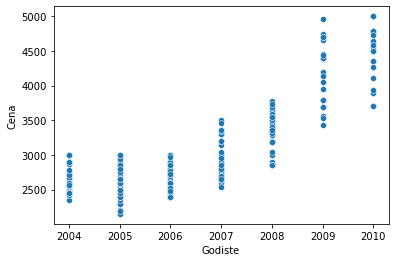

-----------------------------------
Model 500


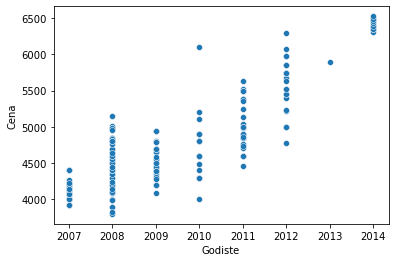

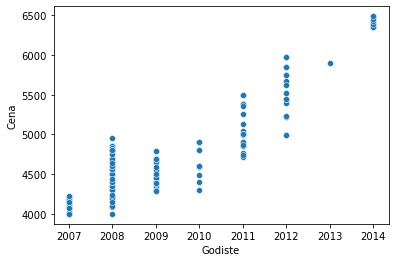

-----------------------------------
Model 508


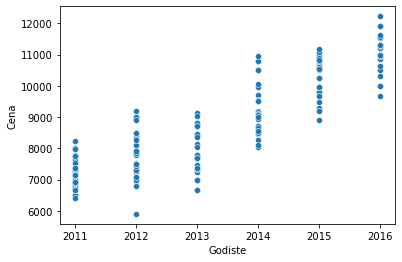

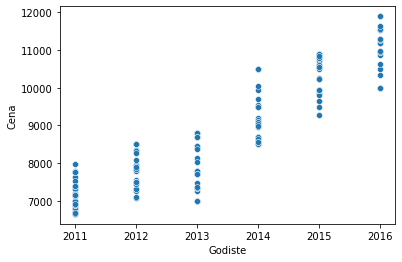

-----------------------------------
Model 520


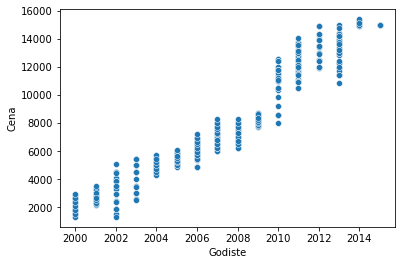

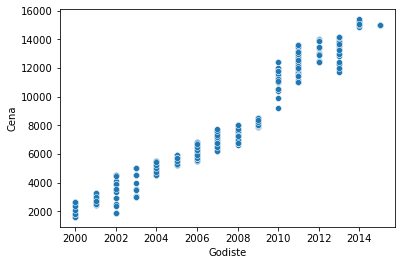

-----------------------------------
Model 6


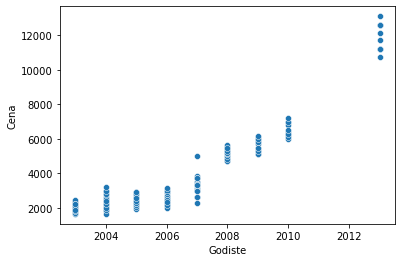

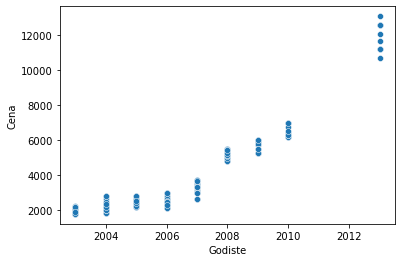

-----------------------------------
Model A 160


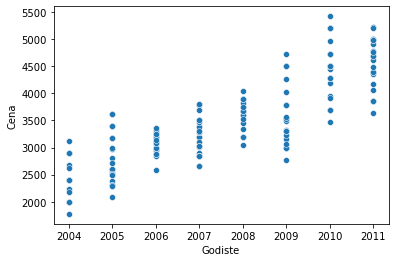

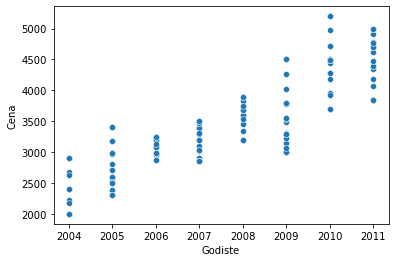

-----------------------------------
Model A 170


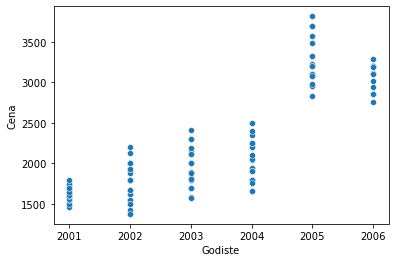

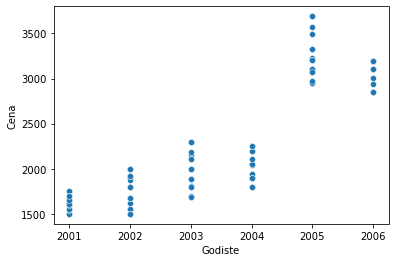

-----------------------------------
Model A 180


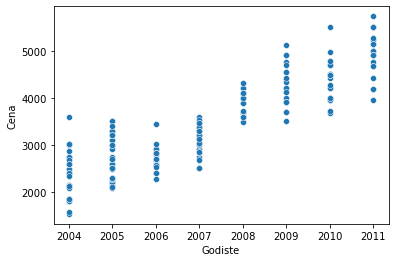

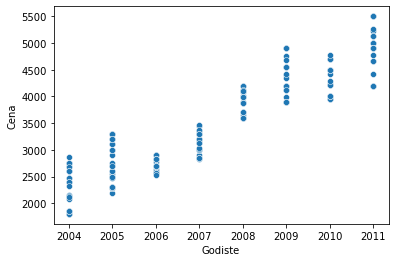

-----------------------------------
Model A3


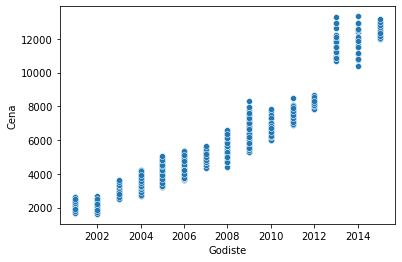

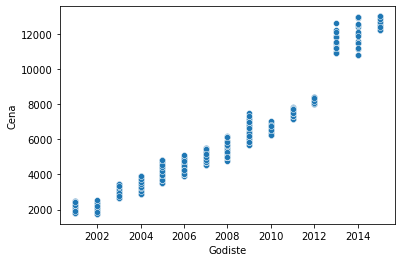

-----------------------------------
Model A4


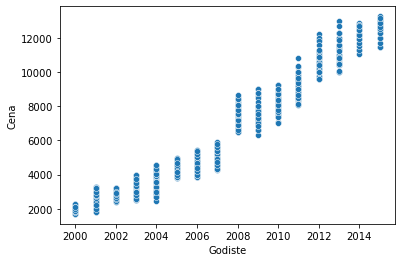

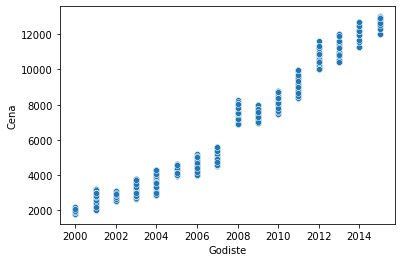

-----------------------------------
Model A6


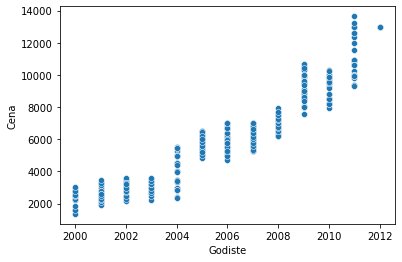

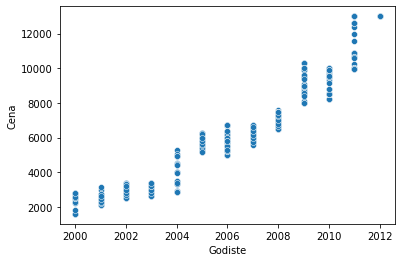

-----------------------------------
Model Astra G


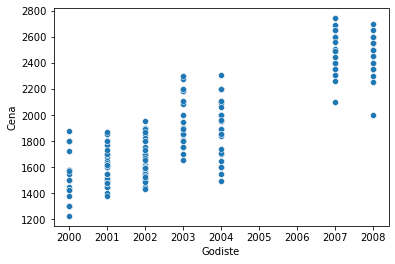

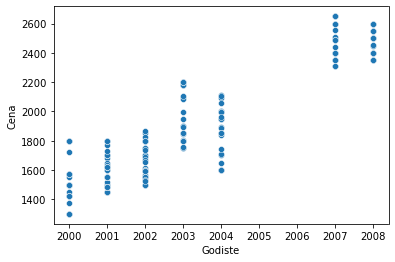

-----------------------------------
Model Astra H


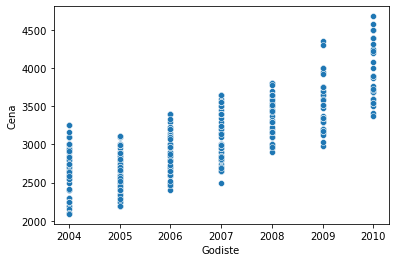

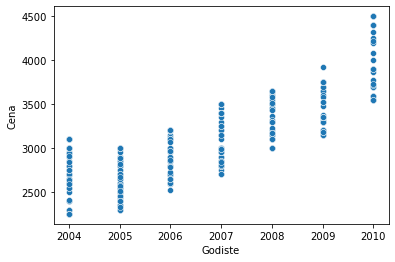

-----------------------------------
Model Astra J


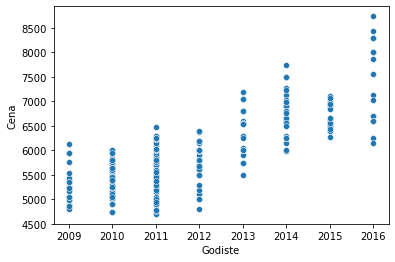

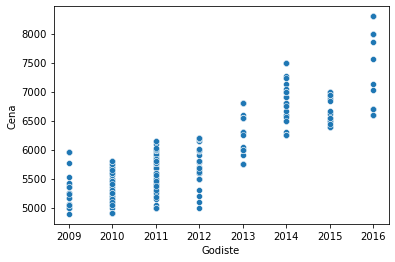

-----------------------------------
Model B 180


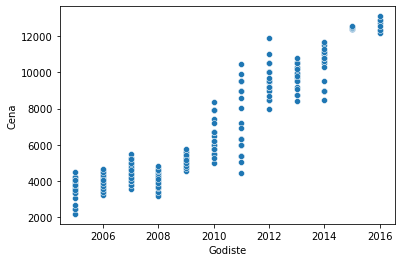

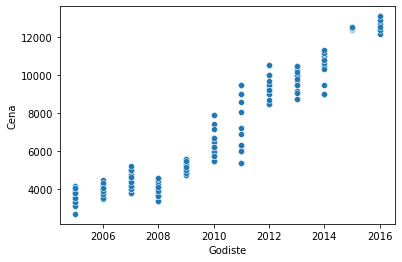

-----------------------------------
Model Bravo


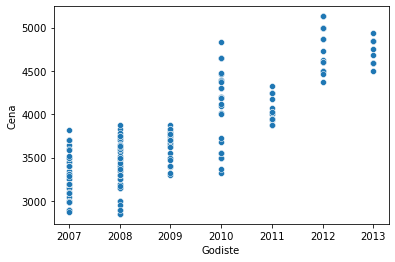

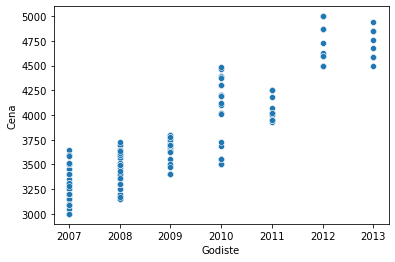

-----------------------------------
Model C 200


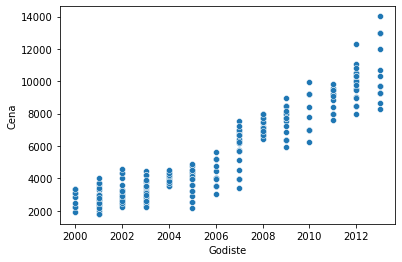

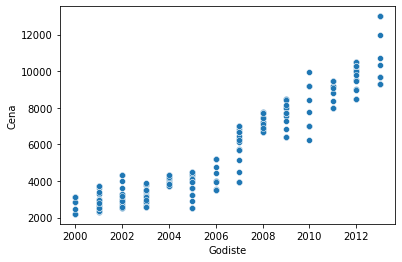

-----------------------------------
Model C-Max


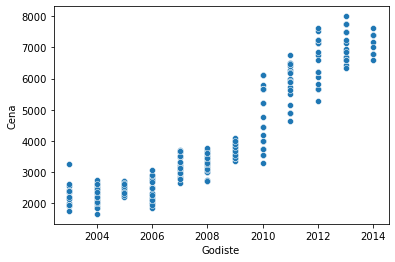

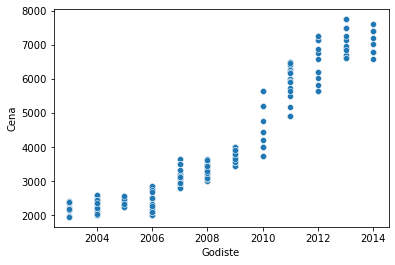

-----------------------------------
Model C3


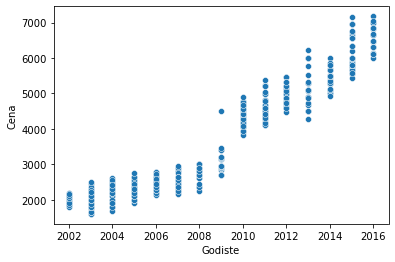

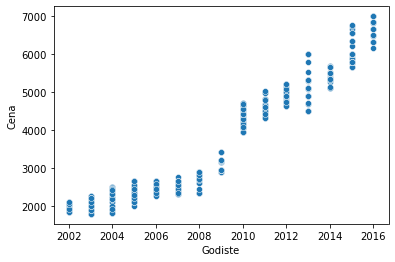

-----------------------------------
Model C4


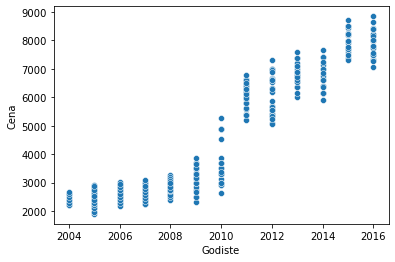

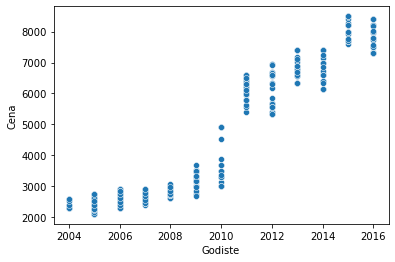

-----------------------------------
Model C4 Grand Picasso


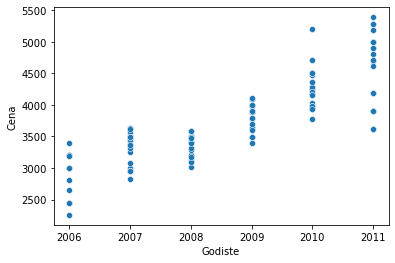

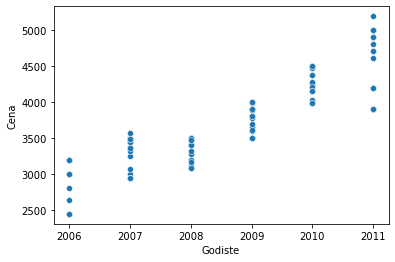

-----------------------------------
Model C4 Picasso


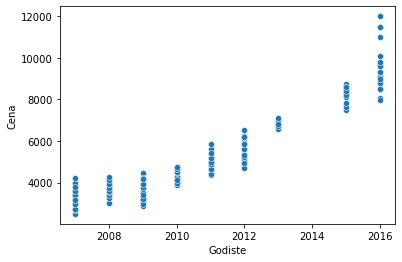

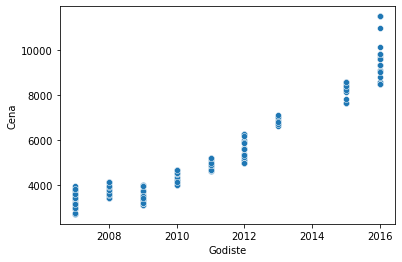

-----------------------------------
Model C5


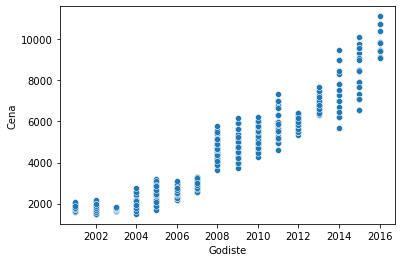

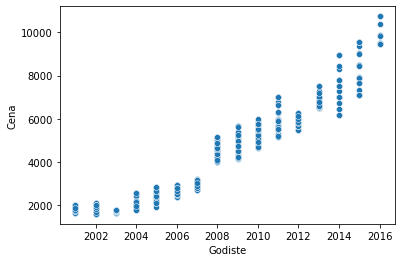

-----------------------------------
Model Clio


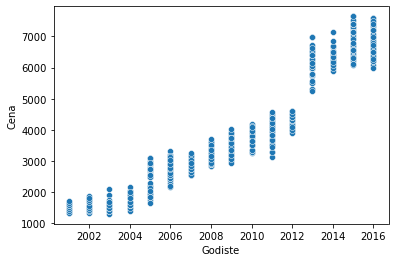

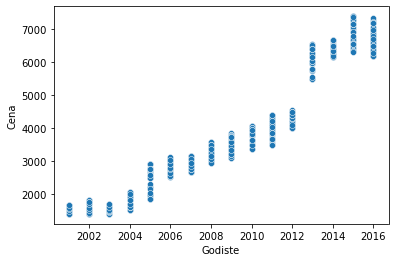

-----------------------------------
Model Cooper


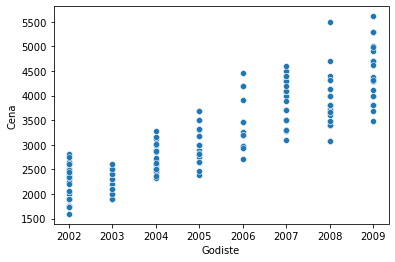

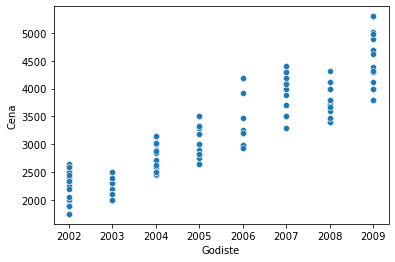

-----------------------------------
Model Corsa C


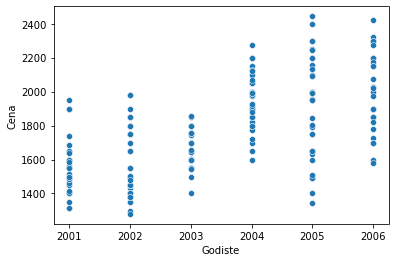

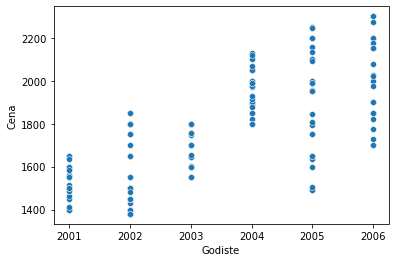

-----------------------------------
Model Corsa D


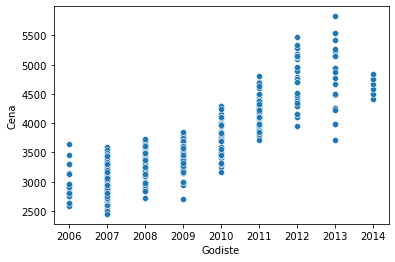

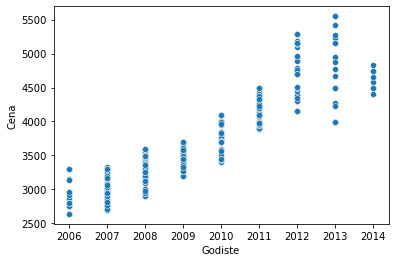

-----------------------------------
Model E 220


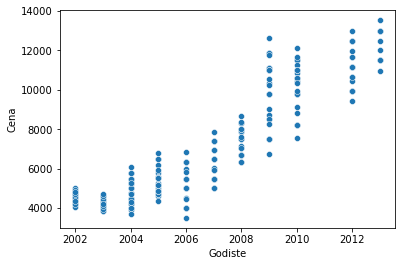

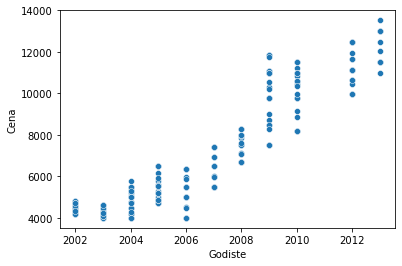

-----------------------------------
Model Fabia


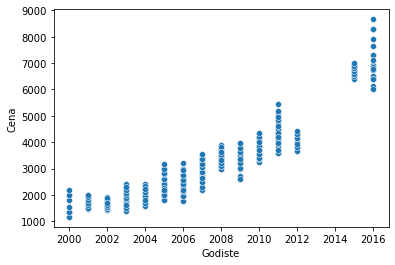

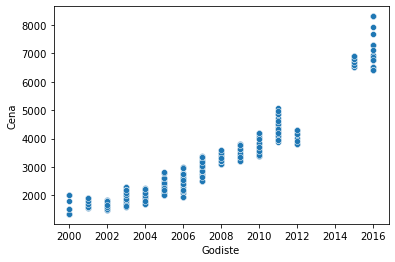

-----------------------------------
Model Fiesta


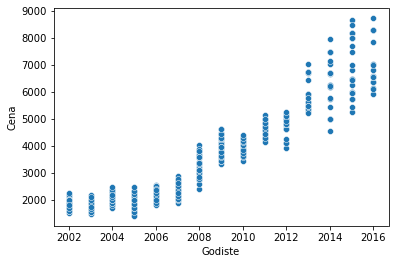

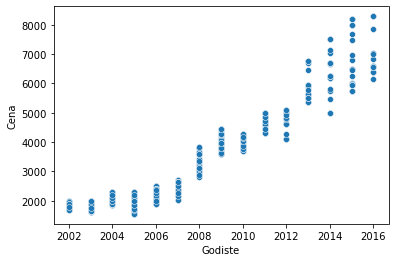

-----------------------------------
Model Focus


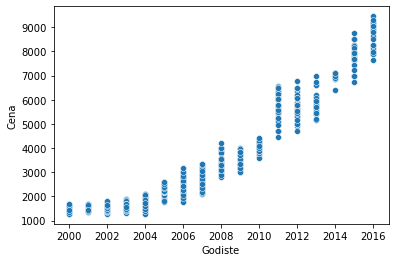

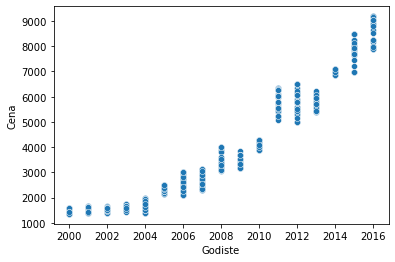

-----------------------------------
Model Giulietta


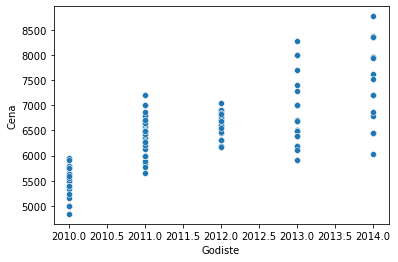

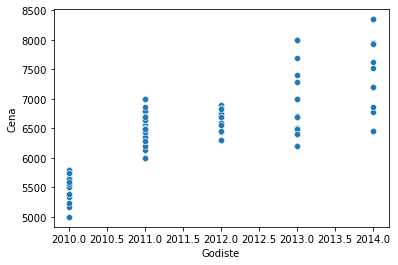

-----------------------------------
Model Golf 4


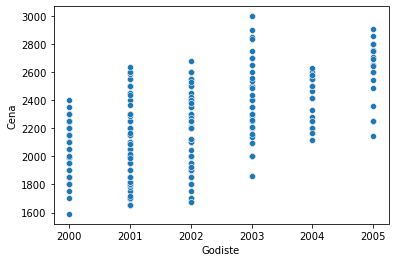

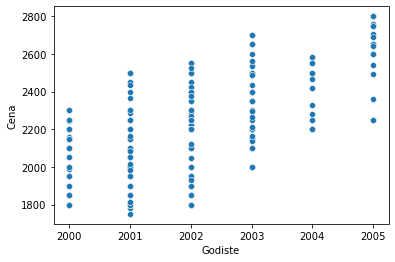

-----------------------------------
Model Golf 5


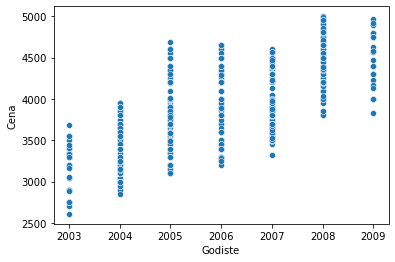

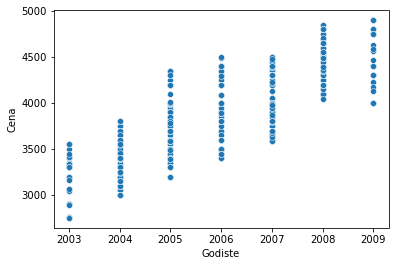

-----------------------------------
Model Golf 6


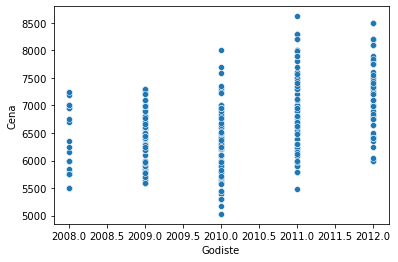

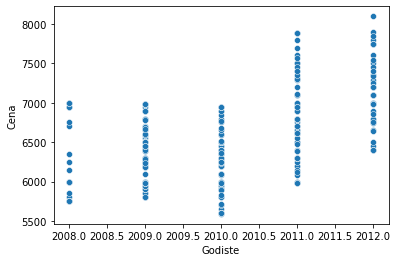

-----------------------------------
Model Golf 7


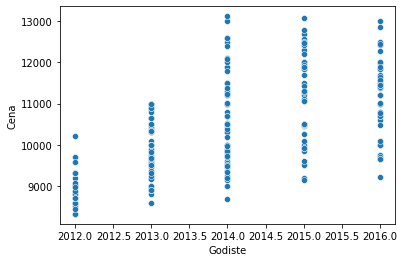

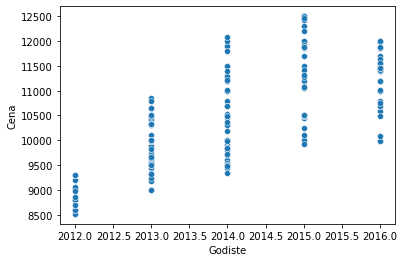

-----------------------------------
Model Golf Plus


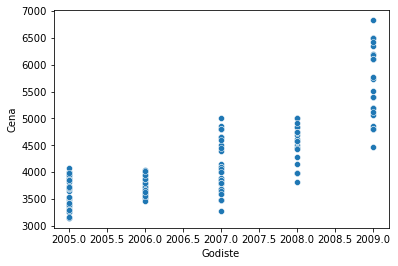

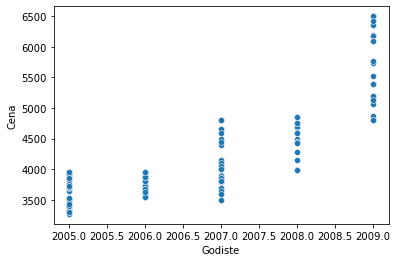

-----------------------------------
Model Grand Scenic


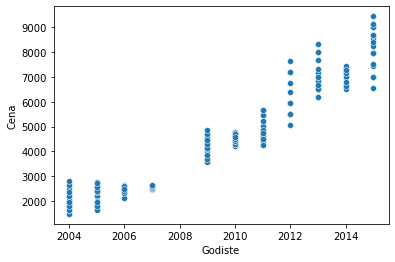

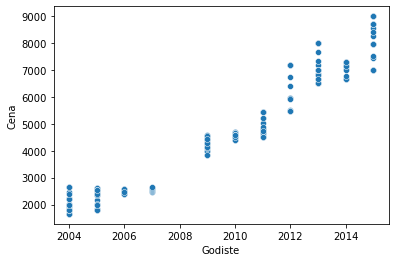

-----------------------------------
Model Grande Punto


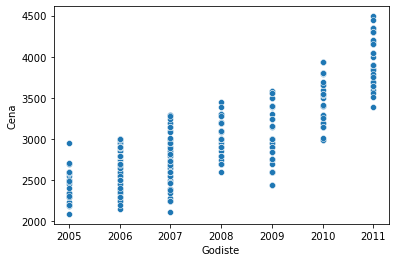

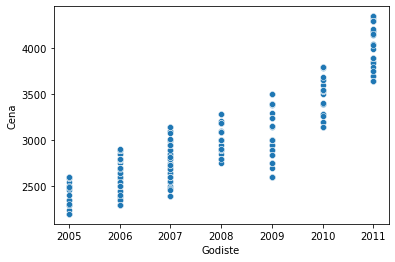

-----------------------------------
Model Ibiza


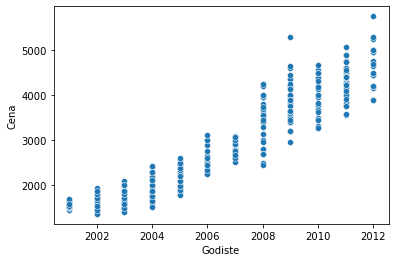

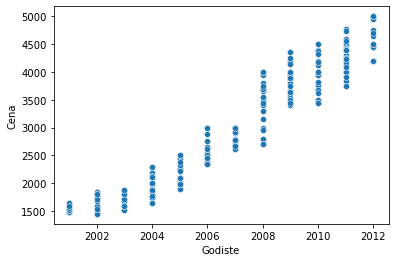

-----------------------------------
Model Insignia


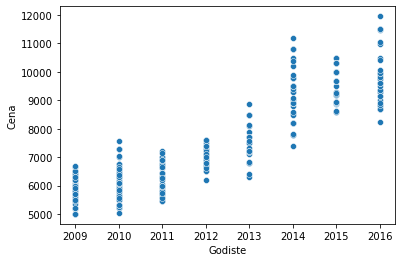

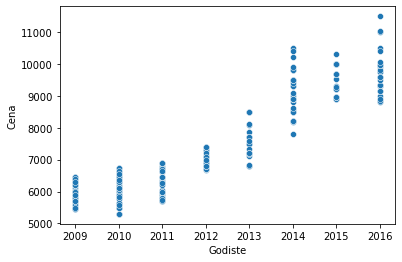

-----------------------------------
Model Kuga


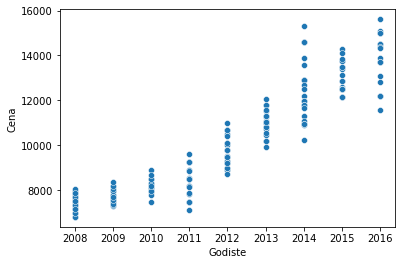

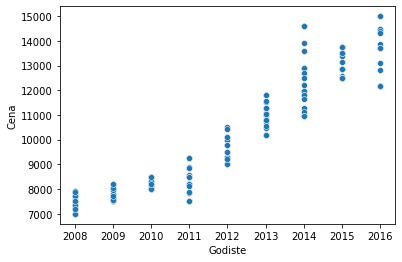

-----------------------------------
Model Laguna


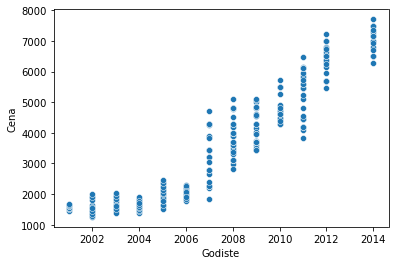

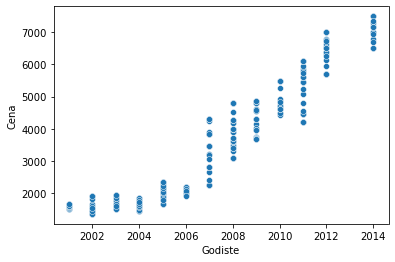

-----------------------------------
Model Leon


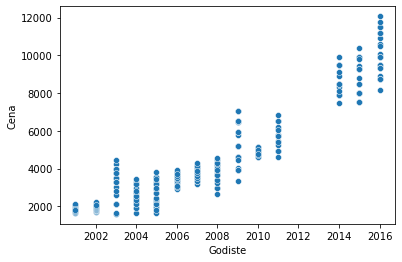

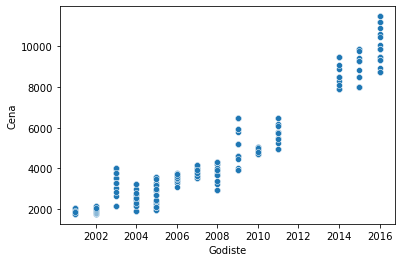

-----------------------------------
Model Megane


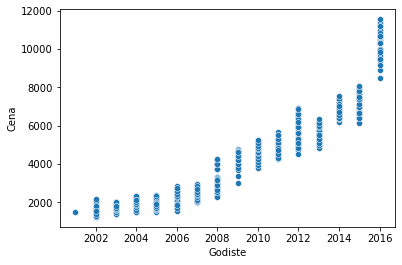

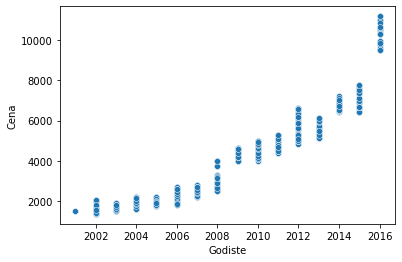

-----------------------------------
Model Meriva


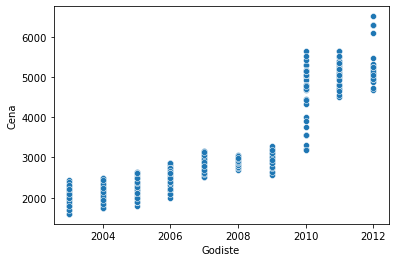

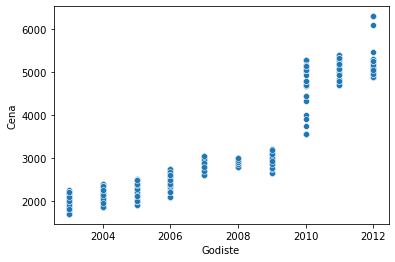

-----------------------------------
Model Modus


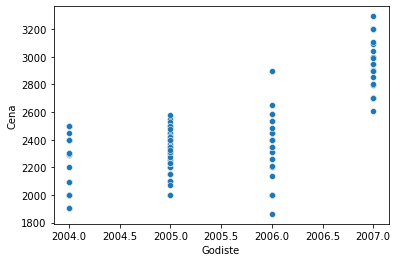

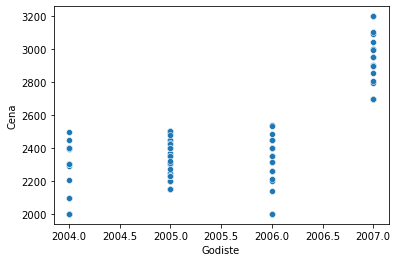

-----------------------------------
Model Mondeo


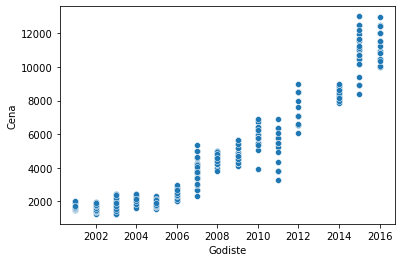

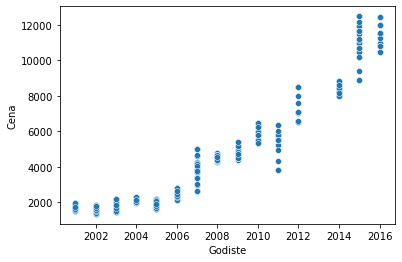

-----------------------------------
Model Octavia


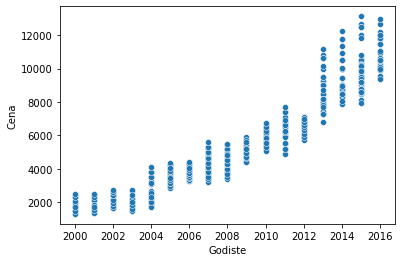

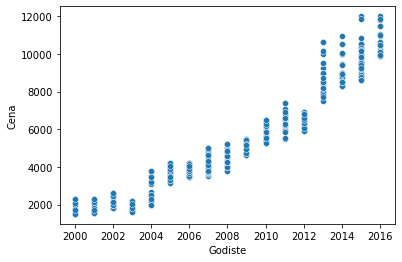

-----------------------------------
Model Panda


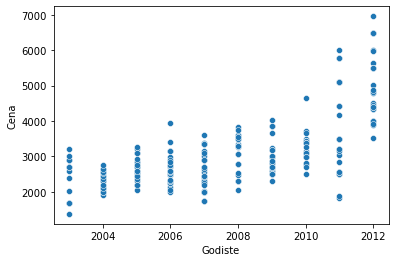

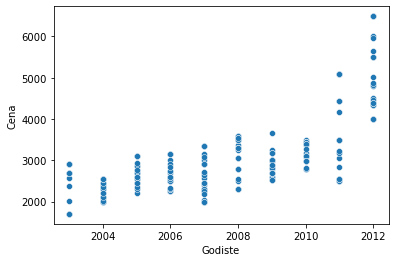

-----------------------------------
Model Passat B5.5


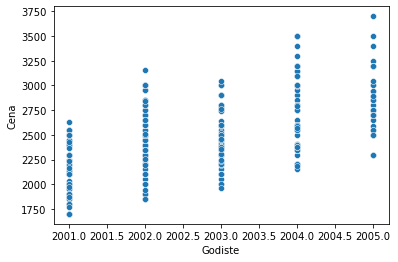

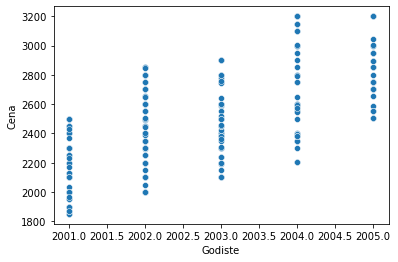

-----------------------------------
Model Passat B6


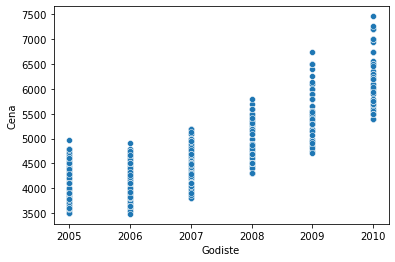

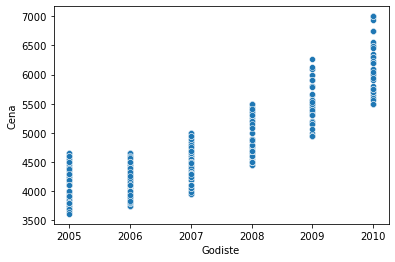

-----------------------------------
Model Passat B7


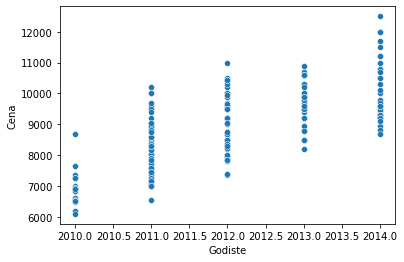

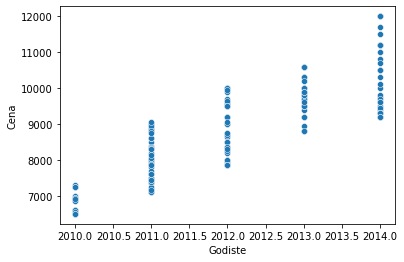

-----------------------------------
Model Polo


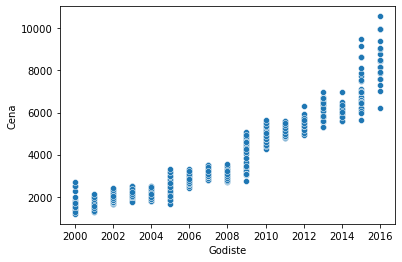

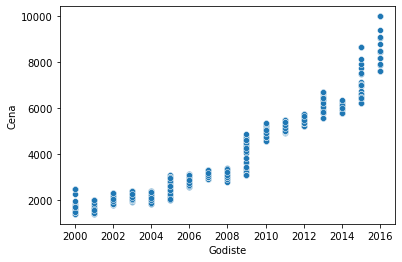

-----------------------------------
Model Punto


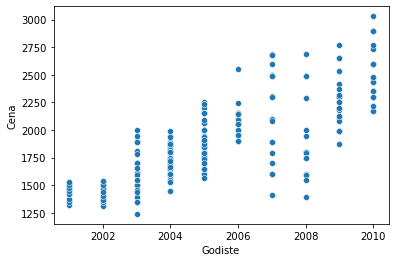

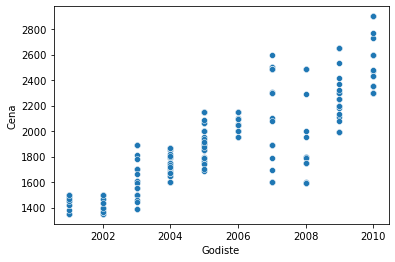

-----------------------------------
Model Qashqai


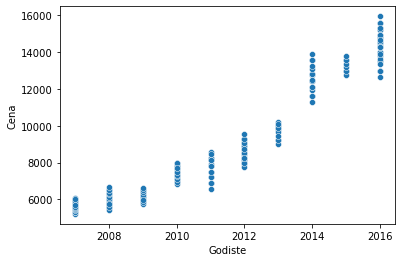

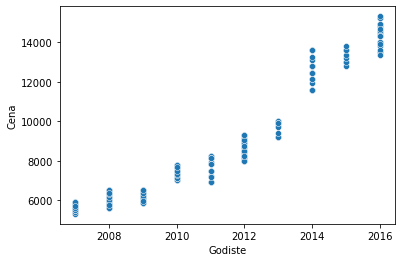

-----------------------------------
Model Scenic


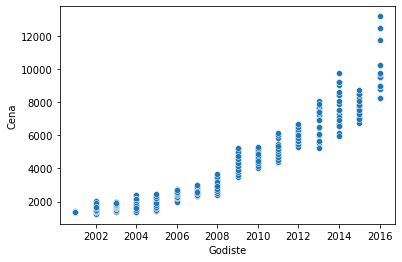

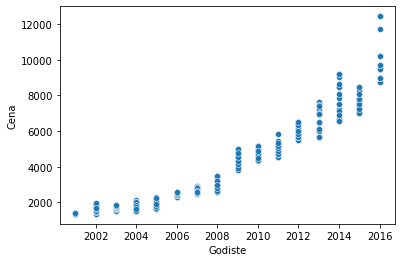

-----------------------------------
Model Sharan


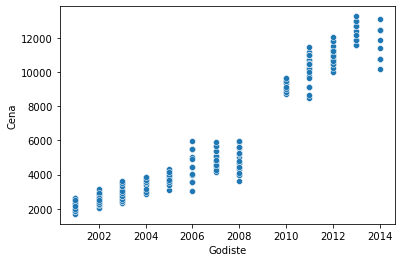

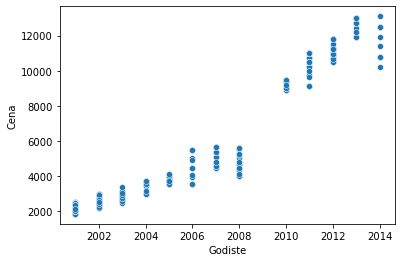

-----------------------------------
Model Stilo


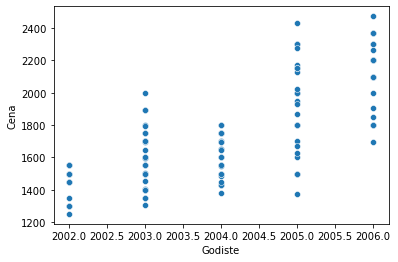

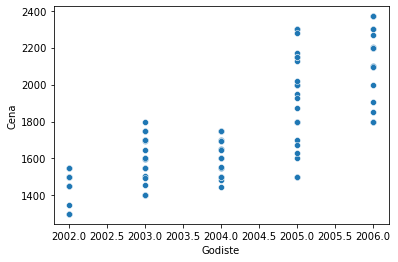

-----------------------------------
Model Superb


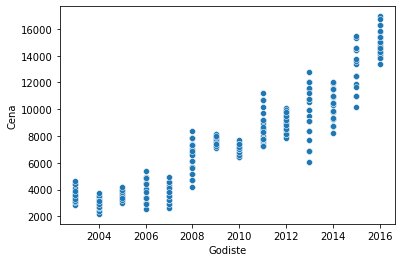

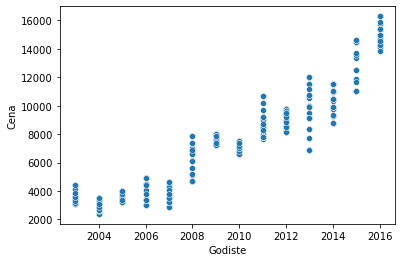

-----------------------------------
Model Tiguan


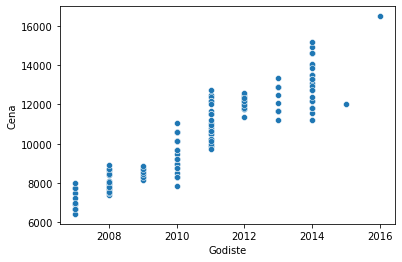

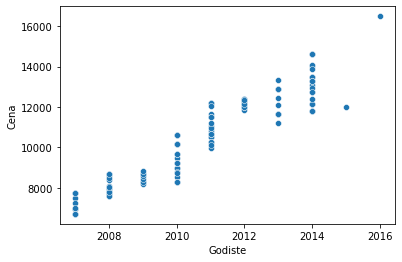

-----------------------------------
Model Twingo


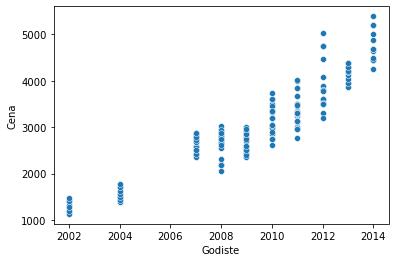

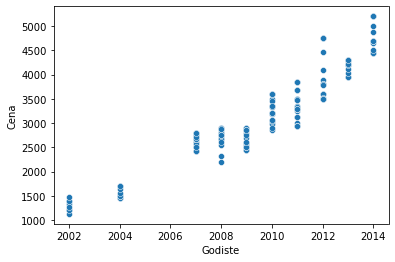

-----------------------------------
Model V50


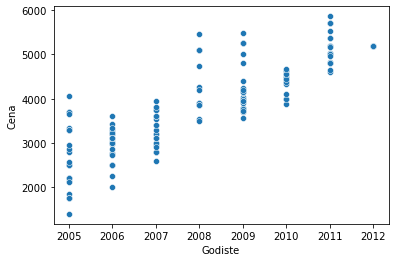

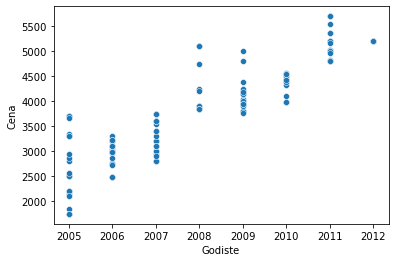

-----------------------------------
Model Vectra C


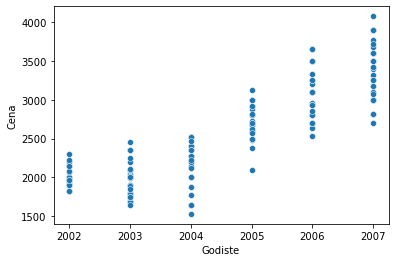

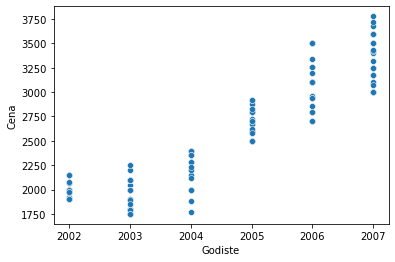

-----------------------------------
Model X3


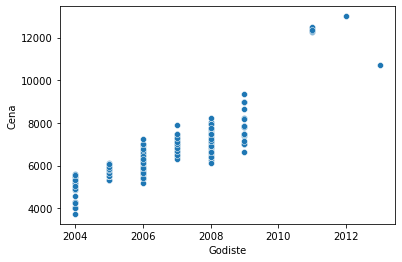

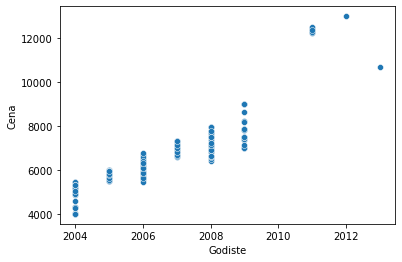

-----------------------------------
Model Xsara Picasso


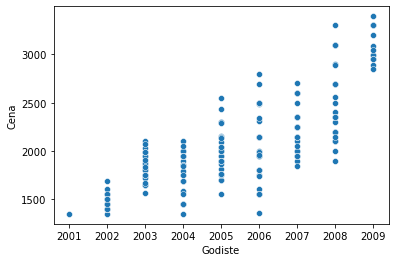

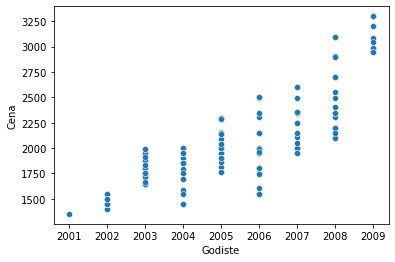

-----------------------------------
Model Yaris


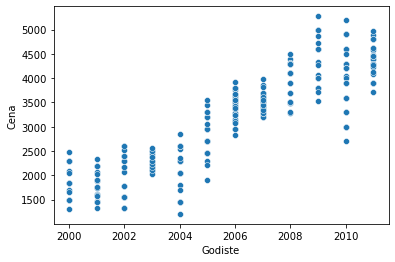

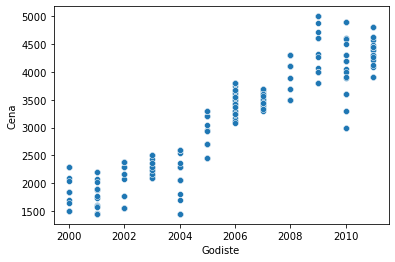

-----------------------------------
Model Zafira


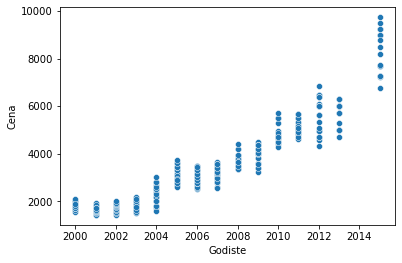

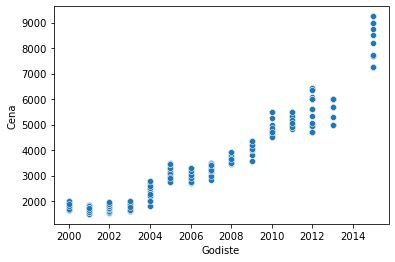

In [107]:
for model in df['Model'].unique():
    
    print('-'*35)
    print('Model {}'.format(model))
    sns.scatterplot('Godiste', 'Cena', data=df[df['Model']==model])
    plt.show()

    for year in range(df[df['Model']==model]['Godiste'].min(), df[df['Model']==model]['Godiste'].max()+1):
        if df[(df['Model']==model) & (df['Godiste']==year)].count()[0]>10:
            upper = df[(df['Model']==model) & (df['Godiste']==year)]['Cena'].quantile(0.90)
            lower = df[(df['Model']==model) & (df['Godiste']==year)]['Cena'].quantile(0.1)
            df.drop(df[(df['Model']==model) & (df['Godiste']==year) & (df['Cena']>upper)].index, inplace=True)
            df.drop(df[(df['Model']==model) & (df['Godiste']==year) & (df['Cena']< lower)].index, inplace=True)
        if df[(df['Model']==model) & (df['Godiste']==year)].count()[0]<3:
            df.drop(df[(df['Model']==model) & (df['Godiste']==year)].index, inplace=True)

    sns.scatterplot('Godiste', 'Cena', data=df[df['Model']==model])
    plt.show()
    

In [135]:
for year in sorted(df['Godiste'].unique()):
    print(year)
    print(df[df['Godiste']==year]['Kilometraza'].min(), " - ", df[df['Godiste']==year]['Kilometraza'].max())
    print(df[df['Godiste']==year]['Kilometraza'].mean())
    print(df[df['Godiste']==year]['Kilometraza'].std())
    

2000
106654  -  316225
233148.70278637772
49729.63672823852
2001
110329  -  324028
235596.57468879668
45710.23855816396
2002
109289  -  325143
223465.6223076923
43966.755344123754
2003
110655  -  324913
220626.61837692824
41640.68621324548
2004
109686  -  324805
217940.70818134444
41649.21434114842
2005
112834  -  322108
214541.2622749591
40792.76314693636
2006
108710  -  318000
212276.85366810515
40934.96843597382
2007
108666  -  318210
204794.18128881988
40567.18317938816
2008
109651  -  323700
202304.3248564397
39853.8731559745
2009
112000  -  316000
200221.79254829808
39335.04099067841
2010
109292  -  321291
197167.107442348
40041.892532747166
2011
108509  -  304379
196954.14269599548
37742.11346984874
2012
79322  -  322801
196196.09361702128
41787.499421210545
2013
88545  -  297605
192024.6875
37093.167423381055
2014
85978  -  290000
182253.58948545862
37199.73303580864
2015
94206  -  263000
175277.92
31054.378266113872
2016
91000  -  224405
162162.7962962963
29726.838514491097


In [136]:
df.dropna(inplace=True)

In [150]:
df['Kilometraza']>30000

325143

In [155]:
def convert_mileage(row):
    for i in range(80000, 320000, 10000):
        if row>=i and row<i+10000:
            return str(i)+"-"+str(i+10000)
        

df['Km_cat'] = df['Kilometraza'].apply(lambda x: convert_mileage(x))

<AxesSubplot:xlabel='Cena', ylabel='Km_cat'>

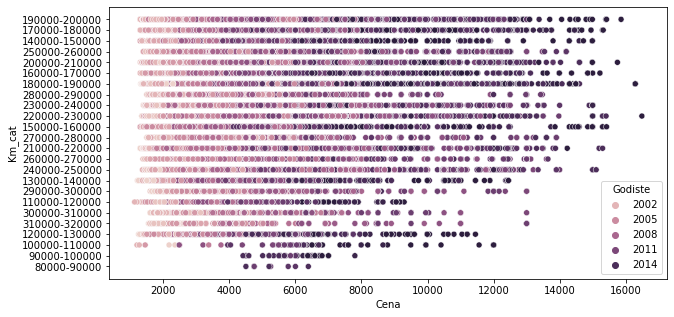

In [165]:

plt.figure(figsize=(10,5))
sns.scatterplot(df['Cena'], df['Km_cat'], data=df, hue='Godiste')

<AxesSubplot:xlabel='prosek_god_km', ylabel='Km_cat'>

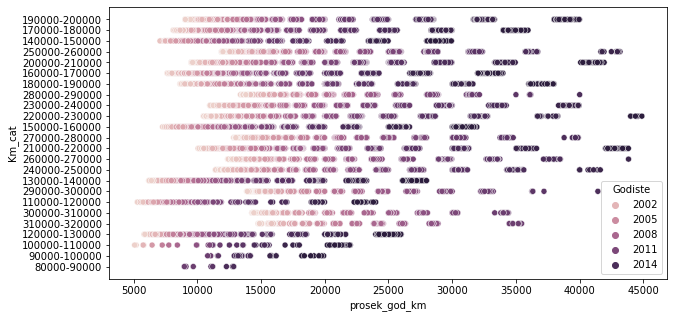

In [168]:
plt.figure(figsize=(10,5))
sns.scatterplot(df['prosek_god_km'], df['Km_cat'], data=df, hue='Godiste')

In [166]:
df

,Marka,Model,Godiste,Kilometraza,Karoserija,Gorivo,Kubikaza,Snaga motora,Cena,EKM,Pogon,Menjac,Klima,Boja,Materijal enterijera,prosek_god_km,Starost,Km_cat
0,BMW,116,2015,194000,Hecbek,Dizel,1.5,115,10900.000000,Euro 6,Zadnji,Manuelni 6 brzina,Manuelna klima,Plava,Stof,32333.333333,6,190000-200000
1,BMW,116,2015,176000,Hecbek,Dizel,1.5,115,10990.000000,Euro 6,Zadnji,Manuelni 6 brzina,Manuelna klima,Crna,Stof,29333.333333,6,170000-180000
2,BMW,116,2015,197000,Hecbek,Dizel,1.5,115,10290.000000,Euro 6,Zadnji,Manuelni 6 brzina,Automatska klima,Plava,Stof,32833.333333,6,190000-200000
3,BMW,116,2016,141000,Hecbek,Dizel,1.5,115,12900.000000,Euro 6,Zadnji,Manuelni 6 brzina,Automatska klima,Crna,Stof,28200.000000,5,140000-150000
4,BMW,116,2015,250000,Hecbek,Dizel,1.5,115,10500.000000,Euro 6,Zadnji,Manuelni 6 brzina,Automatska klima,Crna,Stof,41666.666667,6,250000-260000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31815,Opel,Zafira,2015,187916,MiniVan,Dizel,1.6,135,8503.423953,Euro 6,Prednji,Manuelni 6 brzina,Automatska klima,Siva,Prirodna koza,31319.333333,6,180000-190000
31816,Opel,Zafira,2015,184290,MiniVan,Dizel,1.6,135,8990.000000,Euro 6,Prednji,Manuelni 6 brzina,Automatska klima,Siva,Prirodna koza,30715.000000,6,180000-190000
31818,Opel,Zafira,2015,164116,MiniVan,Dizel,1.6,135,9250.000000,Euro 6,Prednji,Manuelni 6 brzina,Automatska klima,Plava,Prirodna koza,27352.666667,6,160000-170000
31819,Opel,Zafira,2015,164965,MiniVan,Dizel,1.6,135,8763.423953,Euro 6,Prednji,Manuelni 6 brzina,Automatska klima,Plava,Prirodna koza,27494.166667,6,160000-170000


In [167]:
#df.to_csv('./Data/cleanedUsedCars.csv', index=False)
df.to_csv('./Data/usedCleanedPre.csv', index=False)